In [1]:
#imports
import pandas as pd
import seaborn as sns
import seaborn
import matplotlib.pyplot as plt
import matplotlib
import textwrap
import plotly.express as px
pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", None)
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from matplotlib.pyplot import figure
import numpy as np
import folium
import squarify
import geopandas as gpd
from shapely.geometry import Point
import contextily as ctx
import plotly.graph_objects as go
from folium.plugins import MarkerCluster
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
%matplotlib inline
from matplotlib.pylab import rcParams
from statsmodels.tsa.stattools import adfuller
!pip install pmdarima --quiet
import pmdarima as pm

/Users/user/opt/anaconda3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
daal4py 2021.5.0 requires daal==2021.4.0, which is not installed.
numba 0.55.1 requires numpy<1.22,>=1.18, but you have numpy 1.22.4 which is incompatible.


data points: 

Monthly Data that is in the process of scraping from Toronto Real Estate Board:

Sales
Dollar Volume
Average Price
Median Price
New Listings 
SNLR Trend 
Active Listings 
Mos Inv (Trend)
Avg. SP/LP 
Avg. LDOM 
Avg. PDOM

look into daily 

monthly data available from stats can (via python) 

New Housing Price Index 

3yr Bond Rate
5yr Bond Rate
Bankers Acceptance rate 1 year 
Bank Rate 
Target Rate 
Prime Corporate Paper Rate 
Overnight Money Market Financing Rate
Mortgage Rate 


Employment Rate
Inflation Rate
Unemployement Rate 
GDP 
Residential building permits
Housing starts
Shelter price index
Population (15+)
Housing completions
Labour force

29 data points 


In [2]:
!pip install stats-can

In [3]:
import stats_can
#Selected Government of Canada benchmark bond yield, missing 3, 5, 7, and long term = Bond_2yr_Yield
#Government of Canada marketable bonds, average yield, average of Wednesdays: 1-3 year = Bond_1-3yr_Avg
#Overnight money market financing, 7 day average = Overnight_financing
#Treasury bill auction - average yields: 3 month = Treasury_Bill_Auction
#Canada Mortgage and Housing Corporation, conventional mortgage lending rate, 5-year term
#Canada Mortgage and Housing Corporation, absorptions and unabsorbed inventory, newly completed dwellings, by type of dwelling unit in census metropolitan areas


eco_vec_map = {
               'GDP':'v65201210', 
              'New_Housing_Price_Index':'v111955443', 
              'Bank_Rate':'v122530', 
              'Bond_2yr_Yield': 'v122538',
              'Bond_1-3yr_Avg': 'v122499', 
              'Overnight_financing': 'v122514', 
              'Treasury_Bill_Auction': 'v122541', 
              'CPI_Can': 'v41690973',
              'TO_Units_Absorbed': 'v1930492', 
              'TO_Units_Unabsorbed': 'v1930777', 
              'CAN_Mort_Lending_Rate5yr': 'v733833', 
              'GDP': 'v65201210',
              'Inflation': 'v108785713', 
              'ON_Starts_Homeowner': 'v15818403', 
              'ON_Starts_Renter': 'v15818414', 
              'ON_Employed_Tot': 'v1546047997', 
              'ON_Unemployment_Rate': 'v2063949', 
              'Mortgage_Var_Rate': 'v122667776', 
              'Mortgage_Fixed_Rate_1yr': 'v122667777', 
              'Mortgage_Fixed_Rate_3yr': 'v122667778', 
              'Mortgage_Fixed_Rate_5yr': 'v122667779',  
              }

vectors = list(eco_vec_map.values())
df = stats_can.sc.vectors_to_df(vectors, periods = 137)
inv_map = {v: k for k, v in eco_vec_map.items()}
df.columns = df.columns.to_series().map(inv_map)
df.index.names = ['Date']

exo_stats = df.copy()

In [4]:
exo_stats

,CAN_Mort_Lending_Rate5yr,Mortgage_Var_Rate,Mortgage_Fixed_Rate_1yr,Mortgage_Fixed_Rate_3yr,Mortgage_Fixed_Rate_5yr,ON_Employed_Tot,ON_Starts_Homeowner,ON_Starts_Renter,TO_Units_Absorbed,TO_Units_Unabsorbed,Bond_1-3yr_Avg,Overnight_financing,Bank_Rate,Bond_2yr_Yield,Treasury_Bill_Auction,ON_Unemployment_Rate,GDP,Inflation,New_Housing_Price_Index,CPI_Can
Date,,,,,,,,,,,,,,,,,,,,
2011-12-01,NaN,NaN,NaN,NaN,NaN,5720401.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-01,NaN,NaN,NaN,NaN,NaN,5563511.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1702312.0,NaN,NaN,NaN
2012-02-01,4.23,NaN,NaN,NaN,NaN,5550773.0,2076.0,572.0,947.0,100.0,NaN,NaN,NaN,NaN,NaN,NaN,1697912.0,2.2,89.6,121.2
2012-03-01,4.21,NaN,NaN,NaN,NaN,5585320.0,2228.0,287.0,940.0,99.0,1.21,0.9980,1.25,1.19,0.926,7.7,1702210.0,1.7,89.9,121.7
2012-04-01,4.36,NaN,NaN,NaN,NaN,5639260.0,2892.0,387.0,999.0,105.0,1.29,1.0079,1.25,1.43,1.042,8.0,1708110.0,2.0,90.2,122.2
2012-05-01,4.35,NaN,NaN,NaN,NaN,5735511.0,2794.0,596.0,1200.0,122.0,1.22,1.0000,1.25,1.11,1.006,8.2,1710842.0,1.8,90.4,122.1
2012-06-01,4.25,NaN,NaN,NaN,NaN,5793351.0,2906.0,311.0,1205.0,144.0,1.05,0.9984,1.25,0.99,0.902,8.1,1711716.0,1.8,90.7,121.6
2012-07-01,4.23,NaN,NaN,NaN,NaN,5696020.0,3070.0,343.0,1236.0,129.0,1.00,0.9974,1.25,0.96,0.972,8.0,1715089.0,1.6,90.7,121.5
2012-08-01,4.23,NaN,NaN,NaN,NaN,5662325.0,3188.0,656.0,987.0,129.0,1.17,0.9990,1.25,1.15,1.034,8.1,1712835.0,1.7,90.9,121.8


In [5]:
# CPI_Can
# New_Housing_Price_Index
# Inflation
# GDP
# ON_Unemployment_Rate
# Bank_Rate
# CAN_Mort_Lending_Rate5yr
# Mortgage_Var_Rate
# Mortgage_Fixed_Rate_5yr
# TO_Units_Absorbed 
# Bond_1-3yr_Avg

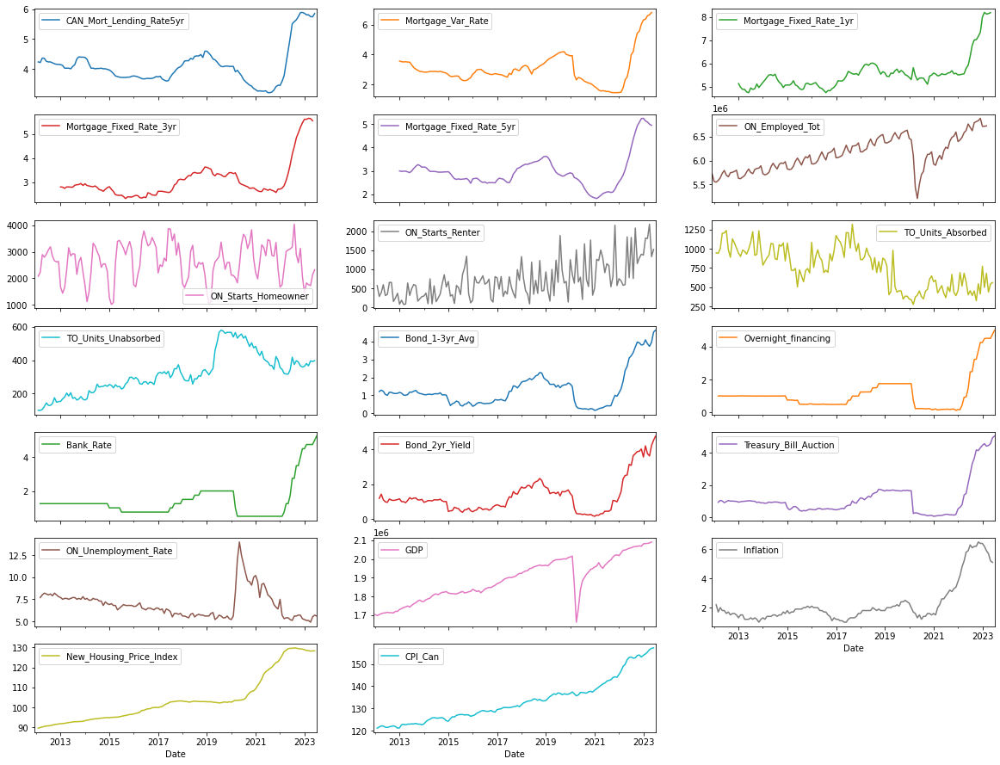

In [6]:
exo_stats.plot(subplots = True, figsize = (20,20), layout = (9,3));

In [7]:
yearly_income = {
               'Average_Income_Yearly': 'v96416850' 
              }

vectors = list(yearly_income.values())
df1 = stats_can.sc.vectors_to_df(vectors, periods = 11)
inv_map = {v: k for k, v in yearly_income.items()}
df1.columns = df1.columns.to_series().map(inv_map)
df1.index.names = ['Date']

income_stats = df1.copy()

In [8]:
income_stats

,Average_Income_Yearly
Date,
2011-01-01,87500.0
2012-01-01,89300.0
2013-01-01,90700.0
2014-01-01,91800.0
2015-01-01,92300.0
2016-01-01,91400.0
2017-01-01,93900.0
2018-01-01,94400.0
2019-01-01,94400.0


In [9]:
import os

excel_directory = '/Users/user/Desktop/TMU 2022/MRP/Code/Housing Data/'
combined_df = pd.DataFrame()
for filename in os.listdir(excel_directory):
    if filename.endswith('.xlsx'):
    
        file_path = os.path.join(excel_directory, filename)

        df = pd.read_excel(file_path)
 
        selected_row = df[df['Area'] == 'City of Toronto']
        selected_data = selected_row.iloc[:, 1:] 
        
        year, month = filename.split('.')[0].split('-')
        time = pd.to_datetime(f'{year}-{month}')

      
        selected_data.index = pd.Index([time], name='Date')
        
        combined_df = pd.concat([combined_df, selected_data])

print(combined_df)



            Sales   Dollar Volume Average Price Median Price New Listings  \
Date                                                                        
2015-10-01  3,431  $2,303,400,938      $671,350     $525,888        5,593   
2020-07-01  3,577  $3,638,954,125    $1,017,320     $810,000        6,930   
2021-04-01  4,694  $5,107,168,556    $1,088,021     $875,000        7,481   
2020-09-01  3,555  $3,633,390,955    $1,022,051     $840,000        8,689   
2018-03-01  2,797  $2,286,943,442      $817,642     $660,000        4,438   
2022-11-01  1,798  $1,889,316,028    $1,050,788     $851,000        3,562   
2013-01-01  1,559    $791,751,646      $507,859     $413,500        4,207   
2016-02-01  2,809  $2,022,039,822      $719,843     $549,900        4,476   
2017-04-01  4,164  $3,930,596,896      $943,947     $715,000        7,015   
2019-01-01  1,422  $1,105,852,860      $777,674     $647,000        3,144   
2015-06-01  4,406  $3,006,056,463      $682,264     $533,250        7,169   

In [10]:
combined_df.sort_values(by='Date', inplace = True) 

In [11]:
combined_df

,Sales,Dollar Volume,Average Price,Median Price,New Listings,SNLR Trend (%),Active Listings,Mos Inv (Trend),Avg. SP/LP (%),Avg. DOM,Avg. LDOM,Avg. PDOM
Date,,,,,,,,,,,,
2012-01-01,"1,705","$850,871,140","$499,045","$396,000","4,041",59.6%,"5,134",2.2,99%,31.0,NaN,NaN
2012-02-01,"2,686","$1,486,751,884","$553,519","$424,944","5,165",59.2%,"6,090",2.2,101%,22.0,NaN,NaN
2012-03-01,"3,682","$2,019,039,303","$548,354","$428,000","6,375",58.9%,"6,896",2.2,101%,21.0,NaN,NaN
2012-04-01,"3,925","$2,231,109,660","$568,436","$445,000","6,383",58.9%,"7,321",2.2,101%,21.0,NaN,NaN
2012-05-01,"4,130","$2,349,011,252","$568,768","$446,000","7,956",58.0%,"8,376",2.2,100%,20.0,NaN,NaN
2012-06-01,"3,520","$1,950,350,664","$554,077","$434,405","6,742",56.4%,"8,537",2.3,99%,21.0,NaN,NaN
2012-07-01,"2,721","$1,363,040,705","$500,934","$410,000","5,537",55.5%,"8,385",2.3,98%,26.0,NaN,NaN
2012-08-01,"2,282","$1,135,909,249","$497,769","$399,050","4,273",55.0%,"7,492",2.4,98%,29.0,NaN,NaN
2012-09-01,"2,255","$1,235,516,776","$547,901","$430,000","6,342",53.5%,"8,740",2.5,99%,28.0,NaN,NaN


In [12]:
print(combined_df.dtypes)

Sales               object
Dollar Volume       object
Average Price       object
Median Price        object
New Listings        object
SNLR Trend (%)      object
Active Listings     object
Mos Inv (Trend)    float64
Avg. SP/LP (%)      object
Avg. DOM           float64
Avg. LDOM          float64
Avg. PDOM          float64
dtype: object


In [13]:
combined_df[combined_df.columns[1:5]] = combined_df[combined_df.columns[1:5]].replace('[\$,]', '', regex=True).astype(np.int64)

In [14]:
combined_df

,Sales,Dollar Volume,Average Price,Median Price,New Listings,SNLR Trend (%),Active Listings,Mos Inv (Trend),Avg. SP/LP (%),Avg. DOM,Avg. LDOM,Avg. PDOM
Date,,,,,,,,,,,,
2012-01-01,"1,705",850871140,499045,396000,4041,59.6%,"5,134",2.2,99%,31.0,NaN,NaN
2012-02-01,"2,686",1486751884,553519,424944,5165,59.2%,"6,090",2.2,101%,22.0,NaN,NaN
2012-03-01,"3,682",2019039303,548354,428000,6375,58.9%,"6,896",2.2,101%,21.0,NaN,NaN
2012-04-01,"3,925",2231109660,568436,445000,6383,58.9%,"7,321",2.2,101%,21.0,NaN,NaN
2012-05-01,"4,130",2349011252,568768,446000,7956,58.0%,"8,376",2.2,100%,20.0,NaN,NaN
2012-06-01,"3,520",1950350664,554077,434405,6742,56.4%,"8,537",2.3,99%,21.0,NaN,NaN
2012-07-01,"2,721",1363040705,500934,410000,5537,55.5%,"8,385",2.3,98%,26.0,NaN,NaN
2012-08-01,"2,282",1135909249,497769,399050,4273,55.0%,"7,492",2.4,98%,29.0,NaN,NaN
2012-09-01,"2,255",1235516776,547901,430000,6342,53.5%,"8,740",2.5,99%,28.0,NaN,NaN


In [15]:
combined_df[combined_df.columns[5:]] = combined_df[combined_df.columns[5:]].replace('[\%,]', '', regex=True).astype(float)

In [16]:
combined_df

,Sales,Dollar Volume,Average Price,Median Price,New Listings,SNLR Trend (%),Active Listings,Mos Inv (Trend),Avg. SP/LP (%),Avg. DOM,Avg. LDOM,Avg. PDOM
Date,,,,,,,,,,,,
2012-01-01,"1,705",850871140,499045,396000,4041,59.600,5134.0,2.2,99.00,31.0,NaN,NaN
2012-02-01,"2,686",1486751884,553519,424944,5165,59.200,6090.0,2.2,101.00,22.0,NaN,NaN
2012-03-01,"3,682",2019039303,548354,428000,6375,58.900,6896.0,2.2,101.00,21.0,NaN,NaN
2012-04-01,"3,925",2231109660,568436,445000,6383,58.900,7321.0,2.2,101.00,21.0,NaN,NaN
2012-05-01,"4,130",2349011252,568768,446000,7956,58.000,8376.0,2.2,100.00,20.0,NaN,NaN
2012-06-01,"3,520",1950350664,554077,434405,6742,56.400,8537.0,2.3,99.00,21.0,NaN,NaN
2012-07-01,"2,721",1363040705,500934,410000,5537,55.500,8385.0,2.3,98.00,26.0,NaN,NaN
2012-08-01,"2,282",1135909249,497769,399050,4273,55.000,7492.0,2.4,98.00,29.0,NaN,NaN
2012-09-01,"2,255",1235516776,547901,430000,6342,53.500,8740.0,2.5,99.00,28.0,NaN,NaN


In [17]:
market_watch = combined_df[combined_df.columns[0:9]].copy()

In [18]:
market_watch

,Sales,Dollar Volume,Average Price,Median Price,New Listings,SNLR Trend (%),Active Listings,Mos Inv (Trend),Avg. SP/LP (%)
Date,,,,,,,,,
2012-01-01,"1,705",850871140,499045,396000,4041,59.600,5134.0,2.2,99.00
2012-02-01,"2,686",1486751884,553519,424944,5165,59.200,6090.0,2.2,101.00
2012-03-01,"3,682",2019039303,548354,428000,6375,58.900,6896.0,2.2,101.00
2012-04-01,"3,925",2231109660,568436,445000,6383,58.900,7321.0,2.2,101.00
2012-05-01,"4,130",2349011252,568768,446000,7956,58.000,8376.0,2.2,100.00
2012-06-01,"3,520",1950350664,554077,434405,6742,56.400,8537.0,2.3,99.00
2012-07-01,"2,721",1363040705,500934,410000,5537,55.500,8385.0,2.3,98.00
2012-08-01,"2,282",1135909249,497769,399050,4273,55.000,7492.0,2.4,98.00
2012-09-01,"2,255",1235516776,547901,430000,6342,53.500,8740.0,2.5,99.00


In [19]:
print(market_watch.dtypes)
#final_df = pd.merge(df, market_watch, how = 'outer')

Sales               object
Dollar Volume        int64
Average Price        int64
Median Price         int64
New Listings         int64
SNLR Trend (%)     float64
Active Listings    float64
Mos Inv (Trend)    float64
Avg. SP/LP (%)     float64
dtype: object


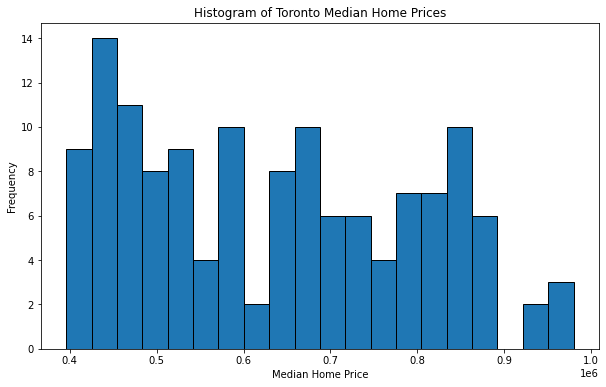

In [20]:
plt.figure(figsize=(10, 6))
plt.hist(market_watch['Median Price'], bins=20, edgecolor='black')
plt.xlabel('Median Home Price')
plt.ylabel('Frequency')
plt.title('Histogram of Toronto Median Home Prices')
plt.show()

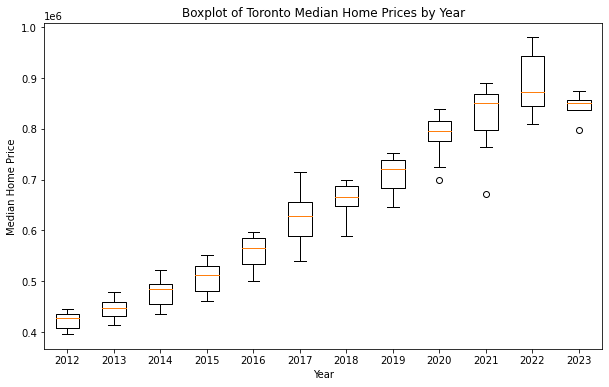

In [21]:
t = market_watch.copy()
t['Year'] = t.index.year
grouped_t = t.groupby('Year')['Median Price'].apply(list).reset_index(name='Yearly_Median_Prices')
plt.figure(figsize=(10, 6))
plt.boxplot(grouped_t['Yearly_Median_Prices'])
plt.xticks(range(1, len(grouped_t['Year']) + 1), grouped_t['Year'])
plt.xlabel('Year')
plt.ylabel('Median Home Price')
plt.title('Boxplot of Toronto Median Home Prices by Year')
plt.show()

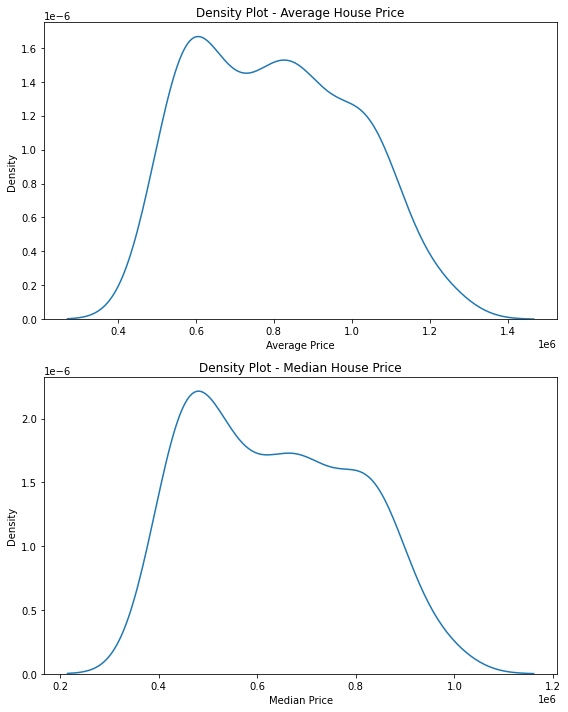

In [22]:
fig, axes = plt.subplots(2, 1, figsize=(8, 10))

axes[0].set_title('Density Plot - Average House Price')
axes[0].set_xlabel('Average Price')
axes[0].set_ylabel('Density')

axes[1].set_title('Density Plot - Median House Price')
axes[1].set_xlabel('Median Price')
axes[1].set_ylabel('Density')

sns.kdeplot(data=market_watch['Average Price'], ax=axes[0])
sns.kdeplot(data=market_watch['Median Price'], ax=axes[1])

plt.tight_layout()

plt.show()

In summary, the higher density at the peak of the median plot indicates that the median house price is a more representative measure of the central tendency within the distribution. The smaller price range for the median suggests that the majority of house prices cluster around this central value. This information highlights the importance of considering the median as a measure when analyzing the typical or representative house price range, particularly in the presence of skewed distributions and potential outliers.

In [23]:
from scipy.stats import skew
average_skewness = skew(market_watch['Average Price'])
print("Skewness - Average Price:", average_skewness)

median_skewness = skew(market_watch['Median Price'])
print("Skewness - Median Price:", median_skewness)

Skewness - Average Price: 0.24534106483607712
Skewness - Median Price: 0.2690023847409099


A positive skewness value indicates a right-skewed distribution, where the tail of the distribution extends to the right and the majority of the data is concentrated on the left.
A negative skewness value indicates a left-skewed distribution, where the tail of the distribution extends to the left and the majority of the data is concentrated on the right.
A skewness value close to 0 suggests a relatively symmetric or normally distributed data

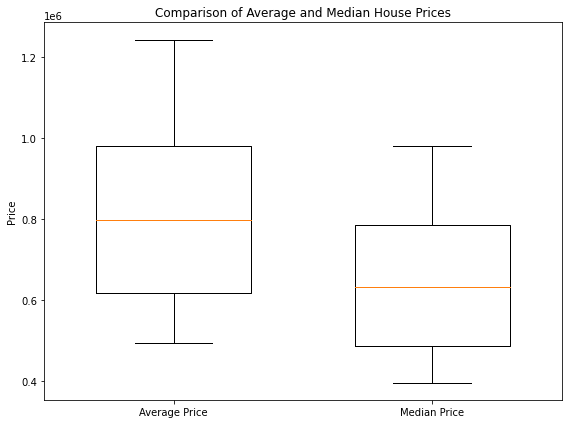

In [24]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.boxplot(market_watch['Average Price'], positions=[1], widths=0.6, labels=['Average Price'])
ax.boxplot(market_watch['Median Price'], positions=[2], widths=0.6, labels=['Median Price'])
ax.set_ylabel('Price')
ax.set_title('Comparison of Average and Median House Prices')
plt.tight_layout()
plt.show()

In summary, the differences between the median and average boxes, as well as the longer top whiskers, indicate the presence of positive skewness and potential outliers in the higher price range. It suggests that the distribution of house prices is not symmetrical and that there are high-priced outliers impacting the average. The median, being less affected by extreme values, provides a more robust measure of the central tendency. Further analysis of the outliers and their impact on the distribution may be necessary to gain a deeper understanding of the data.

In [25]:
import os

dfs = []

regions = ["City of Toronto", "Toronto West", "Toronto W01", "Toronto W02", "Toronto W03", "Toronto W04", "Toronto W05", 
         "Toronto W06", "Toronto W07", "Toronto W08", "Toronto W09", "Toronto W10", "Toronto Central", "Toronto C01", 
         "Toronto C02", "Toronto C03", "Toronto C04", "Toronto C06", "Toronto C07", "Toronto C08", "Toronto C09", 
         "Toronto C10", "Toronto C11", "Toronto C12", "Toronto C13", "Toronto C14", "Toronto C15", "Toronto East", 
         "Toronto E01", "Toronto E02", "Toronto E03", "Toronto E04", "Toronto E05", "Toronto E06", "Toronto E07"
         "Toronto E08", "Toronto E09", "Toronto E10", "Toronto E11"]
isEmpty = False

for region in regions: 
    
    excel_directory = '/Users/user/Desktop/TMU 2022/MRP/Code/Housing Data/'
    combined_df = pd.DataFrame()
    for filename in os.listdir(excel_directory):
        if filename.endswith('.xlsx'):
   
            file_path = os.path.join(excel_directory, filename)
            df = pd.read_excel(file_path)

            selected_row = df[df['Area'] == region]
            selected_data = selected_row.iloc[:, 1:] 
            
            if not selected_data.empty:
                year, month = filename.split('.')[0].split('-')
                time = pd.to_datetime(f'{year}-{month}')

                selected_data.index = pd.Index([time], name='Date')

                combined_df = pd.concat([combined_df, selected_data])

                df_median = combined_df[['Median Price']].copy()
                df_median.rename(columns = {'Median Price':region+" Median Price"}, inplace = True)
            else: 
                isEmpty = True 

    if not isEmpty: 
        dfs.append(df_median)


merged_df = pd.concat(dfs, axis =1)
            

In [26]:
merged_df

,City of Toronto Median Price,Toronto West Median Price,Toronto W01 Median Price,Toronto W02 Median Price,Toronto W03 Median Price,Toronto W04 Median Price,Toronto W05 Median Price,Toronto W06 Median Price,Toronto W07 Median Price,Toronto W08 Median Price,Toronto W09 Median Price,Toronto W10 Median Price,Toronto Central Median Price,Toronto C01 Median Price,Toronto C02 Median Price,Toronto C03 Median Price,Toronto C04 Median Price,Toronto C06 Median Price,Toronto C07 Median Price,Toronto C08 Median Price,Toronto C09 Median Price,Toronto C10 Median Price,Toronto C11 Median Price,Toronto C12 Median Price,Toronto C13 Median Price,Toronto C14 Median Price,Toronto C15 Median Price,Toronto East Median Price,Toronto E01 Median Price,Toronto E02 Median Price,Toronto E03 Median Price,Toronto E04 Median Price,Toronto E05 Median Price,Toronto E06 Median Price
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,"$525,888","$519,500","$502,000","$686,500","$520,000","$530,000","$458,000","$454,500","$770,000","$636,500","$585,000","$418,450","$505,000","$438,400","$891,000","$771,250","$1,435,000","$620,000","$562,800","$413,000","$832,500","$623,000","$409,000","$2,108,000","$593,500","$455,000","$443,250","$560,000","$707,018","$850,000","$707,000","$547,450","$470,900","$583,750"
2020-07-01,"$810,000","$820,000","$1,085,119","$1,175,000","$880,000","$690,000","$749,500","$720,000","$1,334,000","$750,000","$960,000","$570,000","$767,000","$725,000","$1,397,000","$1,155,000","$1,941,500","$877,500","$880,500","$730,000","$2,700,000","$689,000","$857,500","$2,275,000","$761,000","$651,000","$667,250","$856,000","$1,185,000","$1,250,000","$1,122,000","$774,000","$718,000","$916,000"
2021-04-01,"$875,000","$910,000","$1,100,000","$1,214,000","$968,250","$825,000","$900,000","$823,000","$1,632,500","$796,444","$892,500","$715,000","$799,500","$735,277","$1,405,400","$1,300,000","$2,050,018","$1,087,500","$890,750","$692,800","$1,619,950","$798,750","$745,000","$2,520,000","$994,000","$731,500","$660,000","$968,800","$1,280,000","$1,350,500","$1,238,000","$882,000","$791,500","$1,100,000"
2020-09-01,"$840,000","$840,000","$999,000","$1,065,000","$870,000","$776,750","$770,000","$782,000","$1,212,500","$850,000","$950,000","$635,000","$770,000","$700,000","$1,315,000","$1,200,000","$1,955,000","$1,050,000","$760,000","$647,500","$2,398,000","$776,500","$720,000","$2,550,000","$799,000","$660,500","$666,000","$891,000","$1,205,000","$1,150,000","$1,058,000","$854,800","$670,000","$982,250"
2018-03-01,"$660,000","$672,000","$691,500","$912,500","$665,000","$540,000","$645,000","$581,250","$1,092,500","$636,000","$822,944","$525,000","$635,000","$615,000","$980,000","$907,500","$1,715,000","$649,000","$692,500","$630,500","$826,000","$679,000","$417,500","$1,834,500","$552,000","$568,000","$500,000","$700,000","$890,000","$1,015,000","$951,000","$534,000","$547,500","$864,000"
2022-11-01,"$851,000","$896,000","$1,275,000","$937,215","$895,000","$682,500","$865,000","$846,750","$1,342,500","$935,000","$996,000","$852,500","$780,000","$725,000","$1,465,000","$1,165,000","$1,735,000","$1,100,000","$743,000","$695,000","$1,025,000","$765,000","$685,000","$2,830,000","$738,500","$721,500","$865,000","$900,000","$1,087,000","$1,277,500","$1,027,500","$870,000","$754,000","$840,000"
2013-01-01,"$413,500","$390,500","$340,000","$575,000","$415,000","$358,900","$411,000","$371,500","$590,625","$480,000","$360,000","$256,450","$435,000","$380,000","$767,500","$437,500","$937,500","$454,950","$388,000","$380,000","$1,095,000","$479,000","$315,750","$1,525,000","$495,000","$425,000","$454,500","$389,000","$565,000","$648,000","$506,000","$390,000","$332,500","$403,000"
2016-02-01,"$549,900","$538,500","$521,022","$700,000","$550,000","$555,000","$460,000","$461,000","$892,500","$487,500","$648,250","$292,500","$519,950","$441,000","$900,800","$1,078,000","$1,647,500","$454,000","$461,000","$437,000","$1,506,500","$580,250","$363,000","$1,900,000","$771,500","$4

In [27]:
filename = "2019-February.xlsx"
year, month = filename.split('.')[0].split('-')
time = pd.to_datetime(f'{year}-{month}')
time

Timestamp('2019-02-01 00:00:00')

In [28]:
region_median_price = merged_df.copy()
region_median_price.sort_values(by='Date', inplace = True) 
region_median_price[region_median_price.columns[0:]] = region_median_price[region_median_price.columns[0:]].replace('[\$,]', '', regex=True).astype(np.int64)

In [29]:
region_median_price

,City of Toronto Median Price,Toronto West Median Price,Toronto W01 Median Price,Toronto W02 Median Price,Toronto W03 Median Price,Toronto W04 Median Price,Toronto W05 Median Price,Toronto W06 Median Price,Toronto W07 Median Price,Toronto W08 Median Price,Toronto W09 Median Price,Toronto W10 Median Price,Toronto Central Median Price,Toronto C01 Median Price,Toronto C02 Median Price,Toronto C03 Median Price,Toronto C04 Median Price,Toronto C06 Median Price,Toronto C07 Median Price,Toronto C08 Median Price,Toronto C09 Median Price,Toronto C10 Median Price,Toronto C11 Median Price,Toronto C12 Median Price,Toronto C13 Median Price,Toronto C14 Median Price,Toronto C15 Median Price,Toronto East Median Price,Toronto E01 Median Price,Toronto E02 Median Price,Toronto E03 Median Price,Toronto E04 Median Price,Toronto E05 Median Price,Toronto E06 Median Price
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-01-01,396000,360000,490000,439000,335000,239000,335250,362000,535000,410000,404000,281000,439950,385750,824750,617000,883000,585000,440000,385500,1115000,497500,262500,1493000,401000,435000,413000,375500,469250,582000,451940,345000,380000,394750
2012-02-01,424944,388500,536750,535000,355000,350450,349300,410000,645333,515000,417000,270250,451900,391000,765000,678300,1030000,630000,509000,391500,789000,635000,324500,1661000,450000,428000,403000,410000,559233,606000,512000,359500,339000,408000
2012-03-01,428000,416900,543000,595000,400000,351500,354250,424900,645000,498550,472000,356000,457000,392000,702500,719000,950000,601000,474500,380000,1200000,640000,235400,1451000,501000,452750,423849,414000,587000,610000,507000,364000,400500,446250
2012-04-01,445000,436750,580000,600000,393000,347250,379900,416750,710300,575000,533000,360000,483600,397000,880000,605000,1093000,695250,471000,404500,606000,675000,670000,1550000,452500,495750,428000,423000,572000,632400,516740,380000,375000,441000
2012-05-01,446000,438000,580000,631000,385000,397500,370000,439500,640000,540000,460000,365000,470000,398600,969549,656000,1109000,657500,529900,379000,975000,582000,428400,1600000,515000,410000,412000,432050,565000,579950,530000,392500,370000,491500
2012-06-01,434405,418750,609000,600000,383000,372500,379025,449950,635000,475000,467500,273000,475200,400000,770900,635000,1152500,658500,484750,406000,1218000,630000,383400,1489000,459000,410000,450000,420000,570500,539900,516700,394000,410000,437000
2012-07-01,410000,401500,404950,544500,397000,403500,375000,399900,750000,565000,399500,271500,424500,387000,800000,580000,964750,582500,378000,374550,731000,449250,469750,850000,420750,379500,416250,396000,530000,645000,510000,344000,334500,419250
2012-08-01,399050,398000,410000,505939,410400,333250,352000,430000,612225,431000,266000,364000,412000,376000,899000,650000,828300,601000,430000,367000,1263000,435000,230000,1426000,424000,406000,362950,390000,522940,637000,470000,341500,350000,435000
2012-09-01,430000,420000,510000,525000,414000,373000,362500,388450,650000,529900,415000,372500,455500,388500,814500,690000,1050500,499000,417000,387000,1090000,442000,775000,1725000,529000,390000,445000,416000,575000,616000,510000,401500,343000,457500


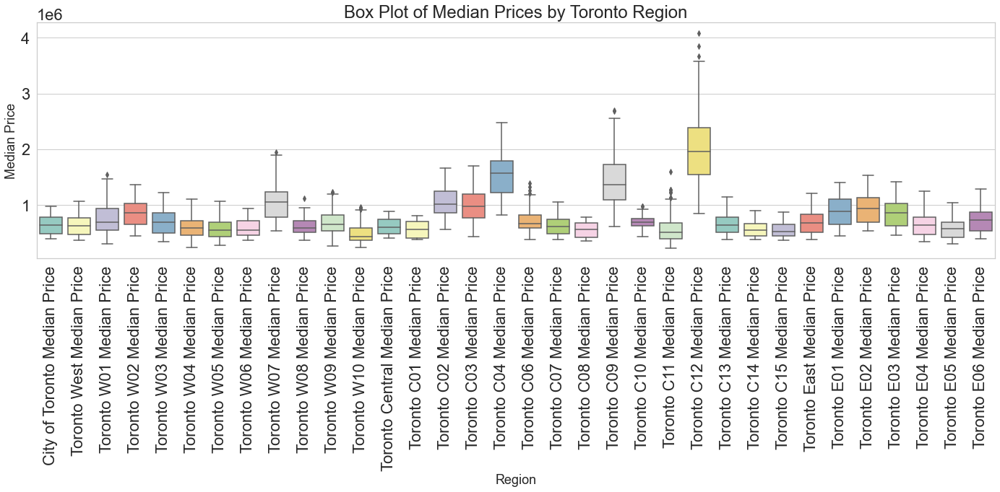

In [860]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=2)
sns.set_style("whitegrid")  

plt.figure(figsize=(20, 10)) 
melted_df = pd.melt(region_median_price.reset_index(), id_vars='Date', var_name='Region', value_name='Median Price')
sns.boxplot(x='Region', y='Median Price', data=melted_df, palette='Set3')
plt.title('Box Plot of Median Prices by Toronto Region', fontsize=24)  
plt.xlabel('Region', fontsize=18)
plt.ylabel('Median Price', fontsize=18) 
plt.xticks(rotation=90)
plt.tight_layout() 
plt.show()


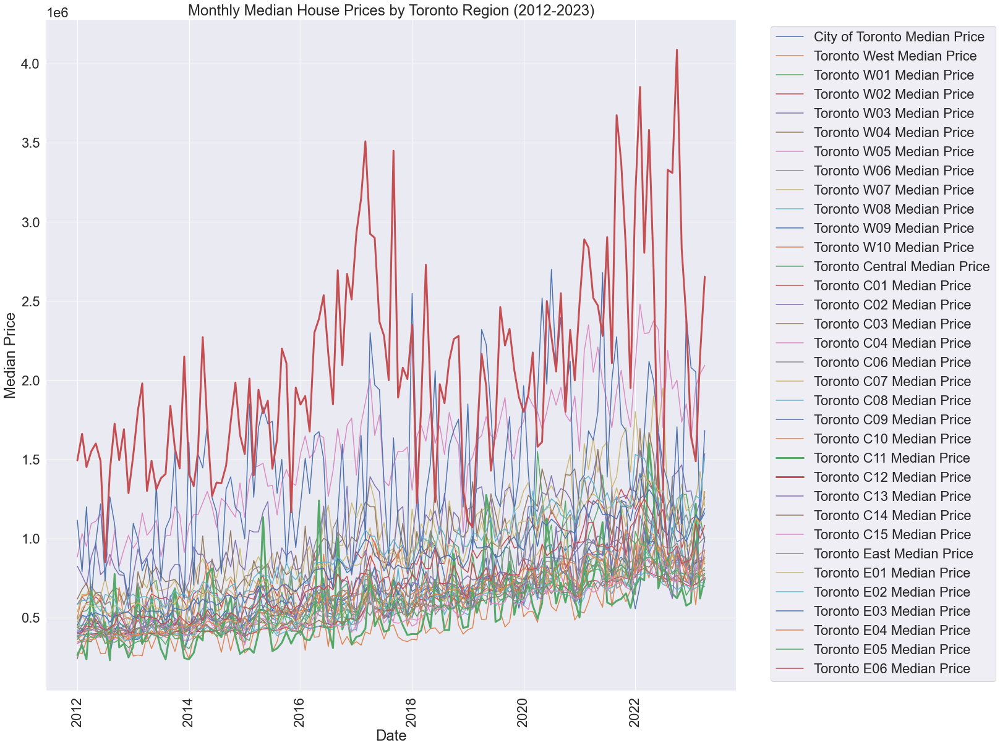

In [31]:
plt.figure(figsize=(20, 20))
max_line = region_median_price.max().idxmax()
min_line = region_median_price.min().idxmin()
for column in region_median_price.columns:
    if column == max_line or column == min_line:
        plt.plot(region_median_price.index, region_median_price[column], label=column, linewidth=3)
    else:
        plt.plot(region_median_price.index, region_median_price[column], label=column)

plt.title('Monthly Median House Prices by Toronto Region (2012-2023)')
plt.xlabel('Date')
plt.ylabel('Median Price')
plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
plt.xticks(rotation=90)
plt.show()

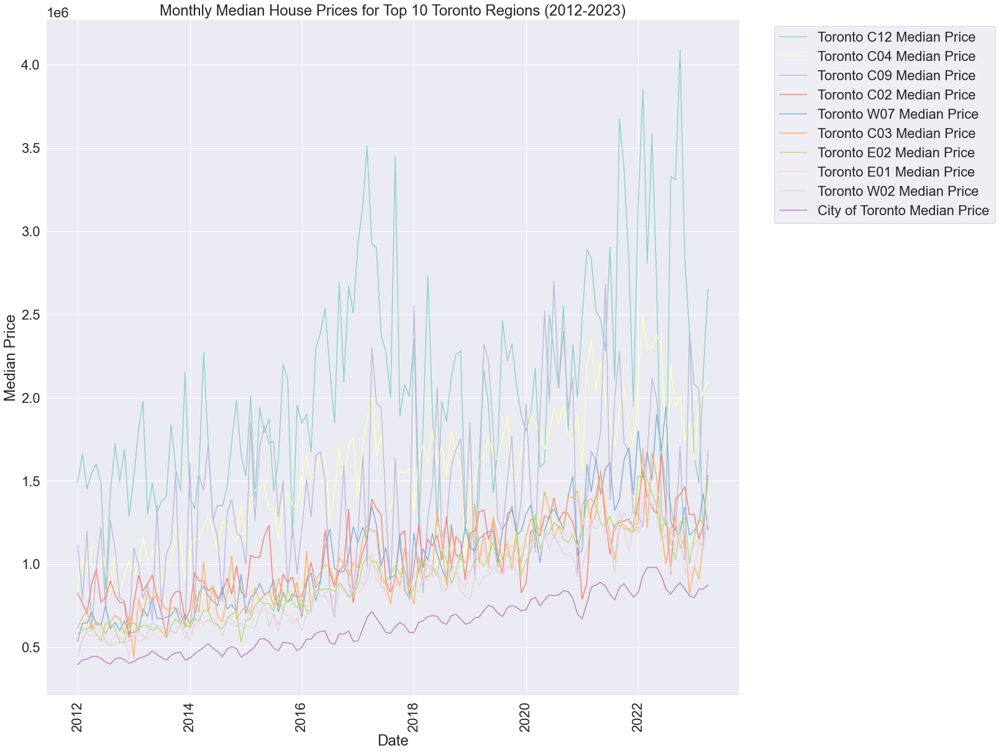

In [32]:

mean_median_prices = region_median_price.mean()
top_9_regions = mean_median_prices.nlargest(9).index
top_10_regions = top_9_regions.append(pd.Index(['City of Toronto Median Price']))
plt.figure(figsize=(20, 20))
color_palette = sns.color_palette('Set3', n_colors=len(top_10_regions))
for column, color in zip(top_10_regions, color_palette):
    plt.plot(region_median_price.index, region_median_price[column], label=column, color=color)
plt.title('Monthly Median House Prices for Top 10 Toronto Regions (2012-2023)')
plt.xlabel('Date')
plt.ylabel('Median Price')
plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
plt.xticks(rotation=90)
plt.show()

In [33]:
toronto_all_stats_raw = market_watch.merge(exo_stats, left_index=True, right_index=True)

In [34]:
toronto_all_stats_raw

,Sales,Dollar Volume,Average Price,Median Price,New Listings,SNLR Trend (%),Active Listings,Mos Inv (Trend),Avg. SP/LP (%),CAN_Mort_Lending_Rate5yr,Mortgage_Var_Rate,Mortgage_Fixed_Rate_1yr,Mortgage_Fixed_Rate_3yr,Mortgage_Fixed_Rate_5yr,ON_Employed_Tot,ON_Starts_Homeowner,ON_Starts_Renter,TO_Units_Absorbed,TO_Units_Unabsorbed,Bond_1-3yr_Avg,Overnight_financing,Bank_Rate,Bond_2yr_Yield,Treasury_Bill_Auction,ON_Unemployment_Rate,GDP,Inflation,New_Housing_Price_Index,CPI_Can
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2012-01-01,"1,705",850871140,499045,396000,4041,59.600,5134.0,2.2,99.00,NaN,NaN,NaN,NaN,NaN,5563511.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1702312.0,NaN,NaN,NaN
2012-02-01,"2,686",1486751884,553519,424944,5165,59.200,6090.0,2.2,101.00,4.23,NaN,NaN,NaN,NaN,5550773.0,2076.0,572.0,947.0,100.0,NaN,NaN,NaN,NaN,NaN,NaN,1697912.0,2.2,89.6,121.2
2012-03-01,"3,682",2019039303,548354,428000,6375,58.900,6896.0,2.2,101.00,4.21,NaN,NaN,NaN,NaN,5585320.0,2228.0,287.0,940.0,99.0,1.21,0.9980,1.25,1.19,0.926,7.7,1702210.0,1.7,89.9,121.7
2012-04-01,"3,925",2231109660,568436,445000,6383,58.900,7321.0,2.2,101.00,4.36,NaN,NaN,NaN,NaN,5639260.0,2892.0,387.0,999.0,105.0,1.29,1.0079,1.25,1.43,1.042,8.0,1708110.0,2.0,90.2,122.2
2012-05-01,"4,130",2349011252,568768,446000,7956,58.000,8376.0,2.2,100.00,4.35,NaN,NaN,NaN,NaN,5735511.0,2794.0,596.0,1200.0,122.0,1.22,1.0000,1.25,1.11,1.006,8.2,1710842.0,1.8,90.4,122.1
2012-06-01,"3,520",1950350664,554077,434405,6742,56.400,8537.0,2.3,99.00,4.25,NaN,NaN,NaN,NaN,5793351.0,2906.0,311.0,1205.0,144.0,1.05,0.9984,1.25,0.99,0.902,8.1,1711716.0,1.8,90.7,121.6
2012-07-01,"2,721",1363040705,500934,410000,5537,55.500,8385.0,2.3,98.00,4.23,NaN,NaN,NaN,NaN,5696020.0,3070.0,343.0,1236.0,129.0,1.00,0.9974,1.25,0.96,0.972,8.0,1715089.0,1.6,90.7,121.5
2012-08-01,"2,282",1135909249,497769,399050,4273,55.000,7492.0,2.4,98.00,4.23,NaN,NaN,NaN,NaN,5662325.0,3188.0,656.0,987.0,129.0,1.17,0.9990,1.25,1.15,1.034,8.1,1712835.0,1.7,90.9,121.8
2012-09-01,"2,255",1235516776,547901,430000,6342,53.500,8740.0,2.5,99.00,4.20,NaN,NaN,NaN,NaN,5747064.0,2833.0,655.0,889.0,140.0,1.16,0.9991,1.25,1.09,1.000,7.9,1712611.0,1.5,91.1,122.0


In [35]:
toronto_all_stats1 = toronto_all_stats_raw[12:]

In [36]:
toronto_all_stats1
toronto_all_stats2 = toronto_all_stats1.copy()

In [37]:
toronto_all_stats2[toronto_all_stats2.columns[0]] = toronto_all_stats1[toronto_all_stats1.columns[0]].replace('[\,]', '', regex=True).astype(float)
toronto_all_stats2

,Sales,Dollar Volume,Average Price,Median Price,New Listings,SNLR Trend (%),Active Listings,Mos Inv (Trend),Avg. SP/LP (%),CAN_Mort_Lending_Rate5yr,Mortgage_Var_Rate,Mortgage_Fixed_Rate_1yr,Mortgage_Fixed_Rate_3yr,Mortgage_Fixed_Rate_5yr,ON_Employed_Tot,ON_Starts_Homeowner,ON_Starts_Renter,TO_Units_Absorbed,TO_Units_Unabsorbed,Bond_1-3yr_Avg,Overnight_financing,Bank_Rate,Bond_2yr_Yield,Treasury_Bill_Auction,ON_Unemployment_Rate,GDP,Inflation,New_Housing_Price_Index,CPI_Can
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1559.0,791751646,507859,413500,4207,50.600,5736.0,2.7,98.00,4.14,3.57,5.14,2.81,3.00,5627779.0,1663.0,84.0,942.0,153.0,1.16,1.0048,1.25,1.16,0.934,7.7,1729586.0,1.3,91.8,121.3
2013-02-01,2189.0,1208359467,552014,434000,4326,50.500,6335.0,2.8,99.00,4.11,3.52,4.98,2.80,2.98,5623375.0,1432.0,187.0,900.0,168.0,1.12,1.0072,1.25,1.00,0.960,7.5,1734805.0,1.5,91.9,122.7
2013-03-01,2891.0,1632817557,564793,441000,5513,49.900,7119.0,2.9,99.00,4.02,3.51,4.89,2.75,2.99,5655854.0,1645.0,77.0,982.0,179.0,1.01,1.0065,1.25,1.00,0.978,7.6,1740839.0,1.5,92.0,122.9
2013-04-01,3591.0,2069546693,576315,453500,7004,49.000,8086.0,2.9,100.00,4.02,3.52,4.89,2.81,2.99,5687326.0,2318.0,90.0,966.0,203.0,1.00,1.0036,1.25,0.94,0.993,7.6,1743937.0,1.2,92.2,122.7
2013-05-01,3840.0,2307037386,600791,478500,7264,49.100,8716.0,2.9,100.00,4.02,3.50,4.78,2.81,2.96,5763172.0,3153.0,640.0,930.0,185.0,1.04,1.0063,1.25,1.07,0.999,7.5,1748724.0,1.2,92.4,123.0
2013-06-01,3265.0,1889047138,578575,455000,5913,49.400,8572.0,3.0,99.00,4.00,3.49,4.75,2.80,2.93,5823905.0,2845.0,314.0,996.0,205.0,1.18,1.0067,1.25,1.23,1.024,7.6,1742396.0,1.2,92.5,123.0
2013-07-01,3062.0,1641786517,536181,439000,5350,50.100,7849.0,2.9,98.00,4.08,3.31,4.95,2.80,3.00,5752220.0,2928.0,495.0,1085.0,171.0,1.17,0.9998,1.25,1.15,1.013,7.7,1752447.0,1.3,92.7,123.1
2013-08-01,2665.0,1380856812,518145,423000,4475,50.600,7097.0,2.9,98.00,4.14,3.13,4.89,2.88,3.11,5726666.0,2910.0,600.0,1221.0,176.0,1.23,0.9978,1.25,1.20,0.995,7.7,1760130.0,1.2,92.8,123.1
2013-09-01,2789.0,1593663756,571410,451510,5994,51.700,7897.0,2.8,99.00,4.33,3.03,4.92,2.90,3.20,5813003.0,2146.0,572.0,915.0,161.0,1.27,0.9948,1.25,1.21,0.986,7.5,1766098.0,1.3,92.8,123.3


In [38]:
toronto_all_stats = toronto_all_stats2.copy()
#toronto_all_stats.index = pd.DatetimeIndex(toronto_all_stats.index).to_period('M')
#toronto_all_stats

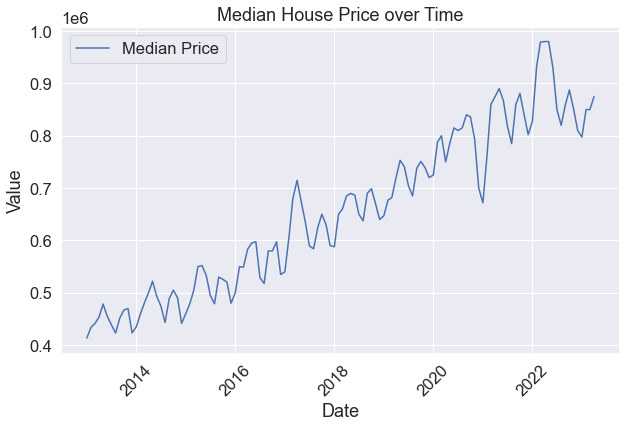

In [863]:
plt.figure(figsize=(10, 6))
sns.set(font_scale=1.5)
sns.lineplot(data=toronto_all_stats, x=toronto_all_stats.index, y='Median Price', label='Median Price')
plt.xlabel('Month')
plt.ylabel('Median Price ($)')
plt.title('Median House Price over Time')
plt.xticks(rotation=45)
plt.legend()
plt.show()

import matplotlib.dates as mdates
plt.figure(figsize=(10, 6))
plt.plot(t_stats["Median Price"], color='#379BDB') #label='Original')
plt.title('Toronto Median House Price')
plt.xlabel('Month')
plt.ylabel('Median Price ($)')
#plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
#plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.grid(True)
plt.show()

Some observations:
It is non-stationary
There seems to be a seasonal component
There is a trend and an increasing variance
It looks like there are some outliers (maybe)

In [40]:
num_rows = toronto_all_stats.shape[0]

print("Total number of rows:", num_rows)

Total number of rows: 124


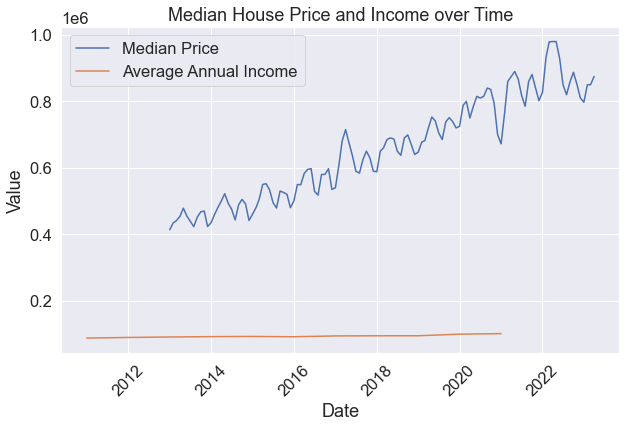

In [41]:
plt.figure(figsize=(10, 6))
sns.set(font_scale=1.5)
sns.lineplot(data=toronto_all_stats, x=toronto_all_stats.index, y='Median Price', label='Median Price')
sns.lineplot(data=income_stats, x=income_stats.index, y='Average_Income_Yearly', label='Average Annual Income')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Median House Price and Income over Time')
plt.xticks(rotation=45)
plt.legend()
plt.show()

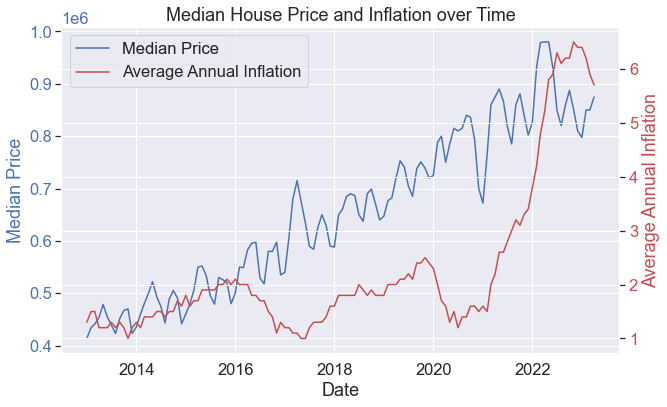

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax1 = plt.subplots(figsize=(10, 6))

sns.set(font_scale=1.5)

sns.lineplot(data=toronto_all_stats, x=toronto_all_stats.index, y='Median Price', label='Median Price', ax=ax1, color='b')
ax1.set_ylabel('Median Price', color='b')
ax1.tick_params(axis='y', labelcolor='b')

ax2 = ax1.twinx()

sns.lineplot(data=toronto_all_stats, x=toronto_all_stats.index, y='Inflation', label='Average Annual Inflation', ax=ax2, color='r')
ax2.set_ylabel('Average Annual Inflation', color='r')
ax2.tick_params(axis='y', labelcolor='r')

plt.xlabel('Date')
plt.title('Median House Price and Inflation over Time')

plt.xticks(rotation=45)

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')

plt.show()


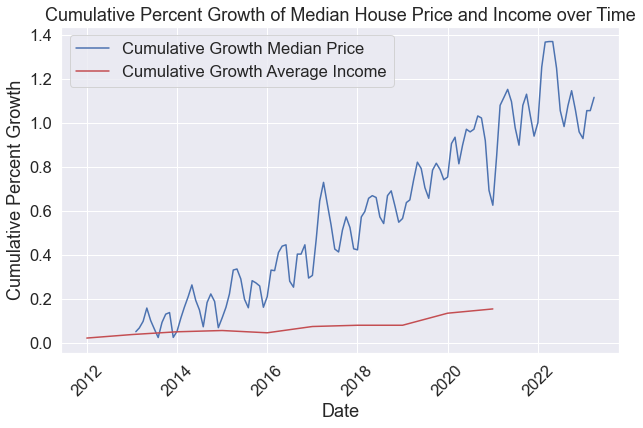

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


toronto_all_stats['Cumulative Percent Growth Median Price'] = (1 + toronto_all_stats['Median Price'].pct_change()).cumprod() - 1
income_stats['Cumulative Percent Growth Average Income'] = (1 + income_stats['Average_Income_Yearly'].pct_change()).cumprod() - 1

fig, ax = plt.subplots(figsize=(10, 6))

sns.set(font_scale=1.5)

sns.lineplot(data=toronto_all_stats, x=toronto_all_stats.index, y='Cumulative Percent Growth Median Price', label='Cumulative Growth Median Price', ax=ax, color='b')
sns.lineplot(data=income_stats, x=income_stats.index, y='Cumulative Percent Growth Average Income', label='Cumulative Growth Average Income', ax=ax, color='r')

plt.ylabel('Cumulative Percent Growth')
plt.title('Cumulative Percent Growth of Median House Price and Income over Time')

plt.xticks(rotation=45)

plt.legend(loc='upper left')

plt.show()


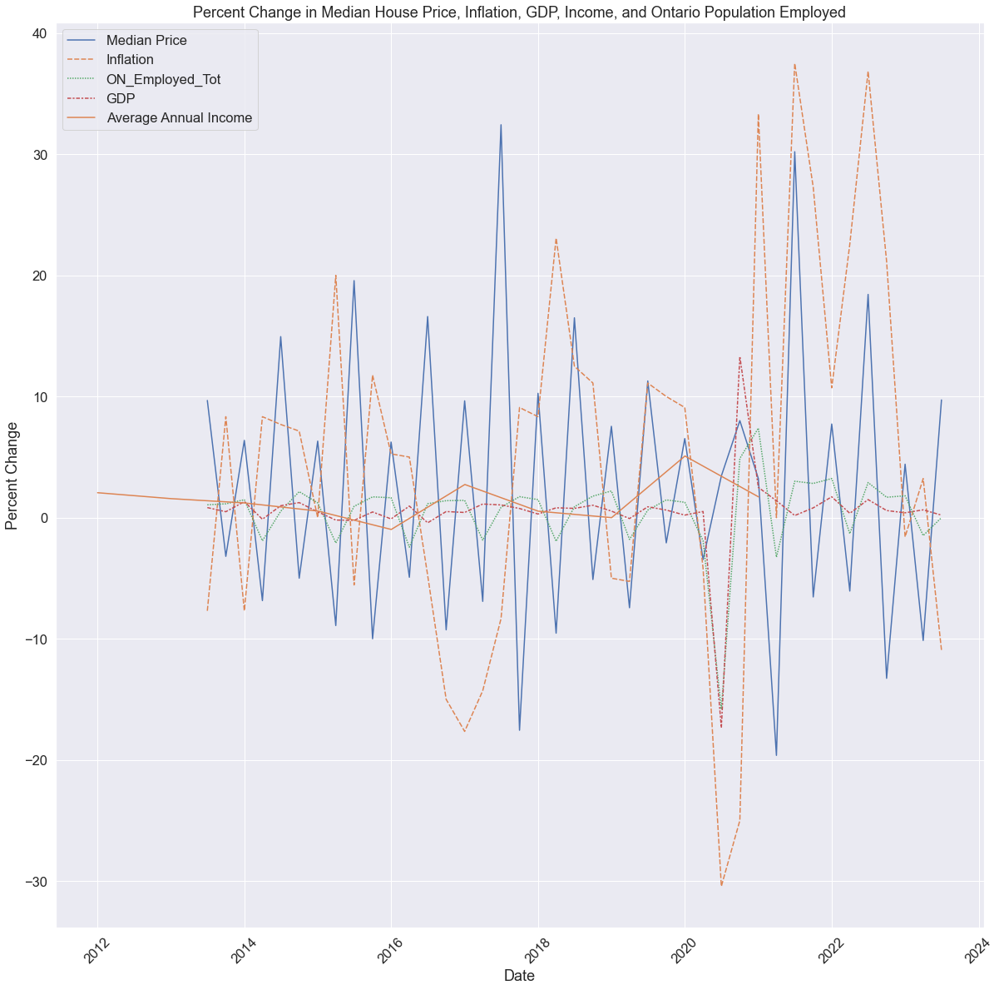

In [44]:
df_quarters = toronto_all_stats.resample('Q').first()

df_percent_change = df_quarters.pct_change() * 100
df_percent_change2 = income_stats.pct_change() * 100

plt.figure(figsize=(20, 20))
sns.lineplot(data=df_percent_change[['Median Price', 'Inflation', 'ON_Employed_Tot', 'GDP']])
sns.lineplot(data=df_percent_change2, x=df_percent_change2.index, y='Average_Income_Yearly', label='Average Annual Income')
plt.xlabel('Date')
plt.ylabel('Percent Change')
plt.title('Percent Change in Median House Price, Inflation, GDP, Income, and Ontario Population Employed')
plt.xticks(rotation=45)
plt.legend()
plt.show()

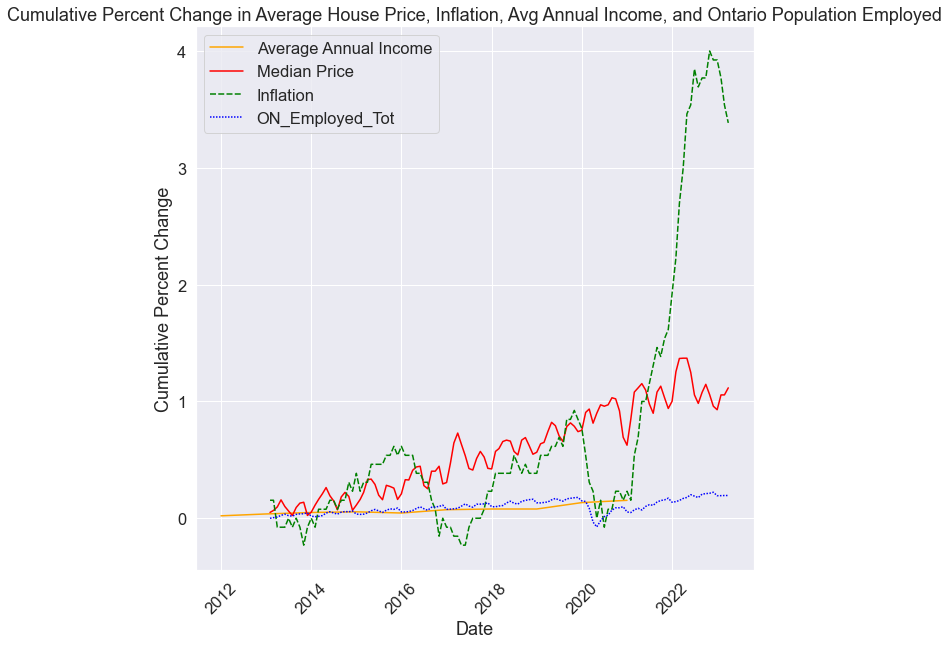

In [882]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
colors = ['red', 'green', 'blue']

sns.lineplot(data=df_cumulative_change2, x=df_cumulative_change2.index, y='Average_Income_Yearly', label='Average Annual Income', color='orange')
sns.lineplot(data=df_cumulative_change[['Median Price', 'Inflation', 'ON_Employed_Tot']], palette=colors)

plt.xlabel('Date')
plt.ylabel('Cumulative Percent Change')
plt.title('Cumulative Percent Change in Average House Price, Inflation, Avg Annual Income, and Ontario Population Employed')
plt.xticks(rotation=45)
plt.legend()
plt.show()


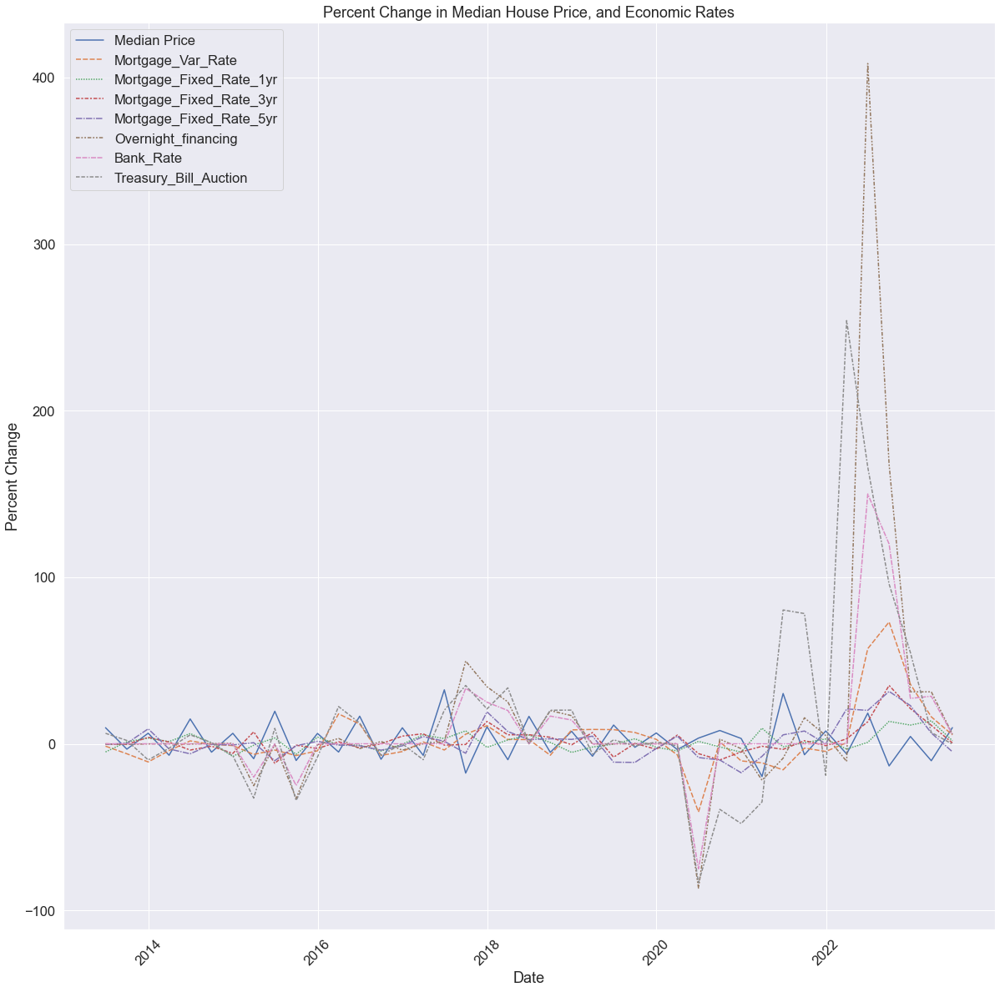

In [46]:
df_quarters = toronto_all_stats.resample('Q').first()
df_percent_change = df_quarters.pct_change() * 100
plt.figure(figsize=(20, 20))
sns.lineplot(data=df_percent_change[['Median Price', 'Mortgage_Var_Rate', 'Mortgage_Fixed_Rate_1yr', 'Mortgage_Fixed_Rate_3yr', 'Mortgage_Fixed_Rate_5yr', 'Overnight_financing', 'Bank_Rate', 'Treasury_Bill_Auction']])
plt.xlabel('Date')
plt.ylabel('Percent Change')
plt.title('Percent Change in Median House Price, and Economic Rates')
plt.xticks(rotation=45)
plt.legend()
plt.show()

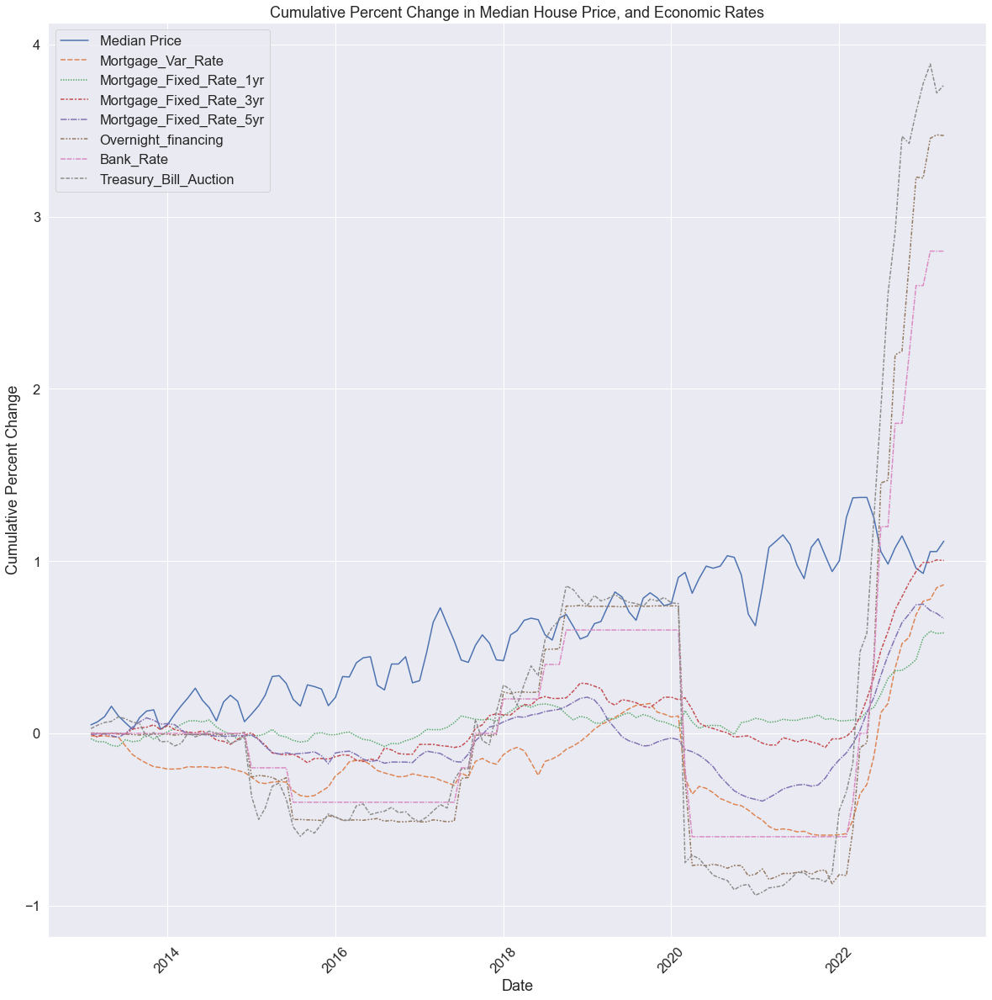

In [47]:
df_cumulative_change = (1 + toronto_all_stats.pct_change()).cumprod() - 1
plt.figure(figsize=(20, 20))
sns.lineplot(data=df_cumulative_change[['Median Price', 'Mortgage_Var_Rate', 'Mortgage_Fixed_Rate_1yr', 'Mortgage_Fixed_Rate_3yr', 'Mortgage_Fixed_Rate_5yr', 'Overnight_financing', 'Bank_Rate', 'Treasury_Bill_Auction']])
plt.xlabel('Date')
plt.ylabel('Cumulative Percent Change')
plt.title('Cumulative Percent Change in Median House Price, and Economic Rates')
plt.xticks(rotation=45)
plt.legend()
plt.show()

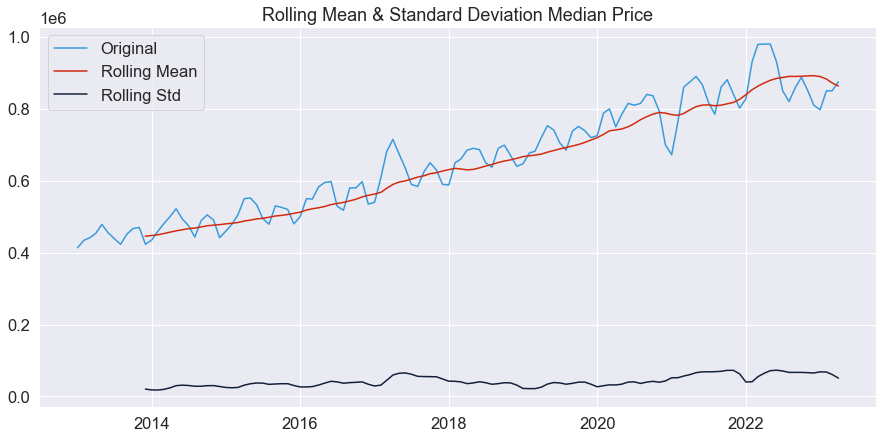

In [48]:
#Determine rolling statistics
toronto_all_stats["Rolling Mean Median Price"] = toronto_all_stats["Median Price"].rolling(window=12).mean() #window size 12 denotes 12 months, giving rolling mean at yearly level
toronto_all_stats["Rolling Std Median Price"] = toronto_all_stats["Median Price"].rolling(window=12).std()

#Plot rolling statistics
plt.figure(figsize=(15,7))
plt.plot(toronto_all_stats["Median Price"], color='#379BDB', label='Original')
plt.plot(toronto_all_stats["Rolling Mean Median Price"], color='#D22A0D', label='Rolling Mean')
plt.plot(toronto_all_stats["Rolling Std Median Price"], color='#142039', label='Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation Median Price')
plt.show(block=False)

1) identifying a tentative model, 2) model estimation 3) verifying if the model is adequate/diagnostic

1) ADF and KPSS to determine stationary 

2) ACF and PACF and AIC and BIC on differenced time series to determine P D Q 

3) Suitable models chosen based on MAPE and NRMSE 


In [49]:
#is it stationary? No -> apply transformations 

In [50]:
#Augmented Dickey–Fuller test:
from statsmodels.tsa.stattools import adfuller

def adf_test(timeseries):
    print("Results of Dickey-Fuller Test:")
    dftest = adfuller(timeseries, autolag="AIC")
    dfoutput = pd.Series(
        dftest[0:4],
        index=[
            "Test Statistic",
            "p-value",
            "#Lags Used",
            "Number of Observations Used",
        ],
    )
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value
    print(dfoutput)
adf_test(toronto_all_stats['Median Price'])

Results of Dickey-Fuller Test:
Test Statistic                  -0.687466
p-value                          0.849970
#Lags Used                      13.000000
Number of Observations Used    110.000000
Critical Value (1%)             -3.491245
Critical Value (5%)             -2.888195
Critical Value (10%)            -2.580988
dtype: float64


We can see in the ADF test above that the p-value is 0.849970, meaning that it is very likely that the data is not stationary.

For the data to be stationary (ie. reject the null hypothesis), the ADF test should have:

p-value <= significance level (0.01, 0.05, 0.10, etc.)

If the p-value is greater than the critical level then we can say that it is likely that the data is not stationary.


In [51]:
#Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test:
from statsmodels.tsa.stattools import kpss

def kpss_test(timeseries):
    print("Results of KPSS Test:")
    kpsstest = kpss(timeseries, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    print(kpss_output)

kpss_test(toronto_all_stats['Median Price'])

Results of KPSS Test:
Test Statistic           1.829624
p-value                  0.010000
Lags Used                6.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64


/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


For the KPSS test, we need to check if the p-value is greater than the significance level. In this case, it is lower than 0.05, therefore it is not stationary according to this test

<AxesSubplot:xlabel='Date'>

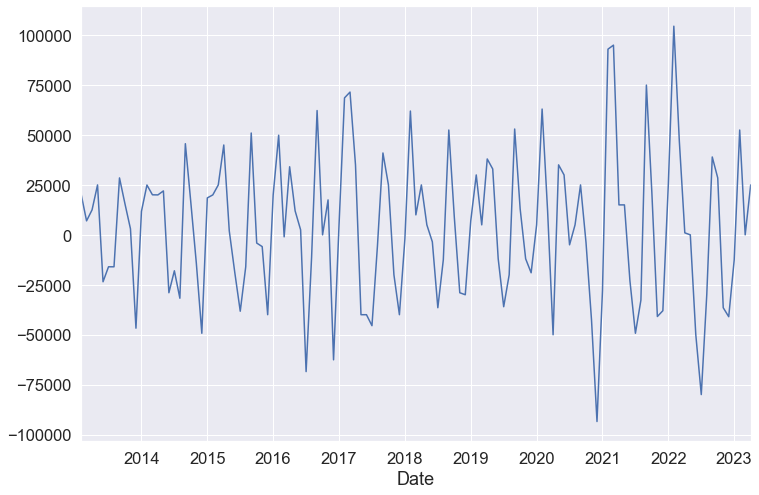

In [52]:
#First Differences
toronto_all_stats["Median Price Diff"] = toronto_all_stats["Median Price"] - toronto_all_stats["Median Price"].shift(1)
toronto_all_stats["Median Price Diff"].dropna().plot(figsize=(12, 8))

In [53]:
adf_test(toronto_all_stats["Median Price Diff"].dropna())

Results of Dickey-Fuller Test:
Test Statistic                  -3.577690
p-value                          0.006202
#Lags Used                      12.000000
Number of Observations Used    110.000000
Critical Value (1%)             -3.491245
Critical Value (5%)             -2.888195
Critical Value (10%)            -2.580988
dtype: float64


Based upon the p-value of ADF test, there is evidence for rejecting the null hypothesis in favor of the alternative. Hence, the series is strict stationary now

In [883]:
kpss_test(toronto_all_stats["Median Price Diff"].dropna())

Results of KPSS Test:
Test Statistic           0.03353
p-value                  0.10000
Lags Used                6.00000
Critical Value (10%)     0.34700
Critical Value (5%)      0.46300
Critical Value (2.5%)    0.57400
Critical Value (1%)      0.73900
dtype: float64


/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


Based upon the p-value of KPSS test, the null hypothesis can not be rejected. Hence, the series is stationary.

With a large negative ADF statistic and a p-value smaller than 0.05, we can reject the null hypothesis and conclude that the series is now stationary. Therefore, we know that d = 1. Since we did not need to take a seasonal difference to make the series stationary, D = 0. #m = 12 

PLOT ACF and PACF

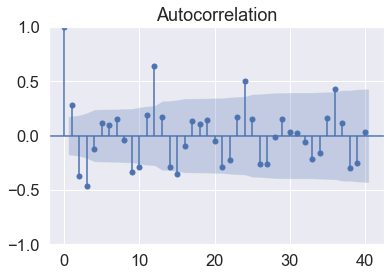

In [55]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(toronto_all_stats["Median Price Diff"].dropna(), lags=40); 

significant coefiecients up until lag 1 

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


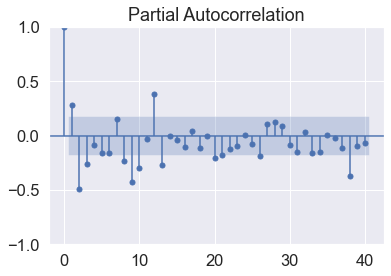

In [56]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(toronto_all_stats["Median Price Diff"].dropna(), lags=40); 

# END OF EDA 

Choose hyperparams through grid search or AIC: 

In [59]:
from typing import Union
from tqdm import tqdm_notebook
from statsmodels.tsa.statespace.sarimax import SARIMAX
 
def optimize_SARIMA(endog: Union[pd.Series, list], order_list: list, d: 
 int, D: int, s: int) -> pd.DataFrame:
    
    results = []
    
    for order in tqdm_notebook(order_list):
        try: 
            model = SARIMAX(
                endog, 
                order=(order[0], d, order[1]),
                seasonal_order=(order[2], D, order[3], s),
                simple_differencing=False).fit(disp=False)
        except:
            continue
            
        aic = model.aic
        results.append([order, aic])
    result_df = pd.DataFrame(results)
    result_df.columns = ['(p,q,P,Q)', 'AIC']
    
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    
    return result_df

In [60]:
from itertools import product
 
ps = range(0, 13, 1)
qs = range(0, 13, 1)    
Ps = [0]
Qs = [0]    

d = 1
D = 0
s = 12
 
ARIMA_order_list = list(product(ps, qs, Ps, Qs))

In [61]:
#toronto_all_stats = toronto_all_stats2.copy()
toronto_all_stats

,Sales,Dollar Volume,Average Price,Median Price,New Listings,SNLR Trend (%),Active Listings,Mos Inv (Trend),Avg. SP/LP (%),CAN_Mort_Lending_Rate5yr,Mortgage_Var_Rate,Mortgage_Fixed_Rate_1yr,Mortgage_Fixed_Rate_3yr,Mortgage_Fixed_Rate_5yr,ON_Employed_Tot,ON_Starts_Homeowner,ON_Starts_Renter,TO_Units_Absorbed,TO_Units_Unabsorbed,Bond_1-3yr_Avg,Overnight_financing,Bank_Rate,Bond_2yr_Yield,Treasury_Bill_Auction,ON_Unemployment_Rate,GDP,Inflation,New_Housing_Price_Index,CPI_Can,Cumulative Percent Growth Median Price,Rolling Mean Median Price,Rolling Std Median Price,Median Price Diff
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01,1559.0,791751646,507859,413500,4207,50.600,5736.0,2.7,98.00,4.14,3.57,5.14,2.81,3.00,5627779.0,1663.0,84.0,942.0,153.0,1.16,1.0048,1.25,1.16,0.934,7.7,1729586.0,1.3,91.8,121.3,NaN,NaN,NaN,NaN
2013-02-01,2189.0,1208359467,552014,434000,4326,50.500,6335.0,2.8,99.00,4.11,3.52,4.98,2.80,2.98,5623375.0,1432.0,187.0,900.0,168.0,1.12,1.0072,1.25,1.00,0.960,7.5,1734805.0,1.5,91.9,122.7,0.049577,NaN,NaN,20500.0
2013-03-01,2891.0,1632817557,564793,441000,5513,49.900,7119.0,2.9,99.00,4.02,3.51,4.89,2.75,2.99,5655854.0,1645.0,77.0,982.0,179.0,1.01,1.0065,1.25,1.00,0.978,7.6,1740839.0,1.5,92.0,122.9,0.066505,NaN,NaN,7000.0
2013-04-01,3591.0,2069546693,576315,453500,7004,49.000,8086.0,2.9,100.00,4.02,3.52,4.89,2.81,2.99,5687326.0,2318.0,90.0,966.0,203.0,1.00,1.0036,1.25,0.94,0.993,7.6,1743937.0,1.2,92.2,122.7,0.096735,NaN,NaN,12500.0
2013-05-01,3840.0,2307037386,600791,478500,7264,49.100,8716.0,2.9,100.00,4.02,3.50,4.78,2.81,2.96,5763172.0,3153.0,640.0,930.0,185.0,1.04,1.0063,1.25,1.07,0.999,7.5,1748724.0,1.2,92.4,123.0,0.157195,NaN,NaN,25000.0
2013-06-01,3265.0,1889047138,578575,455000,5913,49.400,8572.0,3.0,99.00,4.00,3.49,4.75,2.80,2.93,5823905.0,2845.0,314.0,996.0,205.0,1.18,1.0067,1.25,1.23,1.024,7.6,1742396.0,1.2,92.5,123.0,0.100363,NaN,NaN,-23500.0
2013-07-01,3062.0,1641786517,536181,439000,5350,50.100,7849.0,2.9,98.00,4.08,3.31,4.95,2.80,3.00,5752220.0,2928.0,495.0,1085.0,171.0,1.17,0.9998,1.25,1.15,1.013,7.7,1752447.0,1.3,92.7,123.1,0.061669,NaN,NaN,-16000.0
2013-08-01,2665.0,1380856812,518145,423000,4475,50.600,7097.0,2.9,98.00,4.14,3.13,4.89,2.88,3.11,5726666.0,2910.0,600.0,1221.0,176.0,1.23,0.9978,1.25,1.20,0.995,7.7,1760130.0,1.2,92.8,123.1,0.022975,NaN,NaN,-16000.0
2013-09-01,2789.0,1593663756,571410,451510,5994,51.700,7897.0,2.8,99.00,4.33,3.03,4.92,2.90,3.20,5813003.0,2146.0,572.0,915.0,161.0,1.27,0.9948,1.25,1.21,0.986,7.5,1766098.0,1.3,92.8,123.3,0.091923,NaN,NaN,28510.0


In [62]:
t_stats = toronto_all_stats.iloc[:,3]
t_stats = t_stats.reset_index()
t_stats.columns = ['Month', 'Median Price']
t_stats['Month'] = pd.to_datetime(t_stats['Month'])
t_stats['Month'] = t_stats['Month'].dt.to_period('M')
t_stats.loc[124] = ['2023-05', 928800]
#t_stats.loc[125] = ['2023-06', 925000]
#t_stats.loc[126] = ['2023-07', 866550]
t_stats

,Month,Median Price
0,2013-01,413500
1,2013-02,434000
2,2013-03,441000
3,2013-04,453500
4,2013-05,478500
5,2013-06,455000
6,2013-07,439000
7,2013-08,423000
8,2013-09,451510
9,2013-10,467000


In [63]:
target_trainM = t_stats['Median Price'][:-1]
target_trainY = t_stats['Median Price'][:-17]
target_trainQ = t_stats['Median Price'][:-3]
target_train6M = t_stats['Median Price'][:-11]

# START

# 2022

In [332]:
#predicting 2022 year (removing 5 months and 1 year)
 
target_trainY

0      413500
1      434000
2      441000
3      453500
4      478500
5      455000
6      439000
7      423000
8      451510
9      467000
10     470000
11     423250
12     435000
13     459950
14     480000
15     500000
16     522000
17     493000
18     475000
19     443250
20     488900
21     505000
22     490800
23     441500
24     460000
25     480000
26     505000
27     550000
28     552000
29     533250
30     495000
31     479000
32     530000
33     525888
34     520000
35     480000
36     500000
37     549900
38     548900
39     583000
40     595000
41     597500
42     529000
43     517750
44     580000
45     580000
46     597500
47     534900
48     539900
49     608500
50     680000
51     715000
52     675000
53     635000
54     589500
55     584000
56     625000
57     650000
58     630000
59     590000
60     588000
61     650000
62     660000
63     685000
64     690000
65     686500
66     650000
67     637500
68     690000
69     699000
70     670000
71    

In [560]:
ARIMA_result_df = optimize_SARIMA(target_trainY, ARIMA_order_list, d, D, s)
ARIMA_result_df

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_39063/2473469477.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/169 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaco

,"(p,q,P,Q)",AIC
0,"(7, 8, 0, 0)",2525.126144
1,"(5, 2, 0, 0)",2526.139053
2,"(8, 7, 0, 0)",2527.188142
3,"(6, 2, 0, 0)",2527.522432
4,"(7, 9, 0, 0)",2528.170116
5,"(9, 10, 0, 0)",2528.414656
6,"(7, 10, 0, 0)",2528.675210
7,"(8, 10, 0, 0)",2528.960546
8,"(2, 6, 0, 0)",2529.037671
9,"(8, 2, 0, 0)",2529.120249


In [333]:
ARIMA_model1 = SARIMAX(target_trainY, order=(7,1,8), simple_differencing=False)
ARIMA_model1_fit = ARIMA_model1.fit(disp=False)

print(ARIMA_model1_fit.summary())

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


                               SARIMAX Results                                
Dep. Variable:           Median Price   No. Observations:                  108
Model:               SARIMAX(7, 1, 8)   Log Likelihood               -1246.547
Date:                Tue, 15 Aug 2023   AIC                           2525.095
Time:                        02:27:42   BIC                           2567.860
Sample:                             0   HQIC                          2542.431
                                - 108                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3495      0.143      2.441      0.015       0.069       0.630
ar.L2         -0.5982      0.091     -6.583      0.000      -0.776      -0.420
ar.L3         -0.0704      0.174     -0.404      0.6

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


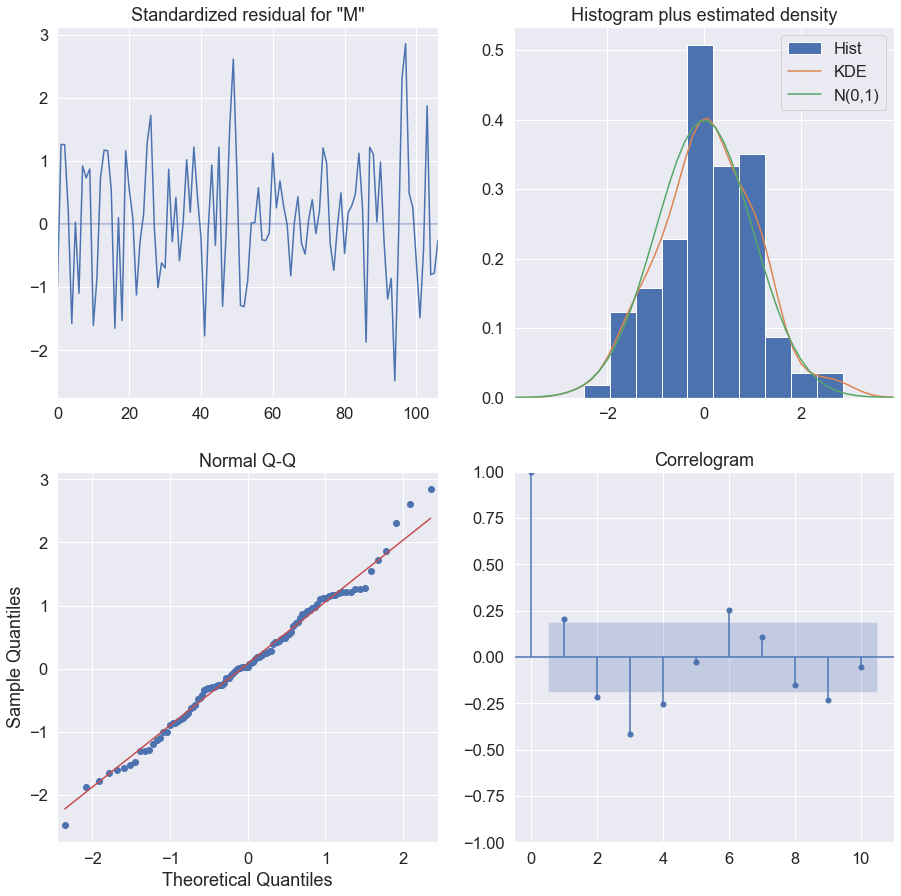

In [334]:
ARIMA_model1_fit.plot_diagnostics(figsize=(15,15));

In [335]:
import statsmodels.api as sm
from statsmodels.stats.diagnostic import acorr_ljungbox
 
residuals = ARIMA_model1_fit.resid

sm.stats.acorr_ljungbox(residuals, np.arange(1, 11, 1), return_df=True)

,lb_stat,lb_pvalue
1,0.026267,0.871249
2,0.053329,0.973688
3,0.808596,0.847410
4,1.465129,0.832800
5,2.331454,0.801636
6,3.092797,0.797113
7,3.156411,0.870166
8,3.178220,0.922680
9,3.455899,0.943454
10,3.499978,0.967099


The returned p-values are all greater than 0.05 except for the first two values. This means that, according to the Ljung-Box test, we reject the null hypothesis with a 5% chance of being wrong, since we set our significance boundary to 0.05. However, the third value and onwards are all greater than 0.05, so we reject the null hypothesis, concluding that the residuals are uncorrelated starting at lag 3.

This is an interesting situation to dissect, because the graphical analysis of the residuals leads us to conclude that they resemble white noise, but the Ljung-Box test points to some correlation at lags 1 and 2. This means that our ARIMA model is not capturing all the information from the data.

In this case, we’ll move forward with the model, because we know that we are modeling seasonal data with a non-seasonal model. Therefore, the Ljung-Box test is really telling us that our model is not perfect, but that’s okay, because part of this exercise is to compare the performance of ARIMA and SARIMA and demonstrate that SARIMA is the way to go when dealing with seasonal data




We’ll apply the test on the first 10 lags and study the p-values. If all p-values are greater than 0.05, we cannot reject the null hypothesis and we’ll conclude that the residuals are not correlated, just like white noise.

Running the Ljung-Box test on the first 10 lags of the model’s residuals returns a list of p-values that are all larger than 0.05. Therefore, we do not reject the null hypothesis, and we conclude that the residuals are not correlated, just like white noise.

In [88]:
num_rows = len(t_stats)
num_rows

125

In [89]:
t_stats

,Month,Median Price
0,2013-01,413500
1,2013-02,434000
2,2013-03,441000
3,2013-04,453500
4,2013-05,478500
5,2013-06,455000
6,2013-07,439000
7,2013-08,423000
8,2013-09,451510
9,2013-10,467000


In [90]:
t_stats.dtypes

Month           object
Median Price     int64
dtype: object

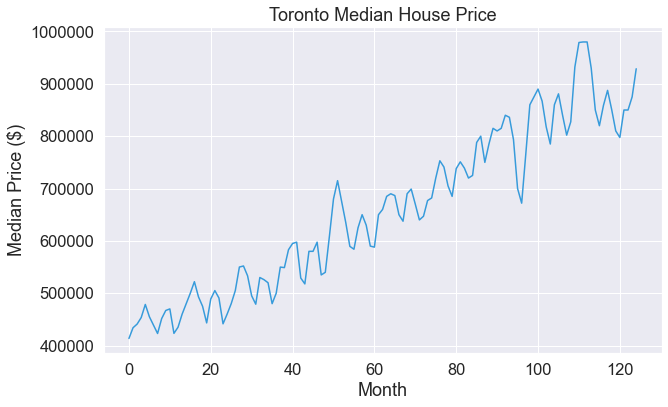

In [866]:
import matplotlib.dates as mdates
plt.figure(figsize=(10, 6))
plt.plot(t_stats["Median Price"], color='#379BDB') #label='Original')
plt.title('Toronto Median House Price')
plt.xlabel('Month')
plt.ylabel('Median Price ($)')
#plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
#plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.grid(True)
plt.show()

In [336]:
test1 = t_stats.iloc[108:120]
test1

,Month,Median Price
108,2022-01,827500
109,2022-02,932000
110,2022-03,979000
111,2022-04,980000
112,2022-05,980000
113,2022-06,930000
114,2022-07,850000
115,2022-08,820000
116,2022-09,859000
117,2022-10,887500


In [337]:
check = t_stats.iloc[96:108]
check

,Month,Median Price
96,2021-01,672000
97,2021-02,765000
98,2021-03,860000
99,2021-04,875000
100,2021-05,890000
101,2021-06,867000
102,2021-07,817700
103,2021-08,785000
104,2021-09,860000
105,2021-10,880900


In [338]:
test1['naive_seasonal'] = t_stats['Median Price'].iloc[96:108].values
test1

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/1534541494.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test1['naive_seasonal'] = t_stats['Median Price'].iloc[96:108].values


,Month,Median Price,naive_seasonal
108,2022-01,827500,672000
109,2022-02,932000,765000
110,2022-03,979000,860000
111,2022-04,980000,875000
112,2022-05,980000,890000
113,2022-06,930000,867000
114,2022-07,850000,817700
115,2022-08,820000,785000
116,2022-09,859000,860000
117,2022-10,887500,880900


In [339]:
ARIMA_pred1 = ARIMA_model1_fit.get_prediction(108,119).predicted_mean
# ARIMA_pred1 = ARIMA_pred.reset_index()
# ARIMA_pred.columns = ['Month', 'Arima Pred']
# ARIMA_pred

test1['ARIMA_pred1'] = ARIMA_pred1

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/1823619071.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test1['ARIMA_pred1'] = ARIMA_pred1


In [340]:
test1

,Month,Median Price,naive_seasonal,ARIMA_pred1
108,2022-01,827500,672000,788191.853408
109,2022-02,932000,765000,817869.509062
110,2022-03,979000,860000,833329.367864
111,2022-04,980000,875000,822784.854367
112,2022-05,980000,890000,830879.445380
113,2022-06,930000,867000,826423.514743
114,2022-07,850000,817700,816453.920243
115,2022-08,820000,785000,800509.629194
116,2022-09,859000,860000,819287.501210
117,2022-10,887500,880900,859354.609257


In [182]:
#test with d=1, and D=1 and d=1, and D=0
ps = range(0, 4, 1)
qs = range(0, 4, 1)
Ps = range(0, 4, 1)
Qs = range(0, 4, 1)
 
SARIMA_order_list = list(product(ps, qs, Ps, Qs))
 
d = 1
D = 0
s = 12
 
SARIMA_result_df1 = optimize_SARIMA(target_trainY, SARIMA_order_list, d, D, s)
SARIMA_result_df1

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_39063/2473469477.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/256 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to esti

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to esti

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to esti

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starti

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starti

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


,"(p,q,P,Q)",AIC
0,"(3, 0, 1, 1)",2510.704583
1,"(0, 3, 1, 1)",2511.036432
2,"(2, 1, 1, 1)",2511.049245
3,"(3, 0, 1, 2)",2512.267354
4,"(3, 0, 2, 1)",2512.312612
5,"(3, 1, 1, 1)",2512.632180
6,"(0, 3, 1, 2)",2512.636521
7,"(0, 3, 2, 1)",2512.677218
8,"(2, 0, 1, 1)",2512.741583
9,"(2, 1, 1, 2)",2512.745294


In [183]:
# (p,q,P,Q)	AIC
# 0	(3, 0, 1, 1)	2510.704583
# 1	(0, 3, 1, 1)	2511.036432
# 2	(2, 1, 1, 1)	2511.049245
# 3	(3, 0, 1, 2)	2512.267354

In [184]:
#test with d=1, and D=1 and d=1, and D=0
ps = range(0, 4, 1)
qs = range(0, 4, 1)
Ps = range(0, 4, 1)
Qs = range(0, 4, 1)
 
SARIMA_order_list = list(product(ps, qs, Ps, Qs))
 
d = 1
D = 1
s = 12
 
SARIMA_result_df2 = optimize_SARIMA(target_trainY, SARIMA_order_list, d, D, s)
SARIMA_result_df2

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_39063/2473469477.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/256 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting sea

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few ob

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-in

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible 

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All param

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood opt

,"(p,q,P,Q)",AIC
0,"(2, 2, 0, 2)",2204.042771
1,"(2, 2, 1, 1)",2204.266265
2,"(2, 2, 2, 0)",2204.685014
3,"(2, 3, 0, 2)",2205.077580
4,"(2, 3, 0, 1)",2205.132388
5,"(2, 2, 1, 0)",2205.226210
6,"(2, 3, 1, 1)",2205.330338
7,"(2, 3, 2, 0)",2205.598384
8,"(3, 2, 0, 1)",2205.662518
9,"(2, 3, 1, 0)",2205.833327


In [185]:
# 	(p,q,P,Q)	AIC
# 0	(2, 2, 0, 2)	2204.042771
# 1	(2, 2, 1, 1)	2204.266265
# 2	(2, 2, 2, 0)	2204.685014
# 3	(2, 3, 0, 2)	2205.077580

In [341]:
SARIMA_model1 = SARIMAX(target_trainY, order=(3,1,0), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model1_fit = SARIMA_model1.fit(disp=False)

SARIMA_model2 = SARIMAX(target_trainY, order=(0,1,3), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model2_fit = SARIMA_model2.fit(disp=False)

SARIMA_model3 = SARIMAX(target_trainY, order=(2,1,1), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model3_fit = SARIMA_model3.fit(disp=False)

SARIMA_model4 = SARIMAX(target_trainY, order=(3,1,0), seasonal_order=(1,0,2,12), simple_differencing=False)
SARIMA_model4_fit = SARIMA_model4.fit(disp=False)

In [342]:
SARIMA_model5 = SARIMAX(target_trainY, order=(2,1,2), seasonal_order=(0,1,2,12), simple_differencing=False)
SARIMA_model5_fit = SARIMA_model5.fit(disp=False)

SARIMA_model6 = SARIMAX(target_trainY, order=(2,1,2), seasonal_order=(1,1,1,12), simple_differencing=False)
SARIMA_model6_fit = SARIMA_model6.fit(disp=False)

SARIMA_model7 = SARIMAX(target_trainY, order=(2,1,2), seasonal_order=(2,1,0,12), simple_differencing=False)
SARIMA_model7_fit = SARIMA_model7.fit(disp=False)

SARIMA_model8 = SARIMAX(target_trainY, order=(2,1,3), seasonal_order=(0,1,2,12), simple_differencing=False)
SARIMA_model8_fit = SARIMA_model8.fit(disp=False)

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anacon

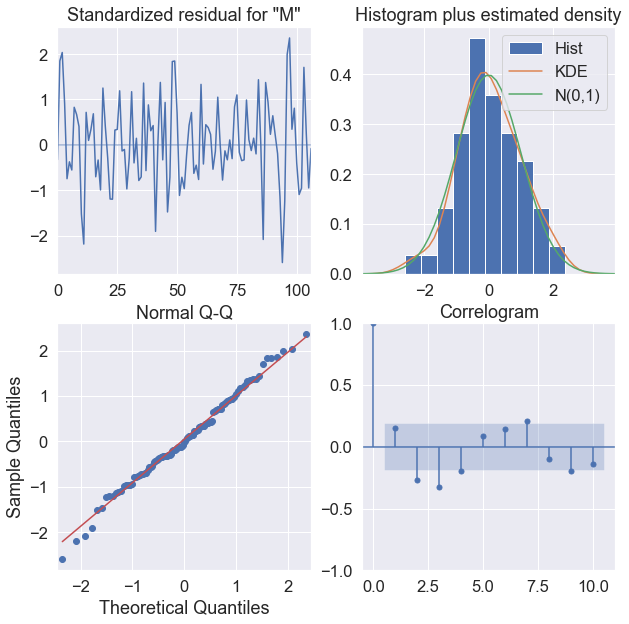

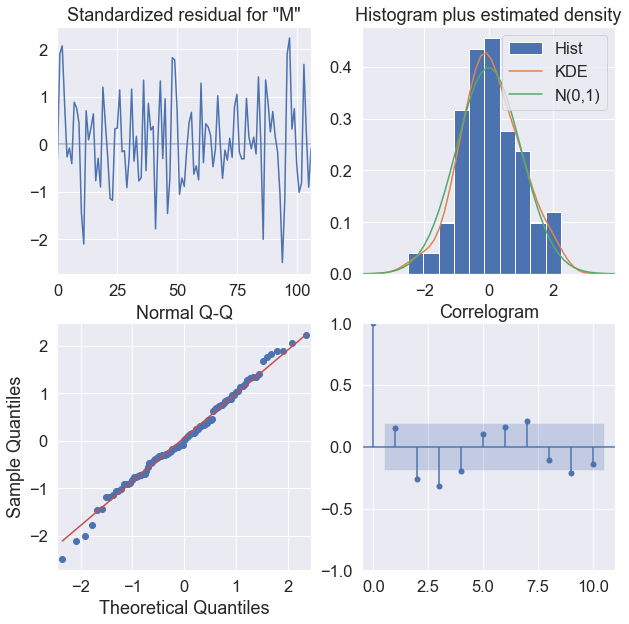

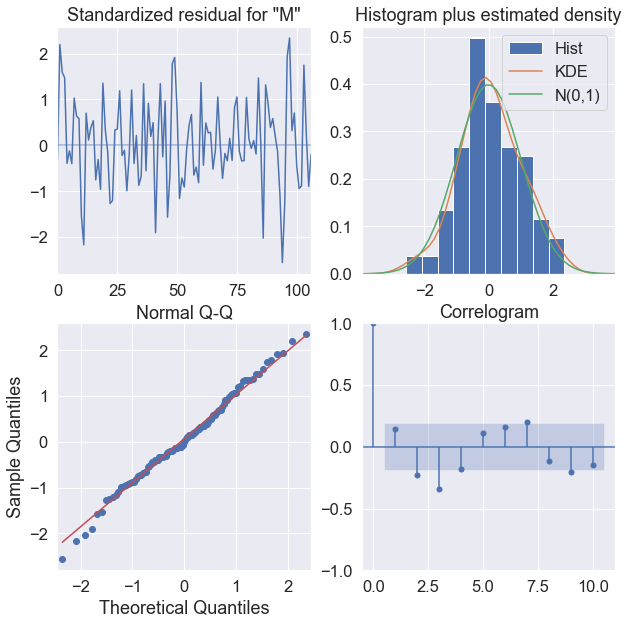

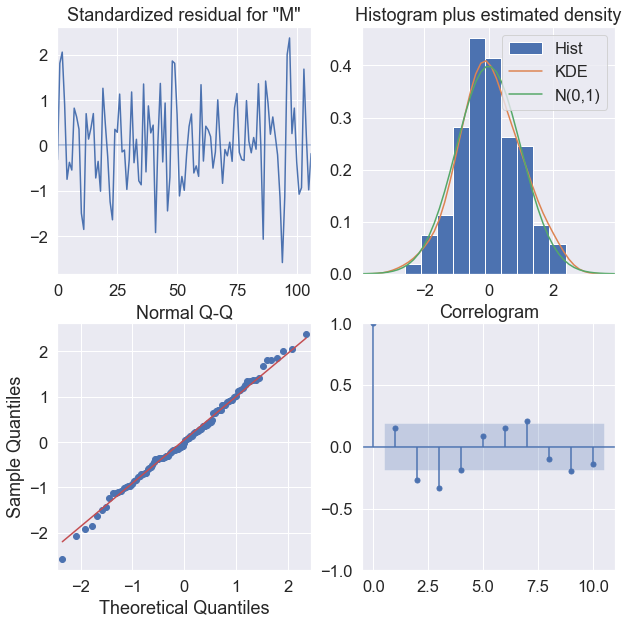

In [343]:
SARIMA_model1_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model2_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model3_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model4_fit.plot_diagnostics(figsize=(10,10));

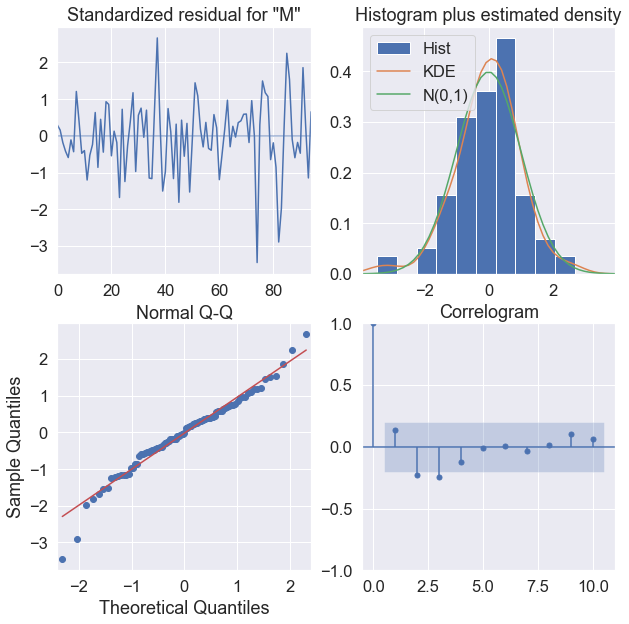

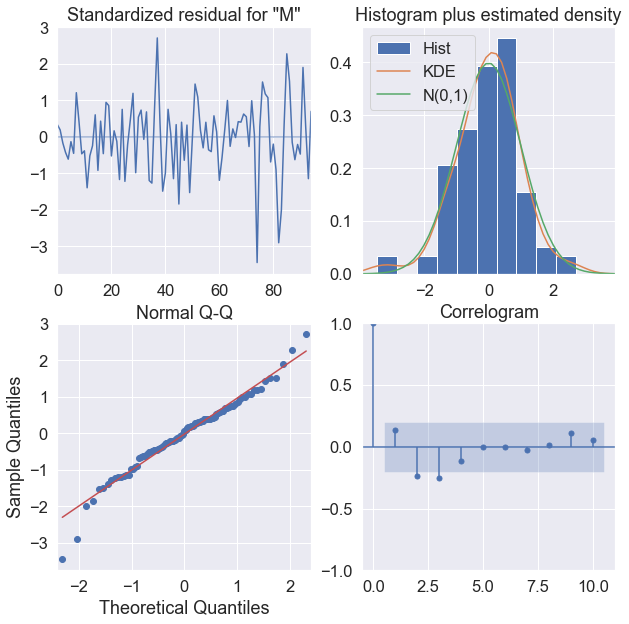

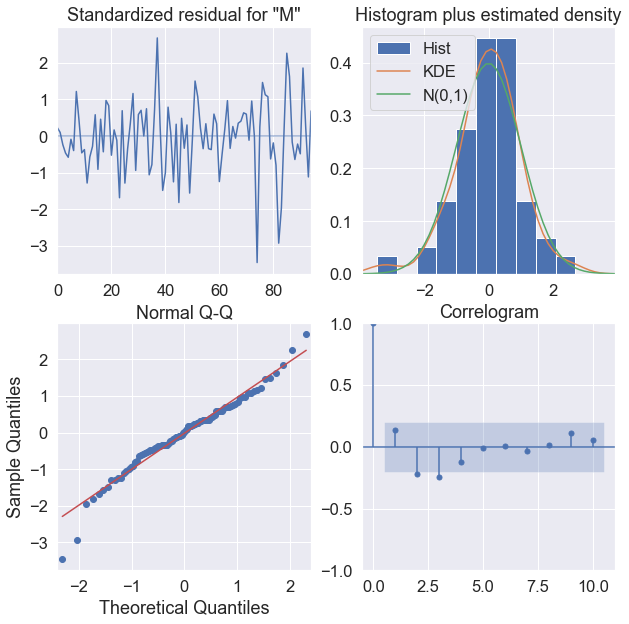

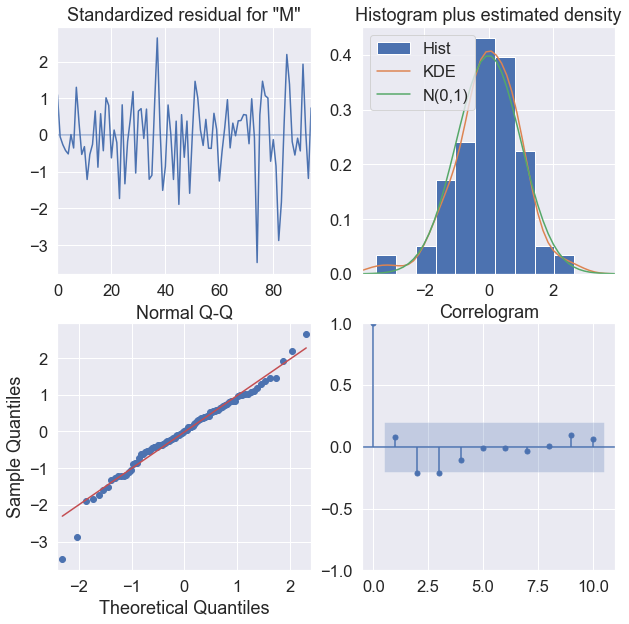

In [344]:
SARIMA_model5_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model6_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model7_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model8_fit.plot_diagnostics(figsize=(10,10));

In [345]:
from statsmodels.stats.diagnostic import acorr_ljungbox
 
residuals = SARIMA_model1_fit.resid
 
print("S1: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model2_fit.resid
 
print("S2: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model3_fit.resid
 
print("S3: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model4_fit.resid
 
print("S4: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

S1: 
      lb_stat  lb_pvalue
1   0.130658   0.717751
2   0.131135   0.936536
3   0.152931   0.984804
4   0.209157   0.994898
5   0.216540   0.998925
6   0.328394   0.999347
7   0.534228   0.999311
8   0.535332   0.999827
9   0.698855   0.999873
10  0.793727   0.999941
S2: 
      lb_stat  lb_pvalue
1   0.128861   0.719615
2   0.133842   0.935269
3   0.135913   0.987204
4   0.208027   0.994951
5   0.255410   0.998399
6   0.524129   0.997532
7   0.778886   0.997654
8   0.780932   0.999290
9   0.937773   0.999568
10  1.017624   0.999814
S3: 
      lb_stat  lb_pvalue
1   0.105217   0.745656
2   0.188766   0.909934
3   0.383630   0.943603
4   0.398406   0.982607
5   0.434433   0.994328
6   0.683992   0.994830
7   0.921051   0.996004
8   0.927929   0.998664
9   1.130914   0.999072
10  1.191596   0.999618
S4: 
      lb_stat  lb_pvalue
1   0.132801   0.715546
2   0.133388   0.935481
3   0.153368   0.984741
4   0.197883   0.995416
5   0.204303   0.999067
6   0.320617   0.999391
7   0.512624   0

In [346]:
residuals = SARIMA_model5_fit.resid
 
print("S5: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model6_fit.resid
 
print("S6: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model7_fit.resid
 
print("S7: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model8_fit.resid
 
print("S8: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

S5: 
       lb_stat  lb_pvalue
1    1.903485   0.167689
2    2.661366   0.264297
3    3.660503   0.300534
4    4.732927   0.315814
5    4.901979   0.427960
6    5.005380   0.543123
7    5.967567   0.543541
8    8.437163   0.391972
9   10.089303   0.343304
10  10.490000   0.398605
S6: 
       lb_stat  lb_pvalue
1    1.861391   0.172464
2    2.549012   0.279569
3    3.498230   0.320992
4    4.577916   0.333408
5    4.766016   0.445098
6    4.866448   0.561053
7    5.784471   0.565129
8    8.202194   0.413973
9    9.793407   0.367468
10  10.185363   0.424384
S7: 
       lb_stat  lb_pvalue
1    2.002460   0.157044
2    2.811467   0.245187
3    3.832651   0.280111
4    4.911727   0.296475
5    5.086311   0.405438
6    5.187837   0.519957
7    6.158112   0.521414
8    8.669648   0.370926
9   10.354779   0.322535
10  10.802637   0.373100
S8: 
      lb_stat  lb_pvalue
1   0.622505   0.430118
2   1.628342   0.443006
3   2.786203   0.425776
4   3.906127   0.418859
5   4.052050   0.541947
6   4.1

In [347]:
test1

,Month,Median Price,naive_seasonal,ARIMA_pred1
108,2022-01,827500,672000,788191.853408
109,2022-02,932000,765000,817869.509062
110,2022-03,979000,860000,833329.367864
111,2022-04,980000,875000,822784.854367
112,2022-05,980000,890000,830879.445380
113,2022-06,930000,867000,826423.514743
114,2022-07,850000,817700,816453.920243
115,2022-08,820000,785000,800509.629194
116,2022-09,859000,860000,819287.501210
117,2022-10,887500,880900,859354.609257


In [348]:
SARIMA_pred1 = SARIMA_model1_fit.get_prediction(108,119).predicted_mean
 
test1['SARIMA_pred1'] = SARIMA_pred1

SARIMA_pred2 = SARIMA_model2_fit.get_prediction(108,119).predicted_mean
 
test1['SARIMA_pred2'] = SARIMA_pred2

SARIMA_pred3 = SARIMA_model3_fit.get_prediction(108,119).predicted_mean
 
test1['SARIMA_pred3'] = SARIMA_pred3

SARIMA_pred4 = SARIMA_model4_fit.get_prediction(108,119).predicted_mean
 
test1['SARIMA_pred4'] = SARIMA_pred4

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/2922201168.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test1['SARIMA_pred1'] = SARIMA_pred1
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/2922201168.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test1['SARIMA_pred2'] = SARIMA_pred2
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/2922201168.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usi

In [349]:
SARIMA_pred5 = SARIMA_model5_fit.get_prediction(108,119).predicted_mean
 
test1['SARIMA_pred5'] = SARIMA_pred5

SARIMA_pred6 = SARIMA_model6_fit.get_prediction(108,119).predicted_mean
 
test1['SARIMA_pred6'] = SARIMA_pred6

SARIMA_pred7 = SARIMA_model7_fit.get_prediction(108,119).predicted_mean
 
test1['SARIMA_pred7'] = SARIMA_pred7

SARIMA_pred8 = SARIMA_model8_fit.get_prediction(108,119).predicted_mean
 
test1['SARIMA_pred8'] = SARIMA_pred8

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/3717650054.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test1['SARIMA_pred5'] = SARIMA_pred5
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/3717650054.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test1['SARIMA_pred6'] = SARIMA_pred6
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/3717650054.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usi

In [350]:
test1

,Month,Median Price,naive_seasonal,ARIMA_pred1,SARIMA_pred1,SARIMA_pred2,SARIMA_pred3,SARIMA_pred4,SARIMA_pred5,SARIMA_pred6,SARIMA_pred7,SARIMA_pred8
108,2022-01,827500,672000,788191.853408,803969.446390,805620.514465,804539.153901,802458.211650,796177.472756,796714.629019,794945.612859,797563.905696
109,2022-02,932000,765000,817869.509062,839637.306484,840625.202239,838326.000045,837389.407840,878377.226564,879986.879396,877719.189052,879777.955266
110,2022-03,979000,860000,833329.367864,861417.223322,860977.946491,860020.247360,856507.534995,938916.727559,941755.856436,939665.132469,940323.955694
111,2022-04,980000,875000,822784.854367,865061.057150,865099.110532,864705.739729,857764.781817,925649.128621,928099.245457,924784.988048,926962.072399
112,2022-05,980000,890000,830879.445380,872365.660316,873206.887102,872836.232864,866034.706401,919686.424566,921757.995100,919784.090144,920882.080740
113,2022-06,930000,867000,826423.514743,868534.066110,869599.088166,869074.228949,864265.597292,891197.111011,893491.387855,891576.782982,892428.857151
114,2022-07,850000,817700,816453.920243,851920.194274,852860.462935,852112.483648,849444.858129,852303.045313,854270.177353,853174.598237,853742.746963
115,2022-08,820000,785000,800509.629194,844251.846554,845017.806173,844180.793333,843077.340676,843723.281441,845383.459804,844476.195665,845243.814994
116,2022-09,859000,860000,819287.501210,869546.803123,870226.679829,869531.144366,866491.377242,936591.223379,937246.268231,938255.675132,938212.937547
117,2022-10,887500,880900,859354.609257,874521.684011,875180.137861,874629.018121,870853.225201,974157.246054,974402.888656,976049.717079,975406.248513


In [351]:
def mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
 
mape_naive_seasonal = mape(test1['Median Price'], test1['naive_seasonal'])
mape_ARIMA1 = mape(test1['Median Price'], test1['ARIMA_pred1'])
mape_SARIMA1 = mape(test1['Median Price'], test1['SARIMA_pred1'])
mape_SARIMA2 = mape(test1['Median Price'], test1['SARIMA_pred2'])
mape_SARIMA3 = mape(test1['Median Price'], test1['SARIMA_pred3'])
mape_SARIMA4 = mape(test1['Median Price'], test1['SARIMA_pred4'])
mape_SARIMA5 = mape(test1['Median Price'], test1['SARIMA_pred5'])
mape_SARIMA6 = mape(test1['Median Price'], test1['SARIMA_pred6'])
mape_SARIMA7 = mape(test1['Median Price'], test1['SARIMA_pred7'])
mape_SARIMA8 = mape(test1['Median Price'], test1['SARIMA_pred8'])

In [352]:
print("MAPE NAIVE: ", mape_naive_seasonal)
print("MAPE ARIMA1: ", mape_ARIMA1)
print("MAPE SARIMA1: ", mape_SARIMA1)
print("MAPE SARIMA2: ", mape_SARIMA2)
print("MAPE SARIMA3: ", mape_SARIMA3)
print("MAPE SARIMA4: ", mape_SARIMA4)
print("MAPE SARIMA5: ", mape_SARIMA5)
print("MAPE SARIMA6: ", mape_SARIMA6)
print("MAPE SARIMA7: ", mape_SARIMA7)
print("MAPE SARIMA8: ", mape_SARIMA8)

MAPE NAIVE:  7.228835773246243
MAPE ARIMA1:  7.5021931202827785
MAPE SARIMA1:  5.372677119181169
MAPE SARIMA2:  5.36568572707267
MAPE SARIMA3:  5.382651144882333
MAPE SARIMA4:  5.495394559255997
MAPE SARIMA5:  6.051374544943374
MAPE SARIMA6:  5.99394828837608
MAPE SARIMA7:  6.1260466766673165
MAPE SARIMA8:  6.047178147312828


In [855]:
# Create a dictionary with the MAPE and RMSE values
data = {'MAPE': [mape_naive_seasonal, mape_ARIMA1, mape_SARIMA1, mape_SARIMA2, mape_SARIMA3, mape_SARIMA4, mape_SARIMA5, mape_SARIMA6, mape_SARIMA7, mape_SARIMA8]}
# Create a DataFrame from the dictionary
df = pd.DataFrame(data)

# Set the index of the DataFrame to be the MAPE and RMSE titles
df.index = ['Naive - 2021' , 'ARIMA(7,1,8)', 'SARIMA(3,1,0)(1,0,1)', 'SARIMA(0,1,3)(1,0,1)', 'SARIMA(2,1,1)(1,0,1)', 
           'SARIMA(3,1,0)(1,0,2)', 'SARIMA(2,1,2)(0,1,2)', 'SARIMA(2,1,2)(2,1,0)', 'SARIMA(2,1,2)(2,1,0)', 'SARIMA(2,1,3)(0,1,2)']

# Display the DataFrame
df

,MAPE
Naive - 2021,10.896320
"ARIMA(7,1,8)",7.502193
"SARIMA(3,1,0)(1,0,1)",5.372677
"SARIMA(0,1,3)(1,0,1)",5.365686
"SARIMA(2,1,1)(1,0,1)",5.382651
"SARIMA(3,1,0)(1,0,2)",5.495395
"SARIMA(2,1,2)(0,1,2)",6.051375
"SARIMA(2,1,2)(2,1,0)",5.993948
"SARIMA(2,1,2)(2,1,0)",6.126047
"SARIMA(2,1,3)(0,1,2)",6.047178


In [110]:
target_trainM

0      413500
1      434000
2      441000
3      453500
4      478500
5      455000
6      439000
7      423000
8      451510
9      467000
10     470000
11     423250
12     435000
13     459950
14     480000
15     500000
16     522000
17     493000
18     475000
19     443250
20     488900
21     505000
22     490800
23     441500
24     460000
25     480000
26     505000
27     550000
28     552000
29     533250
30     495000
31     479000
32     530000
33     525888
34     520000
35     480000
36     500000
37     549900
38     548900
39     583000
40     595000
41     597500
42     529000
43     517750
44     580000
45     580000
46     597500
47     534900
48     539900
49     608500
50     680000
51     715000
52     675000
53     635000
54     589500
55     584000
56     625000
57     650000
58     630000
59     590000
60     588000
61     650000
62     660000
63     685000
64     690000
65     686500
66     650000
67     637500
68     690000
69     699000
70     670000
71    

In [314]:
t_stats

,Month,Median Price
0,2013-01,413500
1,2013-02,434000
2,2013-03,441000
3,2013-04,453500
4,2013-05,478500
5,2013-06,455000
6,2013-07,439000
7,2013-08,423000
8,2013-09,451510
9,2013-10,467000


In [315]:
t_stats.iloc[104:108]

,Month,Median Price
104,2021-09,860000
105,2021-10,880900
106,2021-11,840000
107,2021-12,802000


In [316]:
t_stats[116:120]

,Month,Median Price
116,2022-09,859000
117,2022-10,887500
118,2022-11,851000
119,2022-12,810000


In [317]:
t_stats[:-9]

,Month,Median Price
0,2013-01,413500
1,2013-02,434000
2,2013-03,441000
3,2013-04,453500
4,2013-05,478500
5,2013-06,455000
6,2013-07,439000
7,2013-08,423000
8,2013-09,451510
9,2013-10,467000


In [354]:
target_train6M = t_stats['Median Price'][:-9]
target_train6M

0      413500
1      434000
2      441000
3      453500
4      478500
5      455000
6      439000
7      423000
8      451510
9      467000
10     470000
11     423250
12     435000
13     459950
14     480000
15     500000
16     522000
17     493000
18     475000
19     443250
20     488900
21     505000
22     490800
23     441500
24     460000
25     480000
26     505000
27     550000
28     552000
29     533250
30     495000
31     479000
32     530000
33     525888
34     520000
35     480000
36     500000
37     549900
38     548900
39     583000
40     595000
41     597500
42     529000
43     517750
44     580000
45     580000
46     597500
47     534900
48     539900
49     608500
50     680000
51     715000
52     675000
53     635000
54     589500
55     584000
56     625000
57     650000
58     630000
59     590000
60     588000
61     650000
62     660000
63     685000
64     690000
65     686500
66     650000
67     637500
68     690000
69     699000
70     670000
71    

In [319]:
#predicting last month of 2023
from itertools import product
 
ps = range(0, 13, 1)
qs = range(0, 13, 1)    
Ps = [0]
Qs = [0]    

d = 1
D = 0
s = 12
 
ARIMA_order_list = list(product(ps, qs, Ps, Qs))

ARIMA_result_df5 = optimize_SARIMA(target_train6M, ARIMA_order_list, d, D, s)
ARIMA_result_df5

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/2473469477.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/169 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-pa

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaco

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


,"(p,q,P,Q)",AIC
0,"(9, 10, 0, 0)",2715.321694
1,"(9, 11, 0, 0)",2717.075086
2,"(8, 8, 0, 0)",2718.049750
3,"(9, 9, 0, 0)",2718.175741
4,"(10, 11, 0, 0)",2718.614959
5,"(5, 4, 0, 0)",2719.530692
6,"(9, 8, 0, 0)",2719.670581
7,"(9, 7, 0, 0)",2720.918836
8,"(8, 9, 0, 0)",2721.012663
9,"(8, 7, 0, 0)",2721.759869


In [355]:
ARIMA_model6 = SARIMAX(target_train6M, order=(9,1,10), simple_differencing=False)
ARIMA_model6_fit = ARIMA_model6.fit(disp=False)
test6 = t_stats.iloc[116:120]
test6['naive_seasonal'] = t_stats['Median Price'].iloc[104:108].values
ARIMA_pred6 = ARIMA_model6_fit.get_prediction(116,119).predicted_mean
test6['ARIMA_pred6'] = ARIMA_pred6

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/355144271.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test6['naive_seasonal'] = t_stats['Median Price'].iloc[104:108].values
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/355144271.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

In [321]:
ps = range(0, 4, 1)
qs = range(0, 4, 1)
Ps = range(0, 4, 1)
Qs = range(0, 4, 1)
SARIMA_order_list = list(product(ps, qs, Ps, Qs))
d = 1
D = 0
s = 12
SARIMA_result_df6M = optimize_SARIMA(target_train6M, SARIMA_order_list, d, D, s)
SARIMA_result_df6M

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/2473469477.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/256 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregre

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregre

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/us

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA param

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autore

,"(p,q,P,Q)",AIC
0,"(0, 3, 1, 1)",2703.600504
1,"(2, 1, 1, 1)",2703.898559
2,"(3, 0, 1, 1)",2703.906670
3,"(1, 3, 1, 1)",2705.359161
4,"(0, 3, 1, 2)",2705.588748
5,"(0, 3, 2, 1)",2705.589556
6,"(2, 0, 1, 1)",2705.684969
7,"(3, 1, 1, 1)",2705.696049
8,"(2, 2, 1, 1)",2705.755623
9,"(2, 1, 1, 2)",2705.898540


In [404]:
SARIMA_model6M1 = SARIMAX(target_train6M, order=(3,1,0), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model6M1_fit = SARIMA_model6M1.fit(disp=False)

SARIMA_model6M2 = SARIMAX(target_train6M, order=(2,1,1), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model6M2_fit = SARIMA_model6M2.fit(disp=False)

SARIMA_model6M3 = SARIMAX(target_train6M, order=(0,1,3), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model6M3_fit = SARIMA_model6M3.fit(disp=False)

SARIMA_model6M4 = SARIMAX(target_train6M, order=(3,1,0), seasonal_order=(1,0,2,12), simple_differencing=False)
SARIMA_model6M4_fit = SARIMA_model6M4.fit(disp=False)

SARIMA_pred6M1 = SARIMA_model6M1_fit.get_prediction(116,119).predicted_mean
 
test6['SARIMA_pred6M1'] = SARIMA_pred6M1

SARIMA_pred6M2 = SARIMA_model6M2_fit.get_prediction(116,119).predicted_mean
 
test6['SARIMA_pred6M2'] = SARIMA_pred6M2

SARIMA_pred6M3 = SARIMA_model6M3_fit.get_prediction(116,119).predicted_mean
 
test6['SARIMA_pred6M3'] = SARIMA_pred6M3

SARIMA_pred6M4 = SARIMA_model6M4_fit.get_prediction(116,119).predicted_mean
 
test6['SARIMA_pred6M4'] = SARIMA_pred6M4

def mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
 
mape_naive_seasonal = mape(test6['Median Price'], test6['naive_seasonal'])
mape_ARIMA6 = mape(test6['Median Price'], test6['ARIMA_pred6'])
mape_SARIMA6M1 = mape(test6['Median Price'], test6['SARIMA_pred6M1'])
mape_SARIMA6M2 = mape(test6['Median Price'], test6['SARIMA_pred6M2'])
mape_SARIMA6M3 = mape(test6['Median Price'], test6['SARIMA_pred6M3'])
mape_SARIMA6M4 = mape(test6['Median Price'], test6['SARIMA_pred6M4'])

print("MAPE NAIVE: ", mape_naive_seasonal)
print("MAPE ARIMA6: ", mape_ARIMA6)
print("MAPE SARIMA6M1: ", mape_SARIMA6M1)
print("MAPE SARIMA6M2: ", mape_SARIMA6M2)
print("MAPE SARIMA6M3: ", mape_SARIMA6M3)
print("MAPE SARIMA6M4: ", mape_SARIMA6M4)


MAPE NAIVE:  0.7850819182448716
MAPE ARIMA6:  1.4009942960683084
MAPE SARIMA6M1:  1.495381917059418
MAPE SARIMA6M2:  1.8462110362814417
MAPE SARIMA6M3:  1.64585368583463
MAPE SARIMA6M4:  1.491093380900006


/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/1773123488.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test6['SARIMA_pred6M1'] = SARIMA_pred6M1
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/1773123488.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test6['SARIMA_pred6M2'] = SARIMA_pred6M2
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/1773123488.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

In [405]:
test6

,Month,Median Price,naive_seasonal,ARIMA_pred6,SARIMA_pred6M1,SARIMA_pred6M2,SARIMA_pred6M3,SARIMA_pred6M4
116,2022-09,859000,860000,844018.094275,856893.865183,857555.750743,858320.237220,856676.974692
117,2022-10,887500,880900,876292.914605,872688.479154,874631.038513,875023.616147,872472.942478
118,2022-11,851000,840000,856172.482791,860468.897766,865699.923631,863646.228182,860280.247584
119,2022-12,810000,802000,826113.205171,833933.559864,842718.478023,839260.825143,833572.939015


In [406]:
# Create a dictionary with the MAPE and RMSE values
data = {'MAPE': [mape_naive_seasonal, mape_ARIMA6, mape_SARIMA6M1, mape_SARIMA6M2, mape_SARIMA6M3, mape_SARIMA6M4]}
# Create a DataFrame from the dictionary
df = pd.DataFrame(data)

# Set the index of the DataFrame to be the MAPE and RMSE titles
df.index = ['Naive - Sept-Dec2021' , 'ARIMA(10,1,11)', 'SARIMA(3,1,0)(1,0,1)', 'SARIMA(2,1,2)(1,0,1)', 'SARIMA(0,1,3)(1,0,1)', 
           'SARIMA(3,1,0)(1,0,2)']
df

,MAPE
Naive - Sept-Dec2021,0.785082
"ARIMA(10,1,11)",1.400994
"SARIMA(3,1,0)(1,0,1)",1.495382
"SARIMA(2,1,2)(1,0,1)",1.846211
"SARIMA(0,1,3)(1,0,1)",1.645854
"SARIMA(3,1,0)(1,0,2)",1.491093


In [605]:
#predicting last month of 2023
from itertools import product
 
ps = range(0, 13, 1)
qs = range(0, 13, 1)    
Ps = [0]
Qs = [0]    

d = 1
D = 0
s = 12
 
ARIMA_order_list = list(product(ps, qs, Ps, Qs))

ARIMA_result_df3 = optimize_SARIMA(target_trainM, ARIMA_order_list, d, D, s)
ARIMA_result_df3

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_39063/2473469477.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/169 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaco

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaco

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaco

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

,"(p,q,P,Q)",AIC
0,"(9, 11, 0, 0)",2895.285252
1,"(11, 9, 0, 0)",2897.067589
2,"(10, 11, 0, 0)",2897.122661
3,"(10, 9, 0, 0)",2898.214632
4,"(9, 10, 0, 0)",2898.733930
5,"(4, 4, 0, 0)",2899.428276
6,"(10, 12, 0, 0)",2899.507314
7,"(9, 9, 0, 0)",2899.674790
8,"(8, 8, 0, 0)",2899.784715
9,"(8, 9, 0, 0)",2900.828488


In [359]:
ARIMA_model3 = SARIMAX(target_trainM, order=(9,1,11), simple_differencing=False)
ARIMA_model3_fit = ARIMA_model3.fit(disp=False)
test3 = t_stats.iloc[-1:]
test3['naive_seasonal'] = t_stats['Median Price'].iloc[111:112].values
ARIMA_pred3 = ARIMA_model3_fit.get_prediction(124,124).predicted_mean
test3['ARIMA_pred3'] = ARIMA_pred3

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/2694364583.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test3['naive_seasonal'] = t_stats['Median Price'].iloc[111:112].values
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/2694364583.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gu

In [608]:
ps = range(0, 4, 1)
qs = range(0, 4, 1)
Ps = range(0, 4, 1)
Qs = range(0, 4, 1)
SARIMA_order_list = list(product(ps, qs, Ps, Qs))
d = 1
D = 0
s = 12
SARIMA_result_df1M = optimize_SARIMA(target_trainM, SARIMA_order_list, d, D, s)
SARIMA_result_df1M

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_39063/2473469477.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/256 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/u

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA param

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/User

,"(p,q,P,Q)",AIC
0,"(0, 3, 1, 1)",2886.224566
1,"(3, 0, 1, 1)",2886.329183
2,"(2, 1, 1, 1)",2886.709788
3,"(1, 3, 1, 1)",2888.076202
4,"(0, 3, 1, 2)",2888.196047
5,"(0, 3, 2, 1)",2888.197895
6,"(3, 0, 1, 2)",2888.311591
7,"(3, 0, 2, 1)",2888.312754
8,"(3, 1, 1, 1)",2888.344647
9,"(2, 2, 1, 1)",2888.691807


In [360]:
SARIMA_model1M = SARIMAX(target_trainM, order=(0,1,3), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model1M_fit = SARIMA_model1M.fit(disp=False)

SARIMA_model2M = SARIMAX(target_trainM, order=(3,1,0), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model2M_fit = SARIMA_model2M.fit(disp=False)

SARIMA_model3M = SARIMAX(target_trainM, order=(2,1,1), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model3M_fit = SARIMA_model3M.fit(disp=False)

SARIMA_model4M = SARIMAX(target_trainM, order=(1,1,3), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model4M_fit = SARIMA_model4M.fit(disp=False)

SARIMA_pred1M = SARIMA_model1M_fit.get_prediction(124,124).predicted_mean
 
test3['SARIMA_pred1M'] = SARIMA_pred1M

SARIMA_pred2M = SARIMA_model2M_fit.get_prediction(124,124).predicted_mean
 
test3['SARIMA_pred2M'] = SARIMA_pred2M

SARIMA_pred3M = SARIMA_model3M_fit.get_prediction(124,124).predicted_mean
 
test3['SARIMA_pred3M'] = SARIMA_pred3M

SARIMA_pred4M = SARIMA_model4M_fit.get_prediction(124,124).predicted_mean
 
test3['SARIMA_pred4M'] = SARIMA_pred4M

def mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
 
mape_naive_seasonal = mape(test3['Median Price'], test3['naive_seasonal'])
mape_ARIMA3 = mape(test3['Median Price'], test3['ARIMA_pred3'])
mape_SARIMA1M = mape(test3['Median Price'], test3['SARIMA_pred1M'])
mape_SARIMA2M = mape(test3['Median Price'], test3['SARIMA_pred2M'])
mape_SARIMA3M = mape(test3['Median Price'], test3['SARIMA_pred3M'])
mape_SARIMA4M = mape(test3['Median Price'], test3['SARIMA_pred4M'])

print("MAPE NAIVE: ", mape_naive_seasonal)
print("MAPE ARIMA3: ", mape_ARIMA3)
print("MAPE SARIMA1M: ", mape_SARIMA1M)
print("MAPE SARIMA2M: ", mape_SARIMA2M)
print("MAPE SARIMA3M: ", mape_SARIMA3M)
print("MAPE SARIMA4M: ", mape_SARIMA4M)


MAPE NAIVE:  5.512489233419466
MAPE ARIMA3:  4.1809931211318805
MAPE SARIMA1M:  4.755935571093233
MAPE SARIMA2M:  4.838306820334682
MAPE SARIMA3M:  4.514531541188041
MAPE SARIMA4M:  4.754111032390251


/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/2598185687.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test3['SARIMA_pred1M'] = SARIMA_pred1M
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/2598185687.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test3['SARIMA_pred2M'] = SARIMA_pred2M
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/2598185687.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
T

In [361]:
data = {'MAPE': [mape_naive_seasonal, mape_ARIMA3, mape_SARIMA1M, mape_SARIMA2M, mape_SARIMA3M, mape_SARIMA4M]}
df = pd.DataFrame(data)

df.index = ['Naive - May2022' , 'ARIMA(9,1,11)', 'SARIMA(0,1,3)(1,0,1)', 'SARIMA(3,1,0)(1,0,1)', 'SARIMA(2,1,1)(1,0,1)', 
           'SARIMA(1,1,3)(1,0,1)']

df

,MAPE
Naive - May2022,5.512489
"ARIMA(9,1,11)",4.180993
"SARIMA(0,1,3)(1,0,1)",4.755936
"SARIMA(3,1,0)(1,0,1)",4.838307
"SARIMA(2,1,1)(1,0,1)",4.514532
"SARIMA(1,1,3)(1,0,1)",4.754111


In [122]:
target_trainQ

0      413500
1      434000
2      441000
3      453500
4      478500
5      455000
6      439000
7      423000
8      451510
9      467000
10     470000
11     423250
12     435000
13     459950
14     480000
15     500000
16     522000
17     493000
18     475000
19     443250
20     488900
21     505000
22     490800
23     441500
24     460000
25     480000
26     505000
27     550000
28     552000
29     533250
30     495000
31     479000
32     530000
33     525888
34     520000
35     480000
36     500000
37     549900
38     548900
39     583000
40     595000
41     597500
42     529000
43     517750
44     580000
45     580000
46     597500
47     534900
48     539900
49     608500
50     680000
51     715000
52     675000
53     635000
54     589500
55     584000
56     625000
57     650000
58     630000
59     590000
60     588000
61     650000
62     660000
63     685000
64     690000
65     686500
66     650000
67     637500
68     690000
69     699000
70     670000
71    

In [612]:
from itertools import product
 
ps = range(0, 13, 1)
qs = range(0, 13, 1)    
Ps = [0]
Qs = [0]    

d = 1
D = 0
s = 12
 
ARIMA_order_list = list(product(ps, qs, Ps, Qs))

In [613]:
#predicting last 3 months 2023 (removing 3 months) ARIMA
ARIMA_result_df2 = optimize_SARIMA(target_trainQ, ARIMA_order_list, d, D, s)
ARIMA_result_df2

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_39063/2473469477.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/169 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaco

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaco

,"(p,q,P,Q)",AIC
0,"(9, 11, 0, 0)",2849.882744
1,"(10, 9, 0, 0)",2850.482618
2,"(11, 9, 0, 0)",2850.485806
3,"(10, 10, 0, 0)",2851.158016
4,"(9, 10, 0, 0)",2851.484033
5,"(8, 8, 0, 0)",2851.595412
6,"(10, 11, 0, 0)",2852.604265
7,"(8, 9, 0, 0)",2853.087383
8,"(9, 9, 0, 0)",2853.205098
9,"(9, 8, 0, 0)",2853.727892


In [362]:
ARIMA_model2 = SARIMAX(target_trainQ, order=(9,1,11), simple_differencing=False)
ARIMA_model2_fit = ARIMA_model2.fit(disp=False)
print(ARIMA_model2_fit.summary())

                               SARIMAX Results                                
Dep. Variable:           Median Price   No. Observations:                  122
Model:              SARIMAX(9, 1, 11)   Log Likelihood               -1403.941
Date:                Tue, 15 Aug 2023   AIC                           2849.883
Time:                        02:30:25   BIC                           2908.594
Sample:                             0   HQIC                          2873.728
                                - 122                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2399      0.160      1.502      0.133      -0.073       0.553
ar.L2         -0.2010      0.170     -1.182      0.237      -0.534       0.132
ar.L3         -0.7629      0.163     -4.694      0.0

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


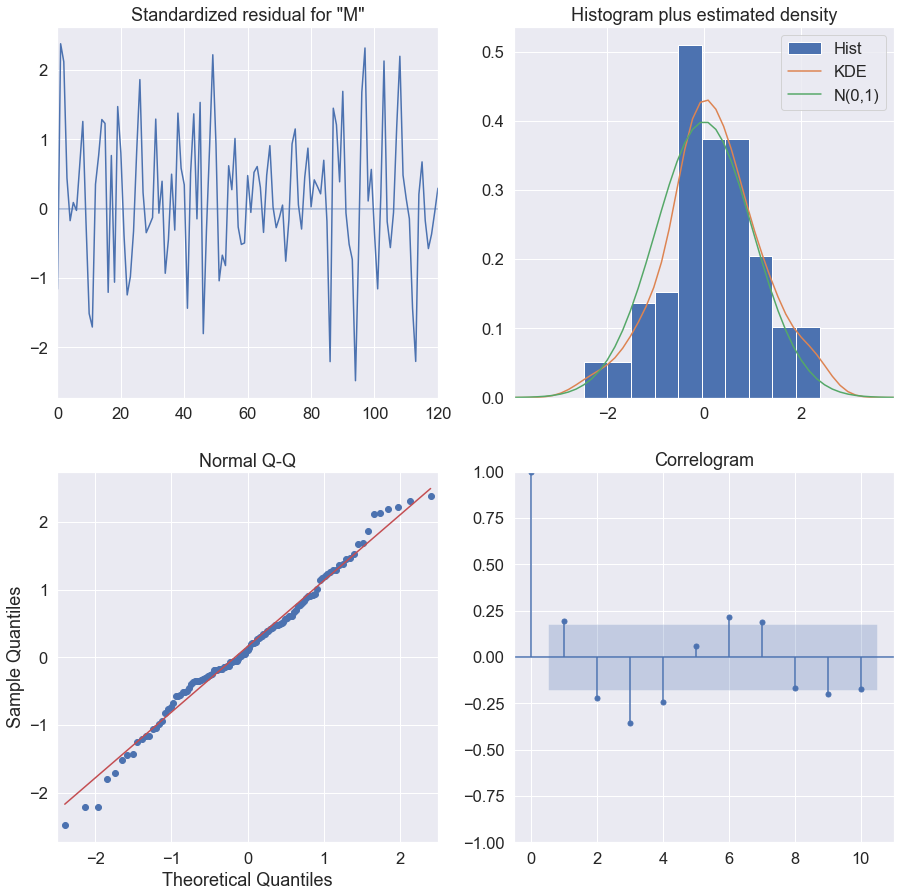

In [363]:
ARIMA_model2_fit.plot_diagnostics(figsize=(15,15));

In [364]:
residuals2 = ARIMA_model2_fit.resid
sm.stats.acorr_ljungbox(residuals2, np.arange(1, 11, 1), return_df=True)

,lb_stat,lb_pvalue
1,0.000525,0.981711
2,0.101439,0.950545
3,0.210381,0.975896
4,0.787935,0.940058
5,0.793697,0.977434
6,1.430614,0.963970
7,1.826541,0.968814
8,2.015551,0.980531
9,2.065550,0.990388
10,2.816595,0.985417


In [418]:
test2 = t_stats.iloc[-3:]
test2

,Month,Median Price
122,2023-03,850000
123,2023-04,875000
124,2023-05,928800


In [419]:
t_stats.iloc[110:113]

,Month,Median Price
110,2022-03,979000
111,2022-04,980000
112,2022-05,980000


In [420]:
test2['naive_seasonal'] = t_stats['Median Price'].iloc[110:113].values
ARIMA_pred2 = ARIMA_model2_fit.get_prediction(122,124).predicted_mean
test2['ARIMA_pred2'] = ARIMA_pred2
test2

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/4088747141.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test2['naive_seasonal'] = t_stats['Median Price'].iloc[110:113].values
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/4088747141.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test2['ARIMA_pred2'] = ARIMA_pred2


,Month,Median Price,naive_seasonal,ARIMA_pred2
122,2023-03,850000,979000,881123.161719
123,2023-04,875000,980000,881644.511405
124,2023-05,928800,980000,886984.773039


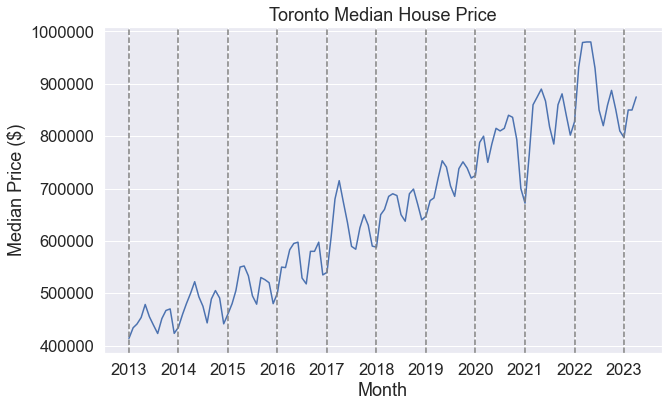

In [368]:
import matplotlib.dates as mdates
import datetime as dt

plt.figure(figsize=(10, 6))
sns.lineplot(x=toronto_all_stats.index, y='Median Price', data=toronto_all_stats)
plt.title('Toronto Median House Price')
plt.xlabel('Month')
plt.ylabel('Median Price ($)')
#plt.xticks(rotation=45)
years = [2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021,2022, 2023]
for year in years:
    plt.axvline(pd.to_datetime(str(year)), color='gray', linestyle='--')
plt.ticklabel_format(style='plain', axis='y')
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.grid(True)
plt.show()

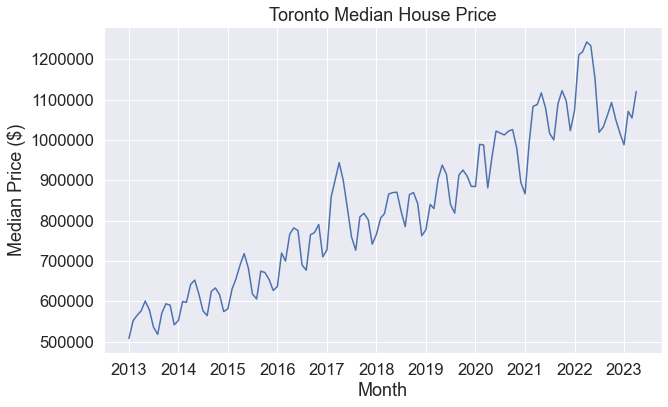

In [871]:
import matplotlib.dates as mdates
import datetime as dt

plt.figure(figsize=(10, 6))
sns.lineplot(x=toronto_all_stats.index, y='Average Price', data=toronto_all_stats)
plt.title('Toronto Median House Price')
plt.xlabel('Month')
plt.ylabel('Median Price ($)')
#plt.xticks(rotation=45)
years = [2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021,2022, 2023]
plt.ticklabel_format(style='plain', axis='y')
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.grid(True)
plt.show()

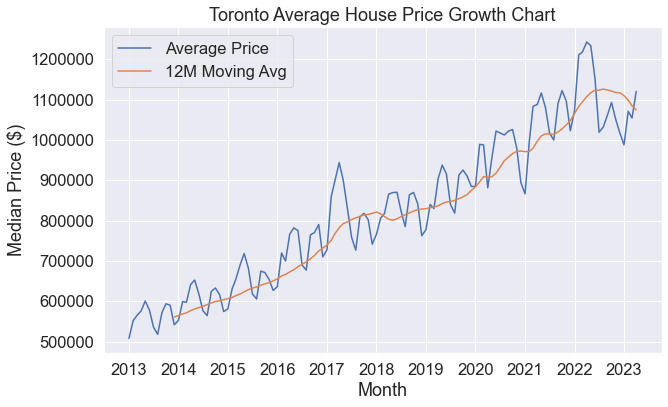

In [881]:
import matplotlib.dates as mdates
import datetime as dt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Assuming you have 'toronto_all_stats' DataFrame loaded

# Calculate the 12-month moving average
toronto_all_stats['12M Moving Avg'] = toronto_all_stats['Average Price'].rolling(window=12).mean()

# Prepare the data for linear regression (trend line)
X = np.array(range(len(toronto_all_stats))).reshape(-1, 1)
y = toronto_all_stats['Average Price'].values
model = LinearRegression()
model.fit(X, y)
trend_line = model.predict(X)

plt.figure(figsize=(10, 6))
sns.lineplot(x=toronto_all_stats.index, y='Average Price', data=toronto_all_stats, label='Average Price')
sns.lineplot(x=toronto_all_stats.index, y='12M Moving Avg', data=toronto_all_stats, label='12M Moving Avg')
#plt.plot(toronto_all_stats.index, trend_line, linestyle='--', color='red', label='Trend Line')

plt.title('Toronto Average House Price Growth Chart')
plt.xlabel('Month')
plt.ylabel('Median Price ($)')
plt.ticklabel_format(style='plain', axis='y')
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.grid(True)
plt.legend()
plt.show()


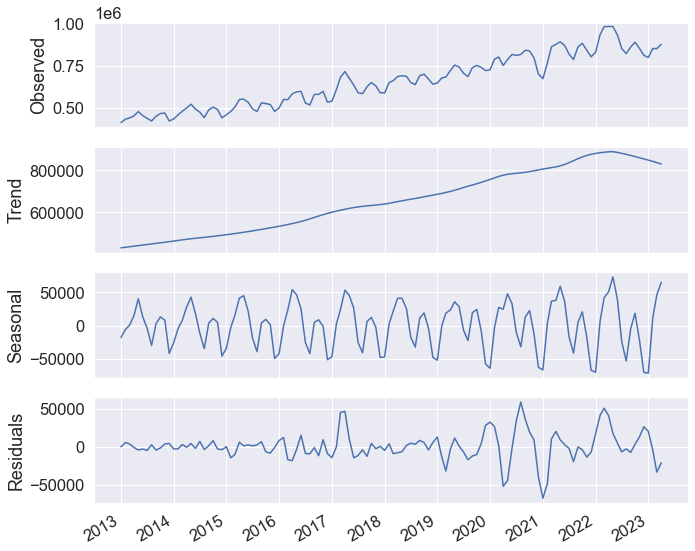

In [369]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import STL
import matplotlib.pyplot as plt

decomposition = STL(toronto_all_stats['Median Price'], period=12).fit()

#t_stats['Month'] = pd.to_datetime(t_stats['Month'])

fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(10, 8))

ax1.plot(toronto_all_stats.index, decomposition.observed)
ax1.set_ylabel('Observed')

ax2.plot(toronto_all_stats.index, decomposition.trend)
ax2.set_ylabel('Trend')

ax3.plot(toronto_all_stats.index, decomposition.seasonal)
ax3.set_ylabel('Seasonal')

ax4.plot(toronto_all_stats.index, decomposition.resid)
ax4.set_ylabel('Residuals')

years = pd.date_range(start=toronto_all_stats.index.min(), end=toronto_all_stats.index.max(), freq='AS')
plt.xticks(years, years.year)

fig.autofmt_xdate()
plt.tight_layout()
plt.show()


In [370]:
#adf test on differenced data once 
#adf test on differenced data seasonal 
from statsmodels.tsa.stattools import adfuller
ad_fuller_result = adfuller(toronto_all_stats['Median Price'])
 
print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

ADF Statistic: -0.6874658737072776
p-value: 0.8499695008044985


not stationary 

In [371]:
df_diff = np.diff(toronto_all_stats['Median Price'], n=1)
 
ad_fuller_result = adfuller(df_diff)
 
print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

ADF Statistic: -3.5776903193617144
p-value: 0.006202147282962566


In [372]:
df_diff_seasonal_diff = np.diff(df_diff, n=12)
 
ad_fuller_result = adfuller(df_diff_seasonal_diff)
 
print(f'ADF Statistic: {ad_fuller_result[0]}')
print(f'p-value: {ad_fuller_result[1]}')

ADF Statistic: -12.535216415118938
p-value: 2.3799971459267307e-23


In [625]:
#test with d=1, and D=1 and d=1, and D=0
ps = range(0, 4, 1)
qs = range(0, 4, 1)
Ps = range(0, 4, 1)
Qs = range(0, 4, 1)
 
SARIMA_order_list = list(product(ps, qs, Ps, Qs))
 
d = 1
D = 0
s = 12
 
SARIMA_result_df11 = optimize_SARIMA(target_trainQ, SARIMA_order_list, d, D, s)
SARIMA_result_df11

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_39063/2473469477.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/256 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/u

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/u

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive paramet

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/User

,"(p,q,P,Q)",AIC
0,"(3, 0, 1, 1)",2839.837760
1,"(0, 3, 1, 1)",2839.917046
2,"(2, 1, 1, 1)",2840.169622
3,"(1, 3, 1, 1)",2841.726582
4,"(3, 0, 1, 2)",2841.789912
5,"(3, 0, 2, 1)",2841.792820
6,"(3, 1, 1, 1)",2841.852007
7,"(0, 3, 1, 2)",2841.854551
8,"(0, 3, 2, 1)",2841.858351
9,"(2, 0, 1, 1)",2842.033705


In [ ]:
# 	(p,q,P,Q)	AIC
# 0	(0, 3, 1, 1)	2794.444042
# 1	(3, 0, 1, 1)	2794.585691 *** 
# 2	(2, 1, 1, 1)	2794.793323
# 3	(1, 3, 1, 1)	2796.305886 ***

In [626]:
#test with d=1, and D=1 and d=1, and D=0
ps = range(0, 4, 1)
qs = range(0, 4, 1)
Ps = range(0, 4, 1)
Qs = range(0, 4, 1)
 
SARIMA_order_list = list(product(ps, qs, Ps, Qs))
 
d = 1
D = 1
s = 12
 
SARIMA_result_df22 = optimize_SARIMA(target_trainQ, SARIMA_order_list, d, D, s)
SARIMA_result_df22

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_39063/2473469477.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/256 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregress

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/o

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive paramet

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


,"(p,q,P,Q)",AIC
0,"(2, 2, 1, 1)",2530.086703
1,"(2, 2, 0, 2)",2530.148903
2,"(3, 2, 1, 1)",2530.259411
3,"(3, 2, 0, 2)",2530.417352
4,"(2, 3, 1, 1)",2530.652155
5,"(2, 3, 0, 2)",2530.818498
6,"(2, 2, 0, 3)",2531.794343
7,"(2, 2, 2, 1)",2531.881782
8,"(2, 2, 1, 2)",2531.898803
9,"(3, 2, 0, 3)",2531.901765


In [ ]:
# 0	(2, 2, 1, 1)	2483.062945
# 1	(3, 2, 1, 1)	2483.079882
# 2	(2, 3, 1, 1)	2483.195146 *** 
# 3	(2, 2, 0, 2)	2483.321154 *** 

In [421]:
SARIMA_model11 = SARIMAX(target_trainQ, order=(0,1,3), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model11_fit = SARIMA_model11.fit(disp=False)

SARIMA_model22 = SARIMAX(target_trainQ, order=(3,1,0), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model22_fit = SARIMA_model22.fit(disp=False)

SARIMA_model33 = SARIMAX(target_trainQ, order=(2,1,1), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model33_fit = SARIMA_model33.fit(disp=False)

SARIMA_model44 = SARIMAX(target_trainQ, order=(1,1,3), seasonal_order=(1,0,1,12), simple_differencing=False)
SARIMA_model44_fit = SARIMA_model44.fit(disp=False)

SARIMA_model55 = SARIMAX(target_trainQ, order=(2,1,2), seasonal_order=(1,1,1,12), simple_differencing=False)
SARIMA_model55_fit = SARIMA_model55.fit(disp=False)

SARIMA_model66 = SARIMAX(target_trainQ, order=(3,1,2), seasonal_order=(1,1,1,12), simple_differencing=False)
SARIMA_model66_fit = SARIMA_model66.fit(disp=False)

SARIMA_model77 = SARIMAX(target_trainQ, order=(2,1,3), seasonal_order=(1,1,1,12), simple_differencing=False)
SARIMA_model77_fit = SARIMA_model77.fit(disp=False)

SARIMA_model88 = SARIMAX(target_trainQ, order=(2,1,2), seasonal_order=(0,1,2,12), simple_differencing=False)
SARIMA_model88_fit = SARIMA_model88.fit(disp=False)


/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


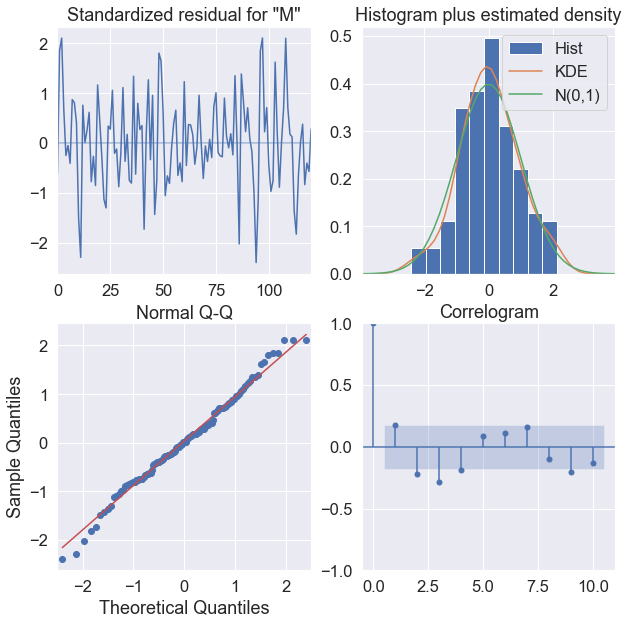

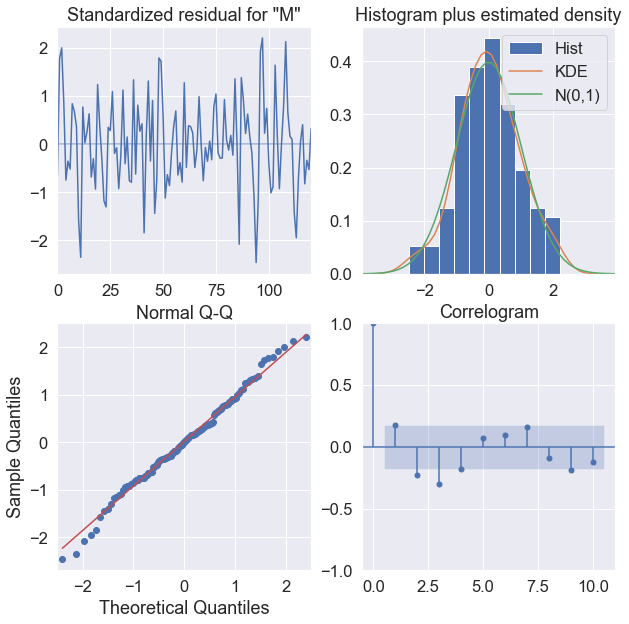

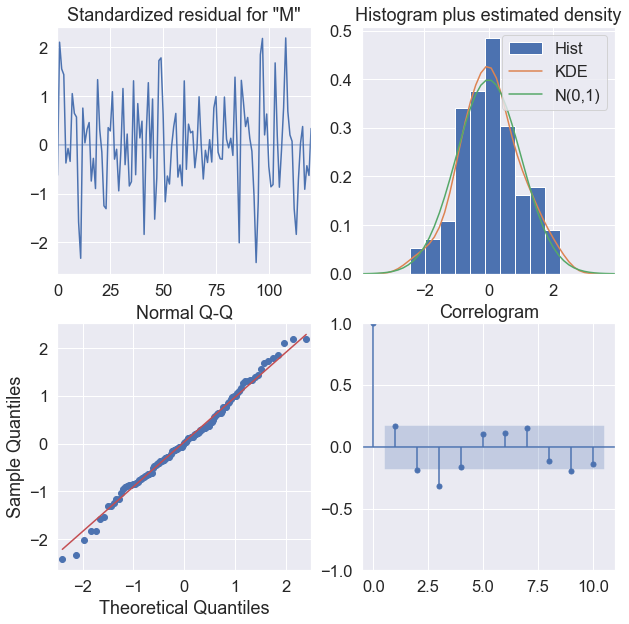

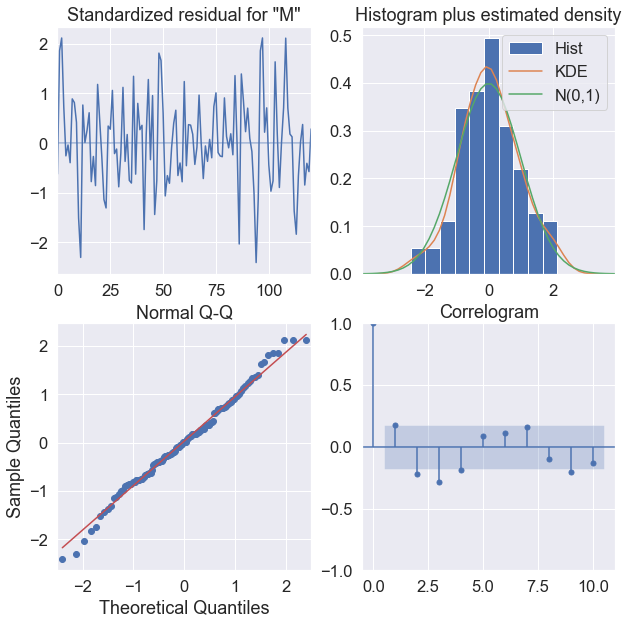

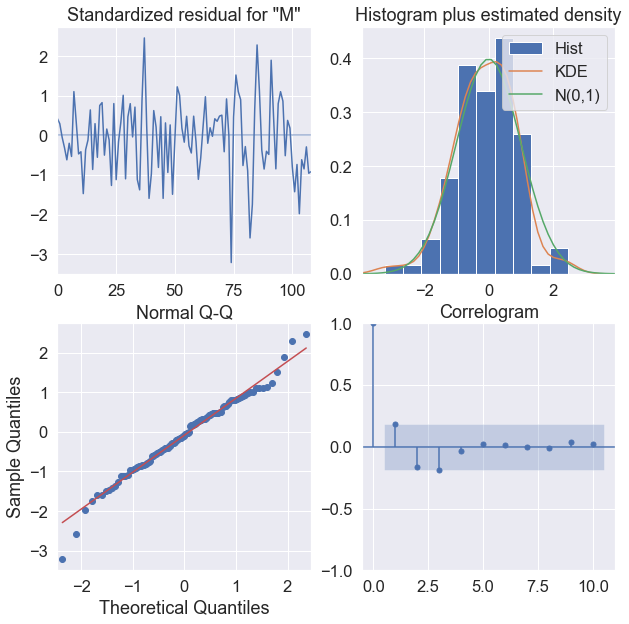

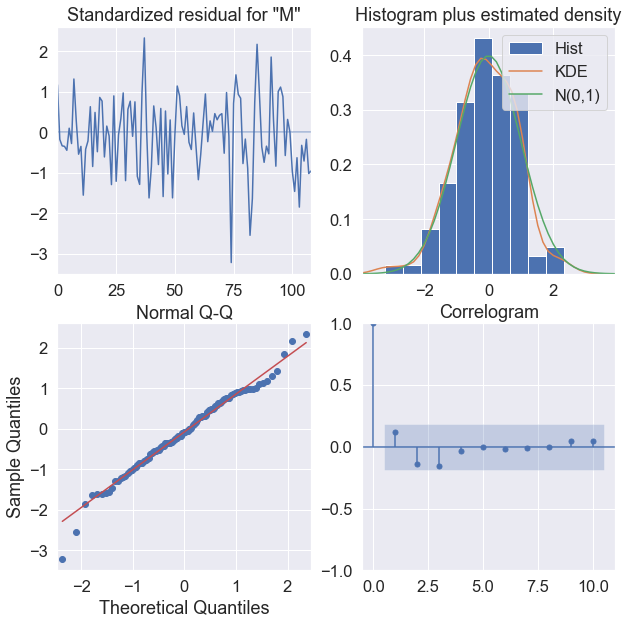

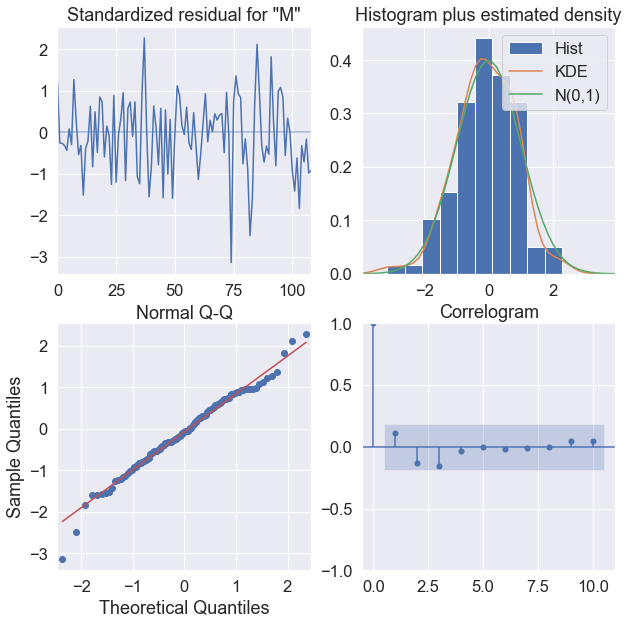

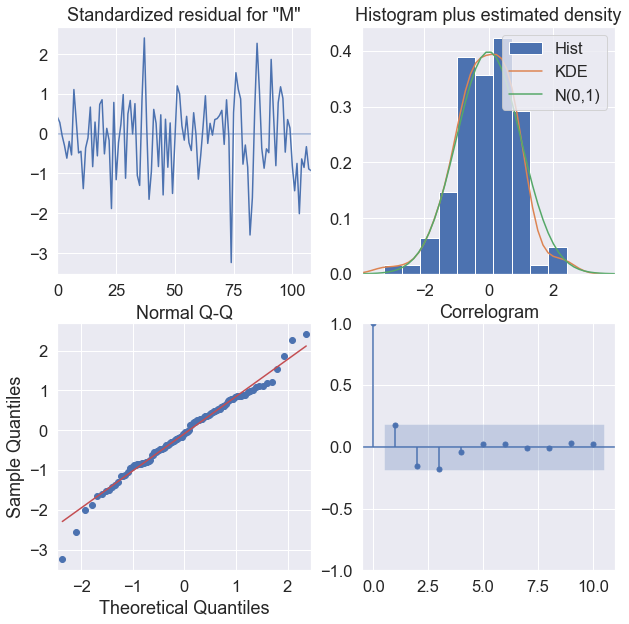

In [374]:
SARIMA_model11_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model22_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model33_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model44_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model55_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model66_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model77_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model88_fit.plot_diagnostics(figsize=(10,10));
SARIMA_model88_fit.plot_diagnostics(figsize=(10,10));

In [375]:
from statsmodels.stats.diagnostic import acorr_ljungbox
 
residuals = SARIMA_model11_fit.resid
 
print("S11: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model22_fit.resid
 
print("S22: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model33_fit.resid
 
print("S33: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model44_fit.resid
 
print("S44: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model55_fit.resid
 
print("S55: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model66_fit.resid
 
print("S66: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model77_fit.resid
 
print("S77: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

residuals = SARIMA_model88_fit.resid
 
print("S88: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))

#Have to add additional lines here 


S11: 
      lb_stat  lb_pvalue
1   0.139277   0.709001
2   0.152544   0.926564
3   0.153025   0.984791
4   0.323481   0.988248
5   0.377718   0.995921
6   0.587119   0.996611
7   0.788743   0.997557
8   0.789492   0.999261
9   1.011206   0.999411
10  1.124270   0.999706
S22: 
      lb_stat  lb_pvalue
1   0.139399   0.708879
2   0.139458   0.932647
3   0.173795   0.981705
4   0.249100   0.992859
5   0.259223   0.998340
6   0.311827   0.999438
7   0.470228   0.999548
8   0.471437   0.999893
9   0.693126   0.999878
10  0.808489   0.999936
S33: 
      lb_stat  lb_pvalue
1   0.112693   0.737099
2   0.233772   0.889686
3   0.472139   0.924968
4   0.485192   0.974926
5   0.535665   0.990759
6   0.731076   0.993796
7   0.939321   0.995749
8   0.944334   0.998576
9   1.236291   0.998671
10  1.322571   0.999390
S44: 
      lb_stat  lb_pvalue
1   0.137787   0.710491
2   0.150668   0.927434
3   0.151185   0.985056
4   0.291209   0.990375
5   0.344785   0.996715
6   0.559573   0.997036
7   0.765792

In [422]:
test2

,Month,Median Price,naive_seasonal,ARIMA_pred2
122,2023-03,850000,979000,881123.161719
123,2023-04,875000,980000,881644.511405
124,2023-05,928800,980000,886984.773039


In [423]:
SARIMA_pred11 = SARIMA_model11_fit.get_prediction(122,124).predicted_mean
 
test2['SARIMA_pred11'] = SARIMA_pred11

SARIMA_pred22 = SARIMA_model22_fit.get_prediction(122,124).predicted_mean
 
test2['SARIMA_pred22'] = SARIMA_pred22

SARIMA_pred33 = SARIMA_model33_fit.get_prediction(122,124).predicted_mean
 
test2['SARIMA_pred33'] = SARIMA_pred33

SARIMA_pred44 = SARIMA_model44_fit.get_prediction(122,124).predicted_mean
 
test2['SARIMA_pred44'] = SARIMA_pred44

SARIMA_pred55 = SARIMA_model55_fit.get_prediction(122,124).predicted_mean
 
test2['SARIMA_pred55'] = SARIMA_pred55

SARIMA_pred66 = SARIMA_model66_fit.get_prediction(122,124).predicted_mean
 
test2['SARIMA_pred66'] = SARIMA_pred66

SARIMA_pred77 = SARIMA_model77_fit.get_prediction(122,124).predicted_mean
 
test2['SARIMA_pred77'] = SARIMA_pred77

SARIMA_pred88 = SARIMA_model88_fit.get_prediction(122,124).predicted_mean
 
test2['SARIMA_pred88'] = SARIMA_pred88


/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/3745478482.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test2['SARIMA_pred11'] = SARIMA_pred11
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/3745478482.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test2['SARIMA_pred22'] = SARIMA_pred22
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/3745478482.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

In [424]:
test2

,Month,Median Price,naive_seasonal,ARIMA_pred2,SARIMA_pred11,SARIMA_pred22,SARIMA_pred33,SARIMA_pred44,SARIMA_pred55,SARIMA_pred66,SARIMA_pred77,SARIMA_pred88
122,2023-03,850000,979000,881123.161719,877361.802088,877689.929436,878707.496099,877482.235106,877175.533909,879998.388848,879559.440217,876302.105673
123,2023-04,875000,980000,881644.511405,882366.219589,882130.220282,883452.276249,882545.284351,868110.275119,876347.006622,875398.394119,864014.585745
124,2023-05,928800,980000,886984.773039,886889.518480,886146.464681,889179.506971,887145.086050,871710.590405,881789.287708,880588.108772,869419.839060


In [425]:
def mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
 
mape_naive_seasonal = mape(test2['Median Price'], test2['naive_seasonal'])
mape_ARIMA2 = mape(test2['Median Price'], test2['ARIMA_pred2'])
mape_SARIMA11 = mape(test2['Median Price'], test2['SARIMA_pred11'])
mape_SARIMA22 = mape(test2['Median Price'], test2['SARIMA_pred22'])
mape_SARIMA33 = mape(test2['Median Price'], test2['SARIMA_pred33'])
mape_SARIMA44 = mape(test2['Median Price'], test2['SARIMA_pred44'])
mape_SARIMA55 = mape(test2['Median Price'], test2['SARIMA_pred55'])
mape_SARIMA66 = mape(test2['Median Price'], test2['SARIMA_pred66'])
mape_SARIMA77 = mape(test2['Median Price'], test2['SARIMA_pred77'])
mape_SARIMA88 = mape(test2['Median Price'], test2['SARIMA_pred88'])

In [426]:
print("MAPE NAIVE: ", mape_naive_seasonal)
print("MAPE ARIMA2: ", mape_ARIMA2)
print("MAPE SARIMA11: ", mape_SARIMA11)
print("MAPE SARIMA22: ", mape_SARIMA22)
print("MAPE SARIMA33: ", mape_SARIMA33)
print("MAPE SARIMA44: ", mape_SARIMA44)
print("MAPE SARIMA55: ", mape_SARIMA55)
print("MAPE SARIMA66: ", mape_SARIMA66)
print("MAPE SARIMA77: ", mape_SARIMA77)
print("MAPE SARIMA88: ", mape_SARIMA88)

MAPE NAIVE:  10.896319940551585
MAPE ARIMA2:  2.974330418577742
MAPE SARIMA11:  2.8577383173583484
MAPE SARIMA22:  2.888282768638174
MAPE SARIMA33:  2.869699733543617
MAPE SARIMA44:  2.86011073282675
MAPE SARIMA55:  3.377032008678128
MAPE SARIMA66:  2.9148706766229964
MAPE SARIMA77:  2.9046280181551847
MAPE SARIMA88:  3.581018045638621


In [381]:
# Create a dictionary with the MAPE and RMSE values
data = {'MAPE': [mape_naive_seasonal, mape_ARIMA2, mape_SARIMA11, mape_SARIMA22, mape_SARIMA33, mape_SARIMA44]}
# Create a DataFrame from the dictionary
df = pd.DataFrame(data)

# Set the index of the DataFrame to be the MAPE and RMSE titles
df.index = ['Naive - Mar:May2022' , 'ARIMA(9,1,11)', 'SARIMA(0,1,3)(1,0,1)', 'SARIMA(3,1,0)(1,0,1)', 'SARIMA(2,1,1)(1,0,1)', 
           'SARIMA(1,1,3)(1,0,1)']

df

,MAPE
Naive - Mar:May2022,10.896320
"ARIMA(9,1,11)",2.974330
"SARIMA(0,1,3)(1,0,1)",2.857738
"SARIMA(3,1,0)(1,0,1)",2.888283
"SARIMA(2,1,1)(1,0,1)",2.869700
"SARIMA(1,1,3)(1,0,1)",2.860111


In [142]:
test2['Month'] = test2['Month'].astype(str)
test2['Month'] = pd.to_datetime(test2['Month'])

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/4062089175.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test2['Month'] = test2['Month'].astype(str)
/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/4062089175.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test2['Month'] = pd.to_datetime(test2['Month'])


KeyError: 'SARIMA_pred1'

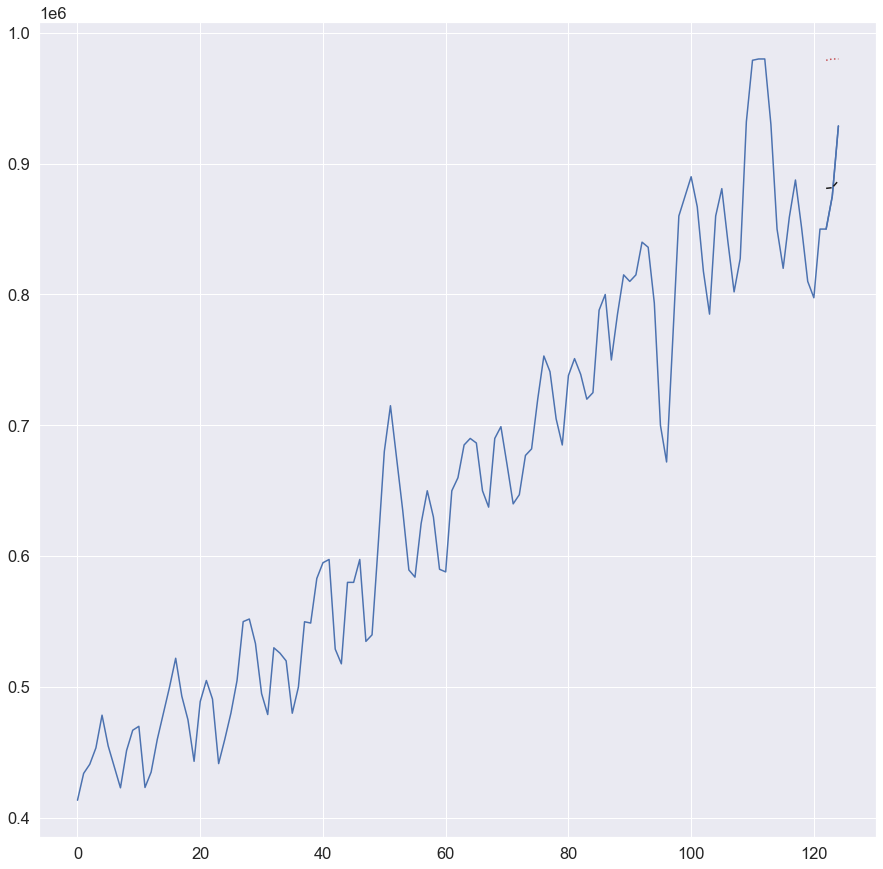

In [143]:
fig, ax = plt.subplots(figsize=(15, 15))
#plt.figure(figsize=(20, 20))
t_stats['Month'] = t_stats['Month'].astype(str)
t_stats['Month'] = pd.to_datetime(t_stats['Month'])
 
ax.plot(t_stats['Median Price'])
ax.plot(test2['Median Price'], 'b-', label='actual')
ax.plot(test2['naive_seasonal'], 'r:', label='naive seasonal')
ax.plot(test2['ARIMA_pred2'], 'k--', label='ARIMA(9,1,11)')
ax.plot(test2['SARIMA_pred1'], 'o-.', label='SARIMA(0,1,3)(1,0,1,12)')
ax.plot(test2['SARIMA_pred2'], 'g-.', label='SARIMA(2,1,1)(1,0,1,12)')
ax.plot(test2['SARIMA_pred3'], 'y-.', label='SARIMA(2,1,2)(1,1,2,12)')
ax.plot(test2['SARIMA_pred4'], 'r-.', label='SARIMA(3,1,2)(1,1,2,12)')

ax.set_xlabel('Date')
ax.set_ylabel('Median House Price')
ax.axvspan(120, 124, color='#808080', alpha=0.2)
 
ax.legend(loc=0)
 
#plt.xticks(np.arange(0, 124, 12), np.arange(2013, 2023, 1))
ax.set_xlim(108, 123)
 
fig.autofmt_xdate()
plt.tight_layout()

In [144]:
import statsmodels.api as sm

macro_econ_data = sm.datasets.macrodata.load_pandas().data
macro_econ_data

,year,quarter,realgdp,realcons,realinv,realgovt,realdpi,cpi,m1,tbilrate,unemp,pop,infl,realint
0,1959.0,1.0,2710.349,1707.4,286.898,470.045,1886.9,28.980,139.7,2.82,5.8,177.146,0.00,0.00
1,1959.0,2.0,2778.801,1733.7,310.859,481.301,1919.7,29.150,141.7,3.08,5.1,177.830,2.34,0.74
2,1959.0,3.0,2775.488,1751.8,289.226,491.260,1916.4,29.350,140.5,3.82,5.3,178.657,2.74,1.09
3,1959.0,4.0,2785.204,1753.7,299.356,484.052,1931.3,29.370,140.0,4.33,5.6,179.386,0.27,4.06
4,1960.0,1.0,2847.699,1770.5,331.722,462.199,1955.5,29.540,139.6,3.50,5.2,180.007,2.31,1.19
5,1960.0,2.0,2834.390,1792.9,298.152,460.400,1966.1,29.550,140.2,2.68,5.2,180.671,0.14,2.55
6,1960.0,3.0,2839.022,1785.8,296.375,474.676,1967.8,29.750,140.9,2.36,5.6,181.528,2.70,-0.34
7,1960.0,4.0,2802.616,1788.2,259.764,476.434,1966.6,29.840,141.1,2.29,6.3,182.287,1.21,1.08
8,1961.0,1.0,2819.264,1787.7,266.405,475.854,1984.5,29.810,142.1,2.37,6.8,182.992,-0.40,2.77
9,1961.0,2.0,2872.005,1814.3,286.246,480.328,2014.4,29.920,142.9,2.29,7.0,183.691,1.47,0.81


In [145]:
target = macro_econ_data['realgdp']
exog = macro_econ_data[['realcons', 'realinv', 'realgovt', 'realdpi', 'cpi']]

In [146]:
from sklearn import metrics

In [147]:
target_train = target[:200]
exog_train = exog[:200]

In [148]:
target_train = target[:196]
target_test = target[196:]
target_train

0       2710.349
1       2778.801
2       2775.488
3       2785.204
4       2847.699
5       2834.390
6       2839.022
7       2802.616
8       2819.264
9       2872.005
10      2918.419
11      2977.830
12      3031.241
13      3064.709
14      3093.047
15      3100.563
16      3141.087
17      3180.447
18      3240.332
19      3264.967
20      3338.246
21      3376.587
22      3422.469
23      3431.957
24      3516.251
25      3563.960
26      3636.285
27      3724.014
28      3815.423
29      3828.124
30      3853.301
31      3884.520
32      3918.740
33      3919.556
34      3950.826
35      3980.970
36      4063.013
37      4131.998
38      4160.267
39      4178.293
40      4244.100
41      4256.460
42      4283.378
43      4263.261
44      4256.573
45      4264.289
46      4302.259
47      4256.637
48      4374.016
49      4398.829
50      4433.943
51      4446.264
52      4525.769
53      4633.101
54      4677.503
55      4754.546
56      4876.166
57      4932.571
58      4906.2

In [149]:
target_test

196    13366.865
197    13415.266
198    13324.600
199    13141.920
200    12925.410
201    12901.504
202    12990.341
Name: realgdp, dtype: float64

In [382]:
from typing import Union
from tqdm import tqdm_notebook
from statsmodels.tsa.statespace.sarimax import SARIMAX
 
def optimize_SARIMAX(endog: Union[pd.Series, list], exog: Union[pd.Series, 
 list], order_list: list, d: int, D: int, s: int) -> pd.DataFrame:
    
    results = []
    
    for order in tqdm_notebook(order_list):
        try: 
            model = SARIMAX(
                endog,
                exog,
                order=(order[0], d, order[1]),
                seasonal_order=(order[2], D, order[3], s),
                simple_differencing=False).fit(disp=False)
        except:
            continue
            
        aic = model.aic
        results.append([order, aic])
        
    result_df = pd.DataFrame(results)
    result_df.columns = ['(p,q,P,Q)', 'AIC']
    
    #Sort in ascending order, lower AIC is better
    result_df = result_df.sort_values(by='AIC', 
 ascending=True).reset_index(drop=True)
    
    return result_df

In [383]:
p = range(0, 4, 1)
d = 1
q = range(0, 4, 1)
P = range(0, 4, 1)
D = 0
Q = range(0, 4, 1)
s = 12
 
parameters = product(p, q, P, Q)
parameters_list = list(parameters)

In [155]:
# t_stats['Month'] = t_stats['Month'].astype('str') 
# t_stats['Month'] = pd.to_datetime(t_stats['Month'])
# t_stats['Month'] = t_stats['Month'].dt.to_period('M')
# t_stats

,Month,Median Price
0,2013-01,413500
1,2013-02,434000
2,2013-03,441000
3,2013-04,453500
4,2013-05,478500
5,2013-06,455000
6,2013-07,439000
7,2013-08,423000
8,2013-09,451510
9,2013-10,467000


In [156]:
# CPI_Can
# New_Housing_Price_Index
# Inflation
# GDP
# ON_Unemployment_Rate
# Bank_Rate
# CAN_Mort_Lending_Rate5yr
# Mortgage_Var_Rate
# Mortgage_Fixed_Rate_5yr
# TO_Units_Absorbed 
# Bond_1-3yr_Avg

x_stats = exo_stats[13:].copy()
x_stats = x_stats[['CPI_Can', 'New_Housing_Price_Index', 'Inflation', 'GDP', 'ON_Unemployment_Rate', 'Bank_Rate', 'CAN_Mort_Lending_Rate5yr', 'Mortgage_Var_Rate', 'Mortgage_Fixed_Rate_5yr', 'TO_Units_Absorbed', 'Bond_1-3yr_Avg'] ]
x_stats = x_stats[:-2]

x_stats = x_stats.reset_index().rename(columns={'Date': 'Month'})
x_stats['Month'] = x_stats['Month'].astype('str') 
x_stats['Month'] = pd.to_datetime(x_stats['Month'])
x_stats['Month'] = x_stats['Month'].dt.to_period('M')

x_stats = x_stats[['CPI_Can', 'New_Housing_Price_Index', 'Inflation', 'GDP', 'ON_Unemployment_Rate', 'Bank_Rate', 'CAN_Mort_Lending_Rate5yr', 'Mortgage_Var_Rate', 'Mortgage_Fixed_Rate_5yr', 'TO_Units_Absorbed', 'Bond_1-3yr_Avg'] ]
x_stats

,CPI_Can,New_Housing_Price_Index,Inflation,GDP,ON_Unemployment_Rate,Bank_Rate,CAN_Mort_Lending_Rate5yr,Mortgage_Var_Rate,Mortgage_Fixed_Rate_5yr,TO_Units_Absorbed,Bond_1-3yr_Avg
0,121.3,91.8,1.3,1729586.0,7.7,1.25,4.14,3.57,3.00,942.0,1.16
1,122.7,91.9,1.5,1734805.0,7.5,1.25,4.11,3.52,2.98,900.0,1.12
2,122.9,92.0,1.5,1740839.0,7.6,1.25,4.02,3.51,2.99,982.0,1.01
3,122.7,92.2,1.2,1743937.0,7.6,1.25,4.02,3.52,2.99,966.0,1.00
4,123.0,92.4,1.2,1748724.0,7.5,1.25,4.02,3.50,2.96,930.0,1.04
5,123.0,92.5,1.2,1742396.0,7.6,1.25,4.00,3.49,2.93,996.0,1.18
6,123.1,92.7,1.3,1752447.0,7.7,1.25,4.08,3.31,3.00,1085.0,1.17
7,123.1,92.8,1.2,1760130.0,7.7,1.25,4.14,3.13,3.11,1221.0,1.23
8,123.3,92.8,1.3,1766098.0,7.5,1.25,4.33,3.03,3.20,915.0,1.27
9,123.0,92.9,1.2,1775606.0,7.6,1.25,4.40,2.95,3.27,926.0,1.15


In [384]:
target_trainM = t_stats['Median Price'][:-1]
target_trainY = t_stats['Median Price'][:-17]
target_trainQ = t_stats['Median Price'][:-3]
target_train6M = t_stats['Median Price'][:-9]


exog_trainM = x_stats[:-1]
exog_trainY = x_stats[:-17]
exog_trainQ = x_stats[:-3] 
exog_train6M = x_stats[:-9] 

In [385]:
target_testM = t_stats['Median Price'][124:]
target_testY = t_stats['Median Price'][108:120]
target_testQ = t_stats['Median Price'][122:]
target_test6M = t_stats['Median Price'][116:120]

In [334]:
result_dfM = optimize_SARIMAX(target_trainM, exog_trainM, parameters_list, d, D, s)
result_dfM

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_39063/4118411627.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/256 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/u

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaco

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


,"(p,q,P,Q)",AIC
0,"(2, 2, 0, 0)",2882.528065
1,"(2, 2, 1, 0)",2884.523565
2,"(2, 2, 0, 2)",2884.813498
3,"(2, 2, 0, 1)",2885.944629
4,"(2, 2, 0, 3)",2886.187736
5,"(3, 3, 0, 1)",2886.430594
6,"(3, 2, 0, 0)",2886.515127
7,"(2, 2, 1, 1)",2887.822278
8,"(3, 3, 1, 0)",2888.346104
9,"(2, 2, 1, 2)",2889.464026


In [ ]:
# (p,q,P,Q)	AIC
# 0	(2, 2, 0, 0)	2882.528065
# 1	(2, 2, 1, 0)	2884.523565
# 2	(2, 2, 0, 2)	2884.813498
# 3	(2, 2, 0, 1)	2885.944629

In [335]:
result_df = optimize_SARIMAX(target_trainY, exog_trainY, parameters_list, d, D, s)
result_df

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_39063/4118411627.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/256 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estim

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to esti

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likeliho

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estim

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few o

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaco

,"(p,q,P,Q)",AIC
0,"(2, 2, 0, 0)",2505.016123
1,"(2, 2, 0, 2)",2507.818613
2,"(3, 2, 0, 1)",2509.711021
3,"(3, 3, 0, 0)",2511.154086
4,"(3, 3, 1, 0)",2511.471524
5,"(3, 3, 0, 1)",2512.367476
6,"(2, 3, 0, 1)",2512.745940
7,"(3, 3, 0, 3)",2512.960807
8,"(2, 2, 0, 1)",2513.653312
9,"(2, 3, 0, 0)",2514.356236


In [ ]:
# 	(p,q,P,Q)	AIC
# 0	(2, 2, 0, 0)	2505.016123
# 1	(2, 2, 0, 2)	2507.818613
# 2	(3, 2, 0, 1)	2509.711021
# 3	(3, 3, 0, 0)	2511.154086

In [336]:
result_df = optimize_SARIMAX(target_trainQ, exog_trainQ, parameters_list, d, D, s)
result_df

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_39063/4118411627.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/256 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaco

,"(p,q,P,Q)",AIC
0,"(2, 2, 0, 0)",2835.300201
1,"(2, 2, 0, 1)",2837.191294
2,"(3, 3, 0, 0)",2838.342891
3,"(3, 3, 0, 2)",2840.266665
4,"(3, 2, 0, 1)",2841.165404
5,"(2, 2, 2, 1)",2841.243290
6,"(2, 2, 1, 2)",2841.249236
7,"(2, 2, 1, 0)",2841.278504
8,"(3, 2, 0, 0)",2841.434363
9,"(3, 3, 0, 1)",2841.488663


In [ ]:
# (p,q,P,Q)	AIC
# 0	(2, 2, 0, 0)	2835.300201
# 1	(2, 2, 0, 1)	2837.191294
# 2	(3, 3, 0, 0)	2838.342891
# 3	(3, 3, 0, 2)	2840.266665

In [386]:
result_df = optimize_SARIMAX(target_train6M, exog_train6M, parameters_list, d, D, s)
result_df

/var/folders/5t/6l7y1cln3zb54s7r50bzxx080000gn/T/ipykernel_26184/4118411627.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for order in tqdm_notebook(order_list):


  0%|          | 0/256 [00:00<?, ?it/s]

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/u

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/u

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaco

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/User

,"(p,q,P,Q)",AIC
0,"(2, 2, 0, 2)",2697.511992
1,"(3, 2, 0, 0)",2698.001719
2,"(3, 2, 1, 0)",2699.427617
3,"(3, 2, 0, 2)",2699.883857
4,"(2, 2, 0, 0)",2700.125165
5,"(2, 3, 0, 1)",2700.203989
6,"(3, 3, 0, 2)",2700.522198
7,"(3, 3, 2, 0)",2700.894116
8,"(3, 2, 0, 1)",2701.175987
9,"(3, 3, 1, 0)",2701.958987


In [501]:
# (p,q,P,Q)	AIC
# 0	(2, 2, 0, 2)	2697.511992
# 1	(3, 2, 0, 0)	2698.001719
# 2	(3, 2, 1, 0)	2699.427617
# 3	(3, 2, 0, 2)	2699.883857

In [387]:
best_modelM1 = SARIMAX(target_trainM, exog_trainM, order=(2,1,2), 
 seasonal_order=(0,0,0,12), simple_differencing=False)
best_modelM1_fit = best_modelM1.fit(disp=False)

best_modelM2 = SARIMAX(target_trainM, exog_trainM, order=(2,1,2), 
 seasonal_order=(1,0,0,12), simple_differencing=False)
best_modelM2_fit = best_modelM2.fit(disp=False)

best_modelM3 = SARIMAX(target_trainM, exog_trainM, order=(2,1,2), 
 seasonal_order=(0,0,2,12), simple_differencing=False)
best_modelM3_fit = best_modelM3.fit(disp=False)

best_modelM4 = SARIMAX(target_trainM, exog_trainM, order=(2,1,2), 
 seasonal_order=(0,0,1,12), simple_differencing=False)
best_modelM4_fit = best_modelM4.fit(disp=False)

#############

best_modelY1 = SARIMAX(target_trainY, exog_trainY, order=(2,1,2), 
 seasonal_order=(0,0,0,12), simple_differencing=False)
best_modelY1_fit = best_modelY1.fit(disp=False)

best_modelY2 = SARIMAX(target_trainY, exog_trainY, order=(2,1,2), 
 seasonal_order=(0,0,2,12), simple_differencing=False)
best_modelY2_fit = best_modelY2.fit(disp=False)

best_modelY3 = SARIMAX(target_trainY, exog_trainY, order=(2,1,2), 
 seasonal_order=(0,0,1,12), simple_differencing=False)
best_modelY3_fit = best_modelY3.fit(disp=False)

best_modelY4 = SARIMAX(target_trainY, exog_trainY, order=(3,1,3), 
 seasonal_order=(0,0,0,12), simple_differencing=False)
best_modelY4_fit = best_modelY4.fit(disp=False)

###############

best_model6M1 = SARIMAX(target_train6M, exog_train6M, order=(2,1,2), 
 seasonal_order=(0,0,2,12), simple_differencing=False)
best_modelY1_fit = best_modelY1.fit(disp=False)

best_model6M2 = SARIMAX(target_train6M, exog_train6M, order=(3,1,2), 
 seasonal_order=(0,0,0,12), simple_differencing=False)
best_model6M2_fit = best_model6M2.fit(disp=False)

best_model6M3 = SARIMAX(target_train6M, exog_train6M, order=(3,1,2), 
 seasonal_order=(1,0,0,12), simple_differencing=False)
best_model6M3_fit = best_model6M3.fit(disp=False)

best_model6M4 = SARIMAX(target_train6M, exog_train6M, order=(3,1,2), 
 seasonal_order=(0,0,2,12), simple_differencing=False)
best_model6M4_fit = best_model6M4.fit(disp=False)

#################

best_modelQ1 = SARIMAX(target_trainQ, exog_trainQ, order=(2,1,2), 
 seasonal_order=(1,0,1,12), simple_differencing=False)
best_modelQ1_fit = best_modelQ1.fit(disp=False)

best_modelQ2 = SARIMAX(target_trainQ, exog_trainQ, order=(2,1,2), 
 seasonal_order=(0,0,1,12), simple_differencing=False)
best_modelQ2_fit = best_modelQ2.fit(disp=False)

best_modelQ3 = SARIMAX(target_trainQ, exog_trainQ, order=(3,1,3), 
 seasonal_order=(0,0,0,12), simple_differencing=False)
best_modelQ3_fit = best_modelQ3.fit(disp=False)

best_modelQ4 = SARIMAX(target_trainQ, exog_trainQ, order=(3,1,3), 
 seasonal_order=(0,0,2,12), simple_differencing=False)
best_modelQ4_fit = best_modelQ4.fit(disp=False)
 
print(best_modelQ1_fit.summary())


/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

                                      SARIMAX Results                                       
Dep. Variable:                         Median Price   No. Observations:                  122
Model:             SARIMAX(2, 1, 2)x(1, 0, [1], 12)   Log Likelihood               -1403.647
Date:                              Tue, 15 Aug 2023   AIC                           2843.294
Time:                                      02:47:11   BIC                           2893.618
Sample:                                           0   HQIC                          2863.733
                                              - 122                                         
Covariance Type:                                opg                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
CPI_Can                   2.536e+04   6678.514      3.797      0.000  

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


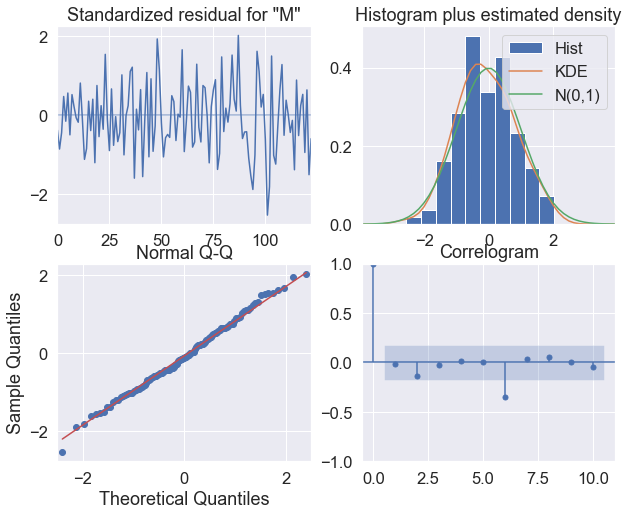

In [162]:
best_modelM1_fit.plot_diagnostics(figsize=(10,8));


In [163]:
residuals = best_modelM1_fit.resid
 
print("S11: \n", acorr_ljungbox(residuals, np.arange(1, 11, 1)))


S11: 
      lb_stat  lb_pvalue
1   0.002111   0.963353
2   0.011599   0.994217
3   0.014587   0.999533
4   0.021178   0.999944
5   0.021357   0.999996
6   0.053935   0.999997
7   0.059553   1.000000
8   0.067385   1.000000
9   0.069754   1.000000
10  0.070017   1.000000


In [164]:
def recursive_forecast(parList, endog: Union[pd.Series, list], exog: Union[pd.Series, list], train_len: int, horizon: int, window: int, method: str) -> list:
    
    p = parList[0]
    q = parList[1]
    d = parList[2]
    P = parList[3]
    Q = parList[4]
    D = parList[5]
    s = parList[6]
    
    total_len = train_len + horizon

    if method == 'last':
        pred_last_value = []
        
        for i in range(train_len, total_len, window):
            last_value = endog[:i].iloc[-1]
            pred_last_value.extend(last_value for _ in range(window))
            
        return pred_last_value
    
    elif method == 'SARIMAX':
        pred_SARIMAX = []
        
        for i in range(train_len, total_len, window):
            model = SARIMAX(endog[:i], exog[:i], order=(p,d,q), seasonal_order=(P,D,Q,s), simple_differencing=False)
            res = model.fit(disp=False)
            predictions = res.get_prediction(exog=exog)
            oos_pred = predictions.predicted_mean.iloc[-window:]
            pred_SARIMAX.extend(oos_pred)
            
        return pred_SARIMAX

In [165]:
target_test = target[196:]

In [166]:
target_test

196    13366.865
197    13415.266
198    13324.600
199    13141.920
200    12925.410
201    12901.504
202    12990.341
Name: realgdp, dtype: float64

In [828]:
# target_testM = t_stats[124:]
# target_testY = t_stats[108:120]
# target_testQ = t_stats[122:]
# target_test6M = t_stats[11:120]

target_testM = t_stats['Median Price'][124:]
 
pred_df_M = pd.DataFrame({'actual': target_testM})
 
TRAIN_LEN = len(target_trainM)
HORIZON = len(target_testM)
WINDOW = 1

parList = [0,0,0,0,0,0,0]
 
pred_last_value_M = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, 
 WINDOW, 'last')

# p = parList[0]
# q = parList[1]
# d = parList[2]
# P = parList[3]
# Q = parList[4]
# D = parList[5]
# s = parList[6]

# (p,q,P,Q)	AIC
# 0	(2, 2, 0, 0)	2882.528065
# 1	(2, 2, 1, 0)	2884.523565
# 2	(2, 2, 0, 2)	2884.813498
# 3	(2, 2, 0, 1)	2885.944629

parList = [2,2,1,0,0,0,12]

pred_SARIMAX_M1 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

parList = [2,2,1,1,0,0,12]

pred_SARIMAX_M2 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

parList = [2,2,1,0,2,0,12]

pred_SARIMAX_M3 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

#parList = [2,2,1,0,1,0,12]
#(2,1,1)(1,0,1)

parList = [2,1,1,1,1,0,12]
pred_SARIMAX_M4 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')
 
pred_df_M['pred_last_value_M'] = pred_last_value_M
pred_df_M['pred_SARIMAX_M1'] = pred_SARIMAX_M1
pred_df_M['pred_SARIMAX_M2'] = pred_SARIMAX_M2
pred_df_M['pred_SARIMAX_M3'] = pred_SARIMAX_M3
pred_df_M['pred_SARIMAX_M4'] = pred_SARIMAX_M4
pred_df_M['pred_SARIMA_M'] = SARIMA_pred3M
pred_df_M['pred_ARIMA_M'] = ARIMA_pred3

pred_df_M

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


,actual,pred_last_value_M,pred_SARIMAX_M1,pred_SARIMAX_M2,pred_SARIMAX_M3,pred_SARIMAX_M4,pred_SARIMA_M,pred_ARIMA_M
124,928800,875000,892403.215333,892448.450846,892563.705093,878991.006894,886869.031045,889966.935891


In [829]:
t_stats.iloc[112:113]

,Month,Median Price
112,2022-05-01,980000


In [830]:
pred_df_M['pred_naive_seasonal'] = t_stats['Median Price'].iloc[112:113].values
pred_df_M

,actual,pred_last_value_M,pred_SARIMAX_M1,pred_SARIMAX_M2,pred_SARIMAX_M3,pred_SARIMAX_M4,pred_SARIMA_M,pred_ARIMA_M,pred_naive_seasonal
124,928800,875000,892403.215333,892448.450846,892563.705093,878991.006894,886869.031045,889966.935891,980000


In [831]:
pred_df_M['pred_lstm_st'] = [977697.56186008]
pred_df_M['pred_lstm_mt'] = [942731.92480206]
pred_df_M

,actual,pred_last_value_M,pred_SARIMAX_M1,pred_SARIMAX_M2,pred_SARIMAX_M3,pred_SARIMAX_M4,pred_SARIMA_M,pred_ARIMA_M,pred_naive_seasonal,pred_lstm_st,pred_lstm_mt
124,928800,875000,892403.215333,892448.450846,892563.705093,878991.006894,886869.031045,889966.935891,980000,977697.56186,942731.924802


In [832]:
def mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
 
mape_last_M = mape(pred_df_M.actual, pred_df_M.pred_last_value_M)
mape_seasonal_M = mape(pred_df_M.actual, pred_df_M.pred_naive_seasonal)
mape_LSTM_ST_M = mape(pred_df_M.actual, pred_df_M.pred_lstm_st)
mape_LSTM_MT_M = mape(pred_df_M.actual, pred_df_M.pred_lstm_mt)
mape_SARIMAX_M1 = mape(pred_df_M.actual, pred_df_M.pred_SARIMAX_M1)
mape_SARIMAX_M1 = mape(pred_df_M.actual, pred_df_M.pred_SARIMAX_M1)
mape_SARIMAX_M2 = mape(pred_df_M.actual, pred_df_M.pred_SARIMAX_M2)
mape_SARIMAX_M3 = mape(pred_df_M.actual, pred_df_M.pred_SARIMAX_M3)
mape_SARIMAX_M4 = mape(pred_df_M.actual, pred_df_M.pred_SARIMAX_M4)
mape_SARIMA_M = mape(pred_df_M.actual, pred_df_M.pred_SARIMA_M)
mape_ARIMA_M = mape(pred_df_M.actual, pred_df_M.pred_ARIMA_M)

rmse_last_M = rmse(pred_df_M.actual, pred_df_M.pred_last_value_M)
rmse_seasonal_M = rmse(pred_df_M.actual, pred_df_M.pred_naive_seasonal)
rmse_LSTM_ST_M = rmse(pred_df_M.actual, pred_df_M.pred_lstm_st)
rmse_LSTM_MT_M = rmse(pred_df_M.actual, pred_df_M.pred_lstm_mt)
rmse_SARIMAX_M1 = rmse(pred_df_M.actual, pred_df_M.pred_SARIMAX_M1)
rmse_SARIMAX_M2 = rmse(pred_df_M.actual, pred_df_M.pred_SARIMAX_M2)
rmse_SARIMAX_M3 = rmse(pred_df_M.actual, pred_df_M.pred_SARIMAX_M3)
rmse_SARIMAX_M4 = rmse(pred_df_M.actual, pred_df_M.pred_SARIMAX_M4)
rmse_SARIMA_M = rmse(pred_df_M.actual, pred_df_M.pred_SARIMA_M)
rmse_ARIMA_M = rmse(pred_df_M.actual, pred_df_M.pred_ARIMA_M)

print("MAPE LAST_M: ", mape_last_M)
print("MAPE SEASONAL_M: ", mape_seasonal_M)
print("MAPE LSTM_ST_M: ", mape_LSTM_ST_M)
print("MAPE LSTM_MT_M: ", mape_LSTM_MT_M)
print("MAPE ARIMA_M: ", mape_ARIMA_M)
print("MAPE SARIMA_M: ", mape_SARIMA_M)
print("MAPE SARIMAX_M1: ", mape_SARIMAX_M1)
print("MAPE SARIMAX_M2: ", mape_SARIMAX_M2)
print("MAPE SARIMAX_M3: ", mape_SARIMAX_M3)
print("MAPE SARIMAX_M4: ", mape_SARIMAX_M4, '\n')

print("RMSE LAST_M: ", rmse_last_M)
print("RMSE SEASONAL_M: ", rmse_seasonal_M)
print("RMSE LSTM_ST_M: ", rmse_LSTM_ST_M)
print("RMSE LSTM_MT_M: ", rmse_LSTM_MT_M)
print("RMSE ARIMA_M: ", rmse_ARIMA_M)
print("RMSE SARIMA_M: ", rmse_SARIMA_M)
print("RMSE SARIMAX_M1: ", rmse_SARIMAX_M1)
print("RMSE SARIMAX_M2: ", rmse_SARIMAX_M2)
print("RMSE SARIMAX_M3: ", rmse_SARIMAX_M3)
print("RMSE SARIMAX_M4: ", rmse_SARIMAX_M4)

MAPE LAST_M:  5.792420327304048
MAPE SEASONAL_M:  5.512489233419466
MAPE LSTM_ST_M:  5.2645953768389315
MAPE LSTM_MT_M:  1.4999919037532305
MAPE ARIMA_M:  4.1809931211318805
MAPE SARIMA_M:  4.514531541188041
MAPE SARIMAX_M1:  3.91868913300103
MAPE SARIMAX_M2:  3.913818815015871
MAPE SARIMAX_M3:  3.9014098737046172
MAPE SARIMAX_M4:  5.3627253559267345 

RMSE LAST_M:  53800.0
RMSE SEASONAL_M:  51200.0
RMSE LSTM_ST_M:  48897.56186007999
RMSE LSTM_MT_M:  13931.924802060006
RMSE ARIMA_M:  38833.064109072904
RMSE SARIMA_M:  41930.968954554526
RMSE SARIMAX_M1:  36396.784667313565
RMSE SARIMAX_M2:  36351.54915386741
RMSE SARIMAX_M3:  36236.294906968484
RMSE SARIMAX_M4:  49808.993105847505


In [834]:
import pandas as pd

# Create a dictionary with the MAPE and RMSE values
data = {'MAPE': [mape_last_M, mape_seasonal_M, mape_LSTM_ST_M, mape_LSTM_MT_M, mape_SARIMAX_M1, mape_SARIMAX_M2, mape_SARIMAX_M3, mape_SARIMAX_M4, mape_SARIMA_M, mape_ARIMA_M],
        'RMSE': [rmse_last_M, rmse_seasonal_M, rmse_LSTM_ST_M, rmse_LSTM_MT_M, rmse_SARIMAX_M1, rmse_SARIMAX_M2, rmse_SARIMAX_M3, rmse_SARIMAX_M4, rmse_SARIMA_M, rmse_ARIMA_M]}

df = pd.DataFrame(data)

df.index = ['Naive - Last Value','Naive - May 22' , 'LSTM Single-Step', 'LSTM Multi-Step', 
            'SARIMAX(2,1,2)(0,0,0)', 'SARIMAX(2,1,2)(1,0,0)', 'SARIMAX(2,1,2)(0,0,2)', 'SARIMAX(2,1,1)(1,0,1)', 
            'SARIMA(2,1,1)(1,0,1)', 'ARIMA(9,1,11)']

df

,MAPE,RMSE
Naive - Last Value,5.792420,53800.000000
Naive - May 22,5.512489,51200.000000
LSTM Single-Step,5.264595,48897.561860
LSTM Multi-Step,1.499992,13931.924802
"SARIMAX(2,1,2)(0,0,0)",3.918689,36396.784667
"SARIMAX(2,1,2)(1,0,0)",3.913819,36351.549154
"SARIMAX(2,1,2)(0,0,2)",3.901410,36236.294907
"SARIMAX(2,1,1)(1,0,1)",5.362725,49808.993106
"SARIMA(2,1,1)(1,0,1)",4.514532,41930.968955
"ARIMA(9,1,11)",4.180993,38833.064109


In [835]:
pred_df_M_PLOT = pred_df_M.copy()
pred_df_M_PLOT['Month'] = ['2023-05']
cols = pred_df_M_PLOT.columns.tolist()
cols = cols[-1:] + cols[:-1]
pred_df_M_PLOT = pred_df_M_PLOT[cols]
pred_df_M_PLOT = pred_df_M_PLOT.reset_index(drop=True)
new_row = pd.DataFrame({'Month': ['2023-04'], 'actual': pred_df_M_PLOT.loc[0, 'pred_last_value_M'], 'pred_last_value_M': pred_df_M_PLOT.loc[0, 'pred_last_value_M'], 'pred_SARIMAX_M1': pred_df_M_PLOT.loc[0, 'pred_last_value_M'], 'pred_SARIMAX_M2': pred_df_M_PLOT.loc[0, 'pred_last_value_M'], 'pred_SARIMAX_M3': pred_df_M_PLOT.loc[0, 'pred_last_value_M'], 'pred_SARIMAX_M4': pred_df_M_PLOT.loc[0, 'pred_last_value_M'], 'pred_SARIMA_M': pred_df_M_PLOT.loc[0, 'pred_last_value_M'], 'pred_ARIMA_M': pred_df_M_PLOT.loc[0, 'pred_last_value_M'], 'pred_naive_seasonal': pred_df_M_PLOT.loc[0, 'pred_last_value_M'], 'pred_lstm_st': pred_df_M_PLOT.loc[0, 'pred_last_value_M'], 'pred_lstm_mt': pred_df_M_PLOT.loc[0, 'pred_last_value_M']})
pred_df_M_PLOT = pd.concat([new_row, pred_df_M_PLOT]).reset_index(drop = True)
pred_df_M_PLOT['Month'] = pd.to_datetime(pred_df_M_PLOT['Month'])
pred_df_M_PLOT.index = [123, 124]
pred_df_M_PLOT

,Month,actual,pred_last_value_M,pred_SARIMAX_M1,pred_SARIMAX_M2,pred_SARIMAX_M3,pred_SARIMAX_M4,pred_SARIMA_M,pred_ARIMA_M,pred_naive_seasonal,pred_lstm_st,pred_lstm_mt
123,2023-04-01,875000,875000,875000.000000,875000.000000,875000.000000,875000.000000,875000.000000,875000.000000,875000,875000.00000,875000.000000
124,2023-05-01,928800,875000,892403.215333,892448.450846,892563.705093,878991.006894,886869.031045,889966.935891,980000,977697.56186,942731.924802


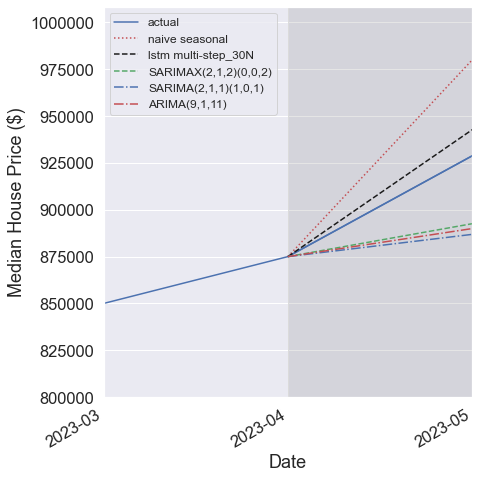

In [836]:
fig, ax = plt.subplots(figsize=(7, 7))
#plt.figure(figsize=(20, 20))
t_stats['Month'] = t_stats['Month'].astype(str)
t_stats['Month'] = pd.to_datetime(t_stats['Month'])
 
ax.plot(t_stats['Median Price'])
ax.plot(pred_df_M_PLOT['actual'], 'b-', label='actual')
ax.plot(pred_df_M_PLOT['pred_naive_seasonal'], 'r:', label='naive seasonal')
ax.plot(pred_df_M_PLOT['pred_lstm_mt'], 'k--', label='lstm multi-step_30N')
ax.plot(pred_df_M_PLOT['pred_SARIMAX_M3'], 'g--', label='SARIMAX(2,1,2)(0,0,2)')
ax.plot(pred_df_M_PLOT['pred_SARIMA_M'], 'b-.', label='SARIMA(2,1,1)(1,0,1)')
ax.plot(pred_df_M_PLOT['pred_ARIMA_M'], 'r-.', label='ARIMA(9,1,11)')


ax.set_xlabel('Date')
ax.set_ylabel('Median House Price ($)')


ax.set_xticks(t_stats.index)
ax.set_xticklabels(t_stats['Month'].dt.strftime('%Y-%m'))
ax.axvspan(123, 124, color='#808080', alpha=0.2)
ax.set_xlim(122, 124)

ax.get_yaxis().get_major_formatter().set_scientific(False)
y_lower_limit = 800000
ax.set_ylim(y_lower_limit, ax.get_ylim()[1])


legend = ax.legend(loc=0, prop={'size': 12})
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

In [546]:
t_stats

,Month,Median Price
0,2013-01-01,413500
1,2013-02-01,434000
2,2013-03-01,441000
3,2013-04-01,453500
4,2013-05-01,478500
5,2013-06-01,455000
6,2013-07-01,439000
7,2013-08-01,423000
8,2013-09-01,451510
9,2013-10-01,467000


In [837]:
# target_testM = t_stats[124:]
# target_testY = t_stats[108:120]
# target_testQ = t_stats[122:]
# target_test6M = t_stats[114:120]

target_testY = t_stats['Median Price'][108:120]
 
pred_df_Y = pd.DataFrame({'actual': target_testY})
 
TRAIN_LEN = len(target_trainY)
HORIZON = len(target_testY)
WINDOW = 1

parList = [0,0,0,0,0,0,0]
 
pred_last_value_Y = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, 
 WINDOW, 'last')

# p = parList[0]
# q = parList[1]
# d = parList[2]
# P = parList[3]
# Q = parList[4]
# D = parList[5]
# s = parList[6]

# 	(p,q,P,Q)	AIC
# 0	(2, 2, 0, 0)	2505.016123
# 1	(2, 2, 0, 2)	2507.818613
# 2	(3, 2, 0, 1)	2509.711021
# 3	(3, 3, 0, 0)	2511.154086

parList = [2,2,1,0,0,0,12]

pred_SARIMAX_Y1 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

parList = [2,2,1,0,2,0,12]

pred_SARIMAX_Y2 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

parList = [3,2,1,0,1,0,12]

pred_SARIMAX_Y3 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

#parList = [3,3,1,0,0,0,12]

parList = [0,3,1,1,1,0,12]
pred_SARIMAX_Y4 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 'SARIMAX')


pred_df_Y['pred_last_value_Y'] = pred_last_value_Y
pred_df_Y['pred_SARIMAX_Y1'] = pred_SARIMAX_Y1
pred_df_Y['pred_SARIMAX_Y2'] = pred_SARIMAX_Y2
pred_df_Y['pred_SARIMAX_Y3'] = pred_SARIMAX_Y3
pred_df_Y['pred_SARIMAX_Y4'] = pred_SARIMAX_Y4
pred_df_Y['pred_SARIMA_Y'] = SARIMA_pred2
pred_df_Y['pred_ARIMA_Y'] = ARIMA_pred1

pred_df_Y

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

,actual,pred_last_value_Y,pred_SARIMAX_Y1,pred_SARIMAX_Y2,pred_SARIMAX_Y3,pred_SARIMAX_Y4,pred_SARIMA_Y,pred_ARIMA_Y
108,827500,802000,8.109035e+05,8.105392e+05,813448.994971,8.156933e+05,805620.514465,788191.853408
109,932000,827500,8.031973e+05,8.168738e+05,806620.880192,8.221752e+05,840625.202239,817869.509062
110,979000,932000,9.088330e+05,9.100843e+05,915010.896853,9.012937e+05,860977.946491,833329.367864
111,980000,979000,1.003430e+06,1.000983e+06,997612.466138,9.741853e+05,865099.110532,822784.854367
112,980000,980000,9.832020e+05,9.840868e+05,982730.146395,9.704709e+05,873206.887102,830879.445380
113,930000,980000,9.992717e+05,9.929287e+05,999668.667583,1.005710e+06,869599.088166,826423.514743
114,850000,930000,9.392790e+05,9.385091e+05,940927.283975,9.322693e+05,852860.462935,816453.920243
115,820000,850000,8.395480e+05,8.421604e+05,838885.411559,8.451354e+05,845017.806173,800509.629194
116,859000,820000,8.602451e+05,8.591055e+05,858625.508409,8.427259e+05,870226.679829,819287.501210
117,887500,859000,8.350717e+05,8.342010e+05,830274.972453,8.349759e+05,875180.137861,859354.609257


In [838]:
t_stats.iloc[96:108]

,Month,Median Price
96,2021-01-01,672000
97,2021-02-01,765000
98,2021-03-01,860000
99,2021-04-01,875000
100,2021-05-01,890000
101,2021-06-01,867000
102,2021-07-01,817700
103,2021-08-01,785000
104,2021-09-01,860000
105,2021-10-01,880900


In [839]:
pred_df_Y['pred_naive_seasonal'] = t_stats['Median Price'].iloc[96:108].values
pred_df_Y['pred_lstm_st'] = [954405.11193871, 961949.69266653, 967609.7574234 , 971760.54811478,
       975350.38372874, 978161.94608808, 980706.25030994, 984413.22028637,
       987002.53462791, 989229.40438986, 990425.93747377, 990150.6767869]
pred_df_Y['pred_lstm_mt'] = [861811.90100312, 856558.24419856, 877775.63643455, 898753.59374285,
       897298.44662547, 855081.95954561, 882764.4662559 , 902683.35199356,
       924390.85817337, 900776.34784579, 915115.26185274, 953564.03386593]
pred_df_Y



,actual,pred_last_value_Y,pred_SARIMAX_Y1,pred_SARIMAX_Y2,pred_SARIMAX_Y3,pred_SARIMAX_Y4,pred_SARIMA_Y,pred_ARIMA_Y,pred_naive_seasonal,pred_lstm_st,pred_lstm_mt
108,827500,802000,8.109035e+05,8.105392e+05,813448.994971,8.156933e+05,805620.514465,788191.853408,672000,954405.111939,861811.901003
109,932000,827500,8.031973e+05,8.168738e+05,806620.880192,8.221752e+05,840625.202239,817869.509062,765000,961949.692667,856558.244199
110,979000,932000,9.088330e+05,9.100843e+05,915010.896853,9.012937e+05,860977.946491,833329.367864,860000,967609.757423,877775.636435
111,980000,979000,1.003430e+06,1.000983e+06,997612.466138,9.741853e+05,865099.110532,822784.854367,875000,971760.548115,898753.593743
112,980000,980000,9.832020e+05,9.840868e+05,982730.146395,9.704709e+05,873206.887102,830879.445380,890000,975350.383729,897298.446625
113,930000,980000,9.992717e+05,9.929287e+05,999668.667583,1.005710e+06,869599.088166,826423.514743,867000,978161.946088,855081.959546
114,850000,930000,9.392790e+05,9.385091e+05,940927.283975,9.322693e+05,852860.462935,816453.920243,817700,980706.250310,882764.466256
115,820000,850000,8.395480e+05,8.421604e+05,838885.411559,8.451354e+05,845017.806173,800509.629194,785000,984413.220286,902683.351994
116,859000,820000,8.602451e+05,8.591055e+05,858625.508409,8.427259e+05,870226.679829,819287.501210,860000,987002.534628,924390.858173
117,887500,859000,8.350717e+05,8.342010e+05,830274.972453,8.349759e+05,875180.137861,859354.609257,880900,989229.404390,900776.347846


In [840]:
def mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
 
mape_last_Y = mape(pred_df_Y.actual, pred_df_Y.pred_last_value_Y)
mape_seasonal_Y = mape(pred_df_Y.actual, pred_df_Y.pred_naive_seasonal)
mape_LSTM_ST_Y = mape(pred_df_Y.actual, pred_df_Y.pred_lstm_st)
mape_LSTM_MT_Y = mape(pred_df_Y.actual, pred_df_Y.pred_lstm_mt)
mape_SARIMAX_Y1 = mape(pred_df_Y.actual, pred_df_Y.pred_SARIMAX_Y1)
mape_SARIMAX_Y2 = mape(pred_df_Y.actual, pred_df_Y.pred_SARIMAX_Y2)
mape_SARIMAX_Y3 = mape(pred_df_Y.actual, pred_df_Y.pred_SARIMAX_Y3)
mape_SARIMAX_Y4 = mape(pred_df_Y.actual, pred_df_Y.pred_SARIMAX_Y4)
mape_SARIMA_Y = mape(pred_df_Y.actual, pred_df_Y.pred_SARIMA_Y)
mape_ARIMA_Y = mape(pred_df_Y.actual, pred_df_Y.pred_ARIMA_Y)

rmse_last_Y = rmse(pred_df_Y.actual, pred_df_Y.pred_last_value_Y)
rmse_seasonal_Y = rmse(pred_df_Y.actual, pred_df_Y.pred_naive_seasonal)
rmse_LSTM_ST_Y = rmse(pred_df_Y.actual, pred_df_Y.pred_lstm_st)
rmse_LSTM_MT_Y = rmse(pred_df_Y.actual, pred_df_Y.pred_lstm_mt)
rmse_SARIMAX_Y1 = rmse(pred_df_Y.actual, pred_df_Y.pred_SARIMAX_Y1)
rmse_SARIMAX_Y2 = rmse(pred_df_Y.actual, pred_df_Y.pred_SARIMAX_Y2)
rmse_SARIMAX_Y3 = rmse(pred_df_Y.actual, pred_df_Y.pred_SARIMAX_Y3)
rmse_SARIMAX_Y4 = rmse(pred_df_Y.actual, pred_df_Y.pred_SARIMAX_Y4)
rmse_SARIMA_Y = rmse(pred_df_Y.actual, pred_df_Y.pred_SARIMA_Y)
rmse_ARIMA_Y = rmse(pred_df_Y.actual, pred_df_Y.pred_ARIMA_Y)

print("MAPE LAST_Y: ", mape_last_Y)
print("MAPE SEASONAL_Y: ", mape_seasonal_Y)
print("MAPE LSTM_ST_Y: ", mape_LSTM_ST_Y)
print("MAPE LSTM_MT_Y: ", mape_LSTM_MT_Y)
print("MAPE ARIMA_Y: ", mape_ARIMA_Y)
print("MAPE SARIMA_Y: ", mape_SARIMA_Y)
print("MAPE SARIMAX_Y1: ", mape_SARIMAX_Y1)
print("MAPE SARIMAX_Y2: ", mape_SARIMAX_Y2)
print("MAPE SARIMAX_Y3: ", mape_SARIMAX_Y3)
print("MAPE SARIMAX_Y4: ", mape_SARIMAX_Y4, '\n')

print("RMSE LAST_Y: ", rmse_last_Y)
print("RMSE SEASONAL_Y: ", rmse_seasonal_Y)
print("RMSE LSTM_ST_Y: ", rmse_LSTM_ST_Y)
print("RMSE LSTM_MT_Y: ", rmse_LSTM_MT_Y)
print("RMSE ARIMA_Y: ", rmse_ARIMA_Y)
print("RMSE SARIMA_Y: ", rmse_SARIMA_Y)
print("RMSE SARIMAX_Y1: ", rmse_SARIMAX_Y1)
print("RMSE SARIMAX_Y2: ", rmse_SARIMAX_Y2)
print("RMSE SARIMAX_Y3: ", rmse_SARIMAX_Y3)
print("RMSE SARIMAX_Y4: ", rmse_SARIMAX_Y4)

MAPE LAST_Y:  4.5621459470129375
MAPE SEASONAL_Y:  7.228835773246243
MAPE LSTM_ST_Y:  10.551902796678565
MAPE LSTM_MT_Y:  7.972510386540693
MAPE ARIMA_Y:  7.5021931202827785
MAPE SARIMA_Y:  5.36568572707267
MAPE SARIMAX_Y1:  5.2383951410419405
MAPE SARIMAX_Y2:  5.066648094631107
MAPE SARIMAX_Y3:  5.120609833570086
MAPE SARIMAX_Y4:  5.25414607190904 

RMSE LAST_Y:  49097.691731214145
RMSE SEASONAL_Y:  87474.80589670758
RMSE LSTM_ST_Y:  108889.82182069086
RMSE LSTM_MT_Y:  78130.25790673259
RMSE ARIMA_Y:  90115.1542792248
RMSE SARIMA_Y:  66348.59875313932
RMSE SARIMAX_Y1:  59582.75166579105
RMSE SARIMAX_Y2:  56527.727575307676
RMSE SARIMAX_Y3:  58726.18346005811
RMSE SARIMAX_Y4:  57515.45625826364


In [841]:
import pandas as pd

# Create a dictionary with the MAPE and RMSE values
data = {'MAPE': [mape_last_Y, mape_seasonal_Y, mape_LSTM_ST_Y, mape_LSTM_MT_Y, mape_SARIMAX_Y1, mape_SARIMAX_Y2, mape_SARIMAX_Y3, mape_SARIMAX_Y4, mape_SARIMA_Y, mape_ARIMA_Y],
        'RMSE': [rmse_last_Y, rmse_seasonal_Y, rmse_LSTM_ST_Y, rmse_LSTM_MT_Y, rmse_SARIMAX_Y1, rmse_SARIMAX_Y2, rmse_SARIMAX_Y3, rmse_SARIMAX_Y4, rmse_SARIMA_Y, rmse_ARIMA_Y]}

# Create a DataFrame from the dictionary
df = pd.DataFrame(data)

# Set the index of the DataFrame to be the MAPE and RMSE titles
df.index = ['Naive - Last Value', 'Naive - 2021' , 'LSTM Single-Step', 'LSTM Multi-Step', 
            'SARIMAX(2,1,2)(0,0,0)', 'SARIMAX(2,1,2)(0,0,2)', 'SARIMAX(3,1,2)(0,0,1)', 'SARIMAX(0,1,3)(1,0,1)', 
            'SARIMA(0,1,3)(1,0,1)', 'ARIMA(7,1,8)']

# Display the DataFrame
df

,MAPE,RMSE
Naive - Last Value,4.562146,49097.691731
Naive - 2021,7.228836,87474.805897
LSTM Single-Step,10.551903,108889.821821
LSTM Multi-Step,7.972510,78130.257907
"SARIMAX(2,1,2)(0,0,0)",5.238395,59582.751666
"SARIMAX(2,1,2)(0,0,2)",5.066648,56527.727575
"SARIMAX(3,1,2)(0,0,1)",5.120610,58726.183460
"SARIMAX(0,1,3)(1,0,1)",5.254146,57515.456258
"SARIMA(0,1,3)(1,0,1)",5.365686,66348.598753
"ARIMA(7,1,8)",7.502193,90115.154279


In [842]:
pred_df_Y_PLOT = pred_df_Y.copy()
pred_df_Y_PLOT['Month'] = t_stats['Month'].iloc[108:120]
cols = pred_df_Y_PLOT.columns.tolist()
cols = cols[-1:] + cols[:-1]
pred_df_Y_PLOT = pred_df_Y_PLOT[cols]
pred_df_Y_PLOT

,Month,actual,pred_last_value_Y,pred_SARIMAX_Y1,pred_SARIMAX_Y2,pred_SARIMAX_Y3,pred_SARIMAX_Y4,pred_SARIMA_Y,pred_ARIMA_Y,pred_naive_seasonal,pred_lstm_st,pred_lstm_mt
108,2022-01-01,827500,802000,8.109035e+05,8.105392e+05,813448.994971,8.156933e+05,805620.514465,788191.853408,672000,954405.111939,861811.901003
109,2022-02-01,932000,827500,8.031973e+05,8.168738e+05,806620.880192,8.221752e+05,840625.202239,817869.509062,765000,961949.692667,856558.244199
110,2022-03-01,979000,932000,9.088330e+05,9.100843e+05,915010.896853,9.012937e+05,860977.946491,833329.367864,860000,967609.757423,877775.636435
111,2022-04-01,980000,979000,1.003430e+06,1.000983e+06,997612.466138,9.741853e+05,865099.110532,822784.854367,875000,971760.548115,898753.593743
112,2022-05-01,980000,980000,9.832020e+05,9.840868e+05,982730.146395,9.704709e+05,873206.887102,830879.445380,890000,975350.383729,897298.446625
113,2022-06-01,930000,980000,9.992717e+05,9.929287e+05,999668.667583,1.005710e+06,869599.088166,826423.514743,867000,978161.946088,855081.959546
114,2022-07-01,850000,930000,9.392790e+05,9.385091e+05,940927.283975,9.322693e+05,852860.462935,816453.920243,817700,980706.250310,882764.466256
115,2022-08-01,820000,850000,8.395480e+05,8.421604e+05,838885.411559,8.451354e+05,845017.806173,800509.629194,785000,984413.220286,902683.351994
116,2022-09-01,859000,820000,8.602451e+05,8.591055e+05,858625.508409,8.427259e+05,870226.679829,819287.501210,860000,987002.534628,924390.858173
117,2022-10-01,887500,859000,8.350717e+05,8.342010e+05,830274.972453,8.349759e+05,875180.137861,859354.609257,880900,989229.404390,900776.347846


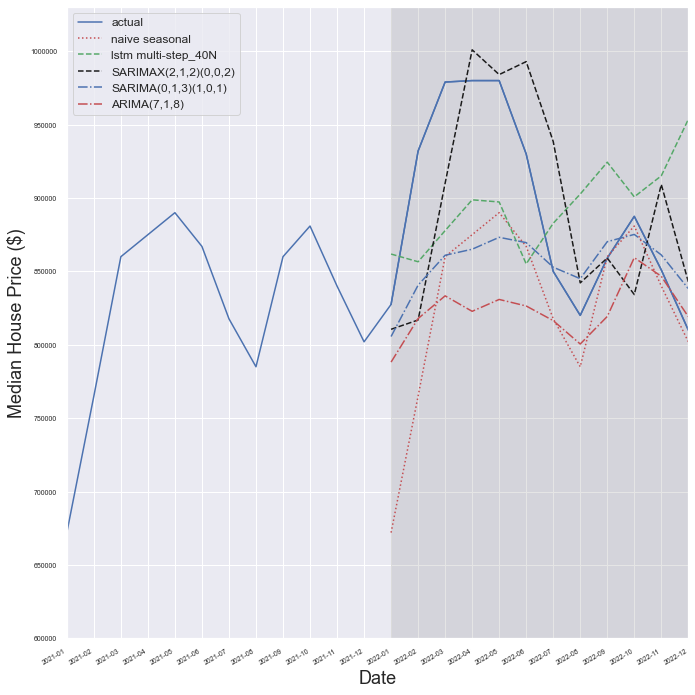

In [856]:
fig, ax = plt.subplots(figsize=(10, 10))
#plt.figure(figsize=(20, 20))
t_stats['Month'] = t_stats['Month'].astype(str)
t_stats['Month'] = pd.to_datetime(t_stats['Month'])
 
ax.plot(t_stats['Median Price'])
ax.plot(pred_df_Y_PLOT['actual'], 'b-', label='actual')
ax.plot(pred_df_Y_PLOT['pred_naive_seasonal'], 'r:', label='naive seasonal')
ax.plot(pred_df_Y_PLOT['pred_lstm_mt'], 'g--', label='lstm multi-step_40N')
ax.plot(pred_df_Y_PLOT['pred_SARIMAX_Y2'], 'k--', label='SARIMAX(2,1,2)(0,0,2)')
ax.plot(pred_df_Y_PLOT['pred_SARIMA_Y'], 'b-.', label='SARIMA(0,1,3)(1,0,1)')
ax.plot(pred_df_Y_PLOT['pred_ARIMA_Y'], 'r-.', label='ARIMA(7,1,8)')


ax.set_xlabel('Date')
ax.set_ylabel('Median House Price ($)')

ax.set_xticks(t_stats.index)
ax.set_xticklabels(t_stats['Month'].dt.strftime('%Y-%m'))
ax.axvspan(108, 119, color='#808080', alpha=0.2)
ax.set_xlim(96, 119)

ax.get_yaxis().get_major_formatter().set_scientific(False)
y_lower_limit = 600000  
ax.set_ylim(y_lower_limit, ax.get_ylim()[1])
ax.tick_params(axis='both', which='both', labelsize=7)


legend = ax.legend(loc=0, prop={'size': 12})
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

#comment on data, variation in seasons and trends (shows success for other dataset)

In [245]:
def timeseries_evaluation_metrics_func(y_true, y_pred):
    def mean_absolute_percentage_error(y_true, y_pred):
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    print('Evaluation metric results:-')
    print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
    print(f'MSE is : {metrics.mean_absolute_error(y_true, y_pred)}')
    print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
    print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
    print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')

In [176]:
def mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def rmse(y_true, y_pred):
    return np.sqrt(metrics.mean_squared_error(y_true, y_pred))

In [427]:
# target_testM = t_stats[124:]
# target_testY = t_stats[108:120]
# target_testQ = t_stats[122:]
# target_test6M = t_stats[116:120]

target_testQ = t_stats['Median Price'][122:]
 
pred_df_Q = pd.DataFrame({'actual': target_testQ})
 
TRAIN_LEN = len(target_trainQ)
HORIZON = len(target_testQ)
WINDOW = 1

parList = [0,0,0,0,0,0,0]
 
pred_last_value_Q = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, 
 WINDOW, 'last')

# p = parList[0]
# q = parList[1]
# d = parList[2]
# P = parList[3]
# Q = parList[4]
# D = parList[5]
# s = parList[6]

# 	(p,q,P,Q)	AIC
# 0	(2, 2, 1, 1)	2483.062945
# 1	(3, 2, 1, 1)	2483.079882
# 2	(2, 3, 1, 1)	2483.195146 *** 
# 3	(2, 2, 0, 2)	2483.321154 *** 

parList = [2,2,1,1,1,0,12]

pred_SARIMAX_Q1 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

parList = [3,2,1,1,1,0,12]

pred_SARIMAX_Q2 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

parList = [2,3,1,1,1,0,12]

pred_SARIMAX_Q3 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

parList = [2,2,1,0,2,0,12]

pred_SARIMAX_Q4 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')
 
pred_df_Q['pred_last_value_Q'] = pred_last_value_Q
pred_df_Q['pred_SARIMAX_Q1'] = pred_SARIMAX_Q1
pred_df_Q['pred_SARIMAX_Q2'] = pred_SARIMAX_Q2
pred_df_Q['pred_SARIMAX_Q3'] = pred_SARIMAX_Q3
pred_df_Q['pred_SARIMAX_Q4'] = pred_SARIMAX_Q4
pred_df_Q['pred_SARIMA_Q'] = SARIMA_pred11
pred_df_Q['pred_ARIMA_Q'] = ARIMA_pred2

pred_df_Q

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

,actual,pred_last_value_Q,pred_SARIMAX_Q1,pred_SARIMAX_Q2,pred_SARIMAX_Q3,pred_SARIMAX_Q4,pred_SARIMA_Q,pred_ARIMA_Q
122,850000,850000,825878.468795,827138.254977,828078.198355,830716.703847,877361.802088,881123.161719
123,875000,850000,893011.797014,890446.544498,887562.746312,891310.903217,882366.219589,881644.511405
124,928800,875000,891019.694015,891149.006621,884853.544598,892563.705093,886889.518480,886984.773039


In [428]:
t_stats.iloc[110:113]

,Month,Median Price
110,2022-03,979000
111,2022-04,980000
112,2022-05,980000


In [430]:
pred_df_Q['pred_naive_seasonal'] = t_stats['Median Price'].iloc[110:113].values
pred_df_Q['pred_lstm_st'] = [985319.9057579 , 981086.72595024, 977697.59562612]
pred_df_Q['pred_lstm_mt'] = [928143.58112216, 869599.25949574, 942305.56112528]
pred_df_Q

,actual,pred_last_value_Q,pred_SARIMAX_Q1,pred_SARIMAX_Q2,pred_SARIMAX_Q3,pred_SARIMAX_Q4,pred_SARIMA_Q,pred_ARIMA_Q,pred_naive_seasonal,pred_lstm_st,pred_lstm_mt
122,850000,850000,825878.468795,827138.254977,828078.198355,830716.703847,877361.802088,881123.161719,979000,985319.905758,928143.581122
123,875000,850000,893011.797014,890446.544498,887562.746312,891310.903217,882366.219589,881644.511405,980000,981086.725950,869599.259496
124,928800,875000,891019.694015,891149.006621,884853.544598,892563.705093,886889.518480,886984.773039,980000,977697.595626,942305.561125


In [432]:
mape_last_Q = mape(pred_df_Q.actual, pred_df_Q.pred_last_value_Q)
mape_seasonal_Q = mape(pred_df_Q.actual, pred_df_Q.pred_naive_seasonal)
mape_LSTM_ST_Q = mape(pred_df_Q.actual, pred_df_Q.pred_lstm_st)
mape_LSTM_MT_Q = mape(pred_df_Q.actual, pred_df_Q.pred_lstm_mt)
mape_SARIMAX_Q1 = mape(pred_df_Q.actual, pred_df_Q.pred_SARIMAX_Q1)
mape_SARIMAX_Q2 = mape(pred_df_Q.actual,pred_df_Q.pred_SARIMAX_Q2)
mape_SARIMAX_Q3 = mape(pred_df_Q.actual, pred_df_Q.pred_SARIMAX_Q3)
mape_SARIMAX_Q4 = mape(pred_df_Q.actual, pred_df_Q.pred_SARIMAX_Q4)
mape_SARIMA_Q = mape(pred_df_Q.actual, pred_df_Q.pred_SARIMA_Q)
mape_ARIMA_Q = mape(pred_df_Q.actual, pred_df_Q.pred_ARIMA_Q)

rmse_last_Q = rmse(pred_df_Q.actual, pred_df_Q.pred_last_value_Q)
rmse_seasonal_Q = rmse(pred_df_Q.actual, pred_df_Q.pred_naive_seasonal)
rmse_LSTM_ST_Q = rmse(pred_df_Q.actual, pred_df_Q.pred_lstm_st)
rmse_LSTM_MT_Q = rmse(pred_df_Q.actual, pred_df_Q.pred_lstm_mt)
rmse_SARIMAX_Q1 = rmse(pred_df_Q.actual, pred_df_Q.pred_SARIMAX_Q1)
rmse_SARIMAX_Q2 = rmse(pred_df_Q.actual, pred_df_Q.pred_SARIMAX_Q2)
rmse_SARIMAX_Q3 = rmse(pred_df_Q.actual, pred_df_Q.pred_SARIMAX_Q3)
rmse_SARIMAX_Q4 = rmse(pred_df_Q.actual, pred_df_Q.pred_SARIMAX_Q4)
rmse_SARIMA_Q = rmse(pred_df_Q.actual, pred_df_Q.pred_SARIMA_Q)
rmse_ARIMA_Q = rmse(pred_df_Q.actual, pred_df_Q.pred_ARIMA_Q)

print("MAPE LAST_Q: ", mape_last_Q)
print("MAPE SEASONAL_Q: ", mape_seasonal_Q)
print("MAPE LSTM_ST_Q: ", mape_LSTM_ST_Q)
print("MAPE LSTM_MT_Q: ", mape_LSTM_MT_Q)
print("MAPE ARIMA_Q: ", mape_ARIMA_Q)
print("MAPE SARIMA_Q: ", mape_SARIMA_Q)
print("MAPE SARIMAX_Q1: ", mape_SARIMAX_Q1)
print("MAPE SARIMAX_Q2: ", mape_SARIMAX_Q2)
print("MAPE SARIMAX_Q3: ", mape_SARIMAX_Q3)
print("MAPE SARIMAX_Q4: ", mape_SARIMAX_Q4, '\n')

print("RMSE LAST_Q: ", rmse_last_Q)
print("RMSE SEASONAL_Q: ", rmse_seasonal_Q)
print("RMSE LSTM_ST_Q: ", rmse_LSTM_ST_Q)
print("RMSE LSTM_MT_Q: ", rmse_LSTM_MT_Q)
print("RMSE ARIMA_Q: ", rmse_ARIMA_Q)
print("RMSE SARIMA_Q: ", rmse_SARIMA_Q)
print("RMSE SARIMAX_Q1: ", rmse_SARIMAX_Q1)
print("RMSE SARIMAX_Q2: ", rmse_SARIMAX_Q2)
print("RMSE SARIMAX_Q3: ", rmse_SARIMAX_Q3)
print("RMSE SARIMAX_Q4: ", rmse_SARIMAX_Q4)

MAPE LAST_Q:  2.8831877281489686
MAPE SEASONAL_Q:  10.896319940551585
MAPE LSTM_ST_Q:  11.102928392145646
MAPE LSTM_MT_Q:  3.7548923620953403
MAPE ARIMA_Q:  2.974330418577742
MAPE SARIMA_Q:  2.8577383173583484
MAPE SARIMAX_Q1:  2.9879884526094598
MAPE SARIMAX_Q2:  2.83622031891445
MAPE SARIMAX_Q3:  2.9154361453678574
MAPE SARIMAX_Q4:  2.678045391784942 

RMSE LAST_Q:  34251.22868842323
RMSE SEASONAL_Q:  100477.92460701671
RMSE LSTM_ST_Q:  103209.8916047356
RMSE LSTM_MT_Q:  45891.13004310173
RMSE ARIMA_Q:  30338.720765178736
RMSE SARIMA_Q:  29208.54821071667
RMSE SARIMAX_Q1:  27890.408265776878
RMSE SARIMAX_Q2:  26949.65939707577
RMSE SARIMAX_Q3:  29267.040191503682
RMSE SARIMAX_Q4:  25501.373445832432


In [433]:
import pandas as pd

# Create a dictionary with the MAPE and RMSE values
data = {'MAPE': [mape_seasonal_Q, mape_LSTM_ST_Q, mape_LSTM_MT_Q, mape_SARIMAX_Q1, mape_SARIMAX_Q2, mape_SARIMAX_Q3, mape_SARIMAX_Q4, mape_SARIMA_Q, mape_ARIMA_Q],
        'RMSE': [rmse_seasonal_Q, rmse_LSTM_ST_Q, rmse_LSTM_MT_Q, rmse_SARIMAX_Q1, rmse_SARIMAX_Q2, rmse_SARIMAX_Q3, rmse_SARIMAX_Q4, rmse_SARIMA_Q, rmse_ARIMA_Q]}

# Create a DataFrame from the dictionary
df = pd.DataFrame(data)

# Set the index of the DataFrame to be the MAPE and RMSE titles
df.index = ['Naive - Mar:May2022' , 'LSTM Single-Step', 'LSTM Multi-Step', 
            'SARIMAX(2,1,2)(1,0,1)', 'SARIMAX(3,1,2)(1,0,1)', 'SARIMAX(2,1,3)(1,0,1)', 'SARIMAX(2,1,2)(0,0,2)', 
            'SARIMA(0,1,3)(1,0,1)', 'ARIMA(9,1,11)']

# Display the DataFrame
df

,MAPE,RMSE
Naive - Mar:May2022,10.896320,100477.924607
LSTM Single-Step,11.102928,103209.891605
LSTM Multi-Step,3.754892,45891.130043
"SARIMAX(2,1,2)(1,0,1)",2.987988,27890.408266
"SARIMAX(3,1,2)(1,0,1)",2.836220,26949.659397
"SARIMAX(2,1,3)(1,0,1)",2.915436,29267.040192
"SARIMAX(2,1,2)(0,0,2)",2.678045,25501.373446
"SARIMA(0,1,3)(1,0,1)",2.857738,29208.548211
"ARIMA(9,1,11)",2.974330,30338.720765


In [440]:
# target_testM = t_stats[124:]
# target_testY = t_stats[108:120]
# target_testQ = t_stats[122:]
# target_test6M = t_stats[116:120]

target_test6M = t_stats['Median Price'][116:120]
 
pred_df_6M = pd.DataFrame({'actual': target_test6M})
 
TRAIN_LEN = len(target_train6M)
HORIZON = len(target_test6M)
WINDOW = 1

parList = [0,0,0,0,0,0,0]
 
pred_last_value_6M = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, 
 WINDOW, 'last')

# p = parList[0]
# q = parList[1]
# d = parList[2]
# P = parList[3]
# Q = parList[4]
# D = parList[5]
# s = parList[6]

# (p,q,P,Q)	AIC
# 0	(2, 2, 0, 0)	2645.894278
# 1	(2, 2, 0, 2)	2648.586357
# 2	(3, 2, 0, 0)	2649.362295
# 3	(3, 3, 0, 0)	2649.520835

parList = [2,2,1,0,0,0,12]

pred_SARIMAX_6M1 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

parList = [2,2,1,0,2,0,12]

pred_SARIMAX_6M2 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

parList = [3,2,1,0,0,0,12]

pred_SARIMAX_6M3 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')

parList = [3,3,1,0,0,0,12]

pred_SARIMAX_6M4 = recursive_forecast(parList, t_stats['Median Price'], x_stats, TRAIN_LEN, HORIZON, WINDOW, 
 'SARIMAX')
 
pred_df_6M['pred_last_value_6M'] = pred_last_value_6M
pred_df_6M['pred_SARIMAX_6M1'] = pred_SARIMAX_6M1
pred_df_6M['pred_SARIMAX_6M2'] = pred_SARIMAX_6M2
pred_df_6M['pred_SARIMAX_6M3'] = pred_SARIMAX_6M3
pred_df_6M['pred_SARIMAX_6M4'] = pred_SARIMAX_6M4
pred_df_6M['pred_SARIMA_6M'] = SARIMA_pred6M4
pred_df_6M['pred_ARIMA_6M'] = ARIMA_pred6

pred_df_6M

/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/user/opt/anaconda3/lib/python3.9/site-packages/st

,actual,pred_last_value_6M,pred_SARIMAX_6M1,pred_SARIMAX_6M2,pred_SARIMAX_6M3,pred_SARIMAX_6M4,pred_SARIMA_6M,pred_ARIMA_6M
116,859000,820000,860245.147469,859105.473685,858221.086321,862767.076924,856676.974692,844018.094275
117,887500,859000,835071.659295,834200.956932,834528.156194,834657.927524,872472.942478,876292.914605
118,851000,887500,908359.157980,909224.581480,908348.649017,909070.525631,860280.247584,856172.482791
119,810000,851000,842576.714551,842873.588979,842939.498978,845040.688642,833572.939015,826113.205171


In [441]:
t_stats.iloc[104:108]

,Month,Median Price
104,2021-09,860000
105,2021-10,880900
106,2021-11,840000
107,2021-12,802000


In [442]:
pred_df_6M['pred_naive_seasonal'] = t_stats['Median Price'].iloc[104:108].values
pred_df_6M['pred_lstm_st'] = [987002.53462791, 989229.40438986, 990425.93747377, 990150.6767869]
pred_df_6M['pred_lstm_mt'] = [864420.42821646, 883710.9618783 , 870919.30872202, 842726.86740756]
pred_df_6M

,actual,pred_last_value_6M,pred_SARIMAX_6M1,pred_SARIMAX_6M2,pred_SARIMAX_6M3,pred_SARIMAX_6M4,pred_SARIMA_6M,pred_ARIMA_6M,pred_naive_seasonal,pred_lstm_st,pred_lstm_mt
116,859000,820000,860245.147469,859105.473685,858221.086321,862767.076924,856676.974692,844018.094275,860000,987002.534628,864420.428216
117,887500,859000,835071.659295,834200.956932,834528.156194,834657.927524,872472.942478,876292.914605,880900,989229.404390,883710.961878
118,851000,887500,908359.157980,909224.581480,908348.649017,909070.525631,860280.247584,856172.482791,840000,990425.937474,870919.308722
119,810000,851000,842576.714551,842873.588979,842939.498978,845040.688642,833572.939015,826113.205171,802000,990150.676787,842726.867408


In [443]:
mape_last_6M = mape(pred_df_6M.actual, pred_df_6M.pred_last_value_6M)
mape_seasonal_6M = mape(pred_df_6M.actual, pred_df_6M.pred_naive_seasonal)
mape_LSTM_ST_6M = mape(pred_df_6M.actual, pred_df_6M.pred_lstm_st)
mape_LSTM_MT_6M = mape(pred_df_6M.actual, pred_df_6M.pred_lstm_mt)
mape_SARIMAX_6M1 = mape(pred_df_6M.actual, pred_df_6M.pred_SARIMAX_6M1)
mape_SARIMAX_6M2 = mape(pred_df_6M.actual,pred_df_6M.pred_SARIMAX_6M2)
mape_SARIMAX_6M3 = mape(pred_df_6M.actual, pred_df_6M.pred_SARIMAX_6M3)
mape_SARIMAX_6M4 = mape(pred_df_6M.actual, pred_df_6M.pred_SARIMAX_6M4)
mape_SARIMA_6M = mape(pred_df_6M.actual, pred_df_6M.pred_SARIMA_6M)
mape_ARIMA_6M = mape(pred_df_6M.actual, pred_df_6M.pred_ARIMA_6M)

rmse_last_6M = rmse(pred_df_6M.actual, pred_df_6M.pred_last_value_6M)
rmse_seasonal_6M = rmse(pred_df_6M.actual, pred_df_6M.pred_naive_seasonal)
rmse_LSTM_ST_6M = rmse(pred_df_6M.actual, pred_df_6M.pred_lstm_st)
rmse_LSTM_MT_6M = rmse(pred_df_6M.actual, pred_df_6M.pred_lstm_mt)
rmse_SARIMAX_6M1 = rmse(pred_df_6M.actual, pred_df_6M.pred_SARIMAX_6M1)
rmse_SARIMAX_6M2 = rmse(pred_df_6M.actual, pred_df_6M.pred_SARIMAX_6M2)
rmse_SARIMAX_6M3 = rmse(pred_df_6M.actual, pred_df_6M.pred_SARIMAX_6M3)
rmse_SARIMAX_6M4 = rmse(pred_df_6M.actual, pred_df_6M.pred_SARIMAX_6M4)
rmse_SARIMA_6M = rmse(pred_df_6M.actual, pred_df_6M.pred_SARIMA_6M)
rmse_ARIMA_6M = rmse(pred_df_6M.actual, pred_df_6M.pred_ARIMA_6M)

print("MAPE LAST_6M: ", mape_last_6M)
print("MAPE SEASONAL_6M: ", mape_seasonal_6M)
print("MAPE LSTM_ST_6M: ", mape_LSTM_ST_6M)
print("MAPE LSTM_MT_6M: ", mape_LSTM_MT_6M)
print("MAPE ARIMA_6M: ", mape_ARIMA_6M)
print("MAPE SARIMA_6M: ", mape_SARIMA_6M)
print("MAPE SARIMAX_6M1: ", mape_SARIMAX_6M1)
print("MAPE SARIMAX_6M2: ", mape_SARIMAX_6M2)
print("MAPE SARIMAX_6M3: ", mape_SARIMAX_6M3)
print("MAPE SARIMAX_6M4: ", mape_SARIMAX_6M4, '\n')

print("RMSE LAST_6M: ", rmse_last_6M)
print("RMSE SEASONAL_6M: ", rmse_seasonal_6M)
print("RMSE LSTM_ST_6M: ", rmse_LSTM_ST_6M)
print("RMSE LSTM_MT_6M: ", rmse_LSTM_MT_6M)
print("RMSE ARIMA_6M: ", rmse_ARIMA_6M)
print("RMSE SARIMA_6M: ", rmse_SARIMA_6M)
print("RMSE SARIMAX_6M1: ", rmse_SARIMAX_6M1)
print("RMSE SARIMAX_6M2: ", rmse_SARIMAX_6M2)
print("RMSE SARIMAX_6M3: ", rmse_SARIMAX_6M3)
print("RMSE SARIMAX_6M4: ", rmse_SARIMAX_6M4)

MAPE LAST_6M:  4.275557665320276
MAPE SEASONAL_6M:  0.7850819182448716
MAPE LSTM_ST_6M:  16.247102907135304
MAPE LSTM_MT_6M:  1.8597495727759932
MAPE ARIMA_6M:  1.4009942960683084
MAPE SARIMA_6M:  1.491093380900006
MAPE SARIMAX_6M1:  4.203598749985905
MAPE SARIMAX_6M2:  4.229543470194695
MAPE SARIMAX_6M3:  4.216227936914945
MAPE SARIMAX_6M4:  4.385596989599024 

RMSE LAST_6M:  36559.88238493117
RMSE SEASONAL_6M:  7575.618786607468
RMSE LSTM_ST_6M:  140202.8699562733
RMSE LSTM_MT_6M:  19439.422330747435
RMSE ARIMA_6M:  12613.94289373713
RMSE SARIMA_6M:  14773.416610423836
RMSE SARIMAX_6M1:  42135.4857465018
RMSE SARIMAX_6M2:  42753.87075339131
RMSE SARIMAX_6M3:  42368.9186779125
RMSE SARIMAX_6M4:  43030.54525450152


In [ ]:
#reflect on managerial problem ( impact of exo variables)

In [857]:
t_stats

,Month,Median Price
0,2013-01-01,413500
1,2013-02-01,434000
2,2013-03-01,441000
3,2013-04-01,453500
4,2013-05-01,478500
5,2013-06-01,455000
6,2013-07-01,439000
7,2013-08-01,423000
8,2013-09-01,451510
9,2013-10-01,467000


In [858]:
x_stats

,CPI_Can,New_Housing_Price_Index,Inflation,GDP,ON_Unemployment_Rate,Bank_Rate,CAN_Mort_Lending_Rate5yr,Mortgage_Var_Rate,Mortgage_Fixed_Rate_5yr,TO_Units_Absorbed,Bond_1-3yr_Avg
0,121.3,91.8,1.3,1729586.0,7.7,1.25,4.14,3.57,3.00,942.0,1.16
1,122.7,91.9,1.5,1734805.0,7.5,1.25,4.11,3.52,2.98,900.0,1.12
2,122.9,92.0,1.5,1740839.0,7.6,1.25,4.02,3.51,2.99,982.0,1.01
3,122.7,92.2,1.2,1743937.0,7.6,1.25,4.02,3.52,2.99,966.0,1.00
4,123.0,92.4,1.2,1748724.0,7.5,1.25,4.02,3.50,2.96,930.0,1.04
5,123.0,92.5,1.2,1742396.0,7.6,1.25,4.00,3.49,2.93,996.0,1.18
6,123.1,92.7,1.3,1752447.0,7.7,1.25,4.08,3.31,3.00,1085.0,1.17
7,123.1,92.8,1.2,1760130.0,7.7,1.25,4.14,3.13,3.11,1221.0,1.23
8,123.3,92.8,1.3,1766098.0,7.5,1.25,4.33,3.03,3.20,915.0,1.27
9,123.0,92.9,1.2,1775606.0,7.6,1.25,4.40,2.95,3.27,926.0,1.15


In [859]:
import pandas as pd



# Export DataFrame to CSV
t_stats_csv = 't_stats.csv'
t_stats.to_csv(t_stats_csv, index=False)

# Export DataFrame to CSV
x_stats_csv = 'x_stats.csv'
x_stats.to_csv(x_stats_csv, index=False)

